In [1]:
import os
from pathlib import Path
from datetime import datetime
import pickle
import random
import math
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.colors as mcolors
import matplotlib.pyplot as plt

from sklearn.preprocessing import StandardScaler, MaxAbsScaler, MinMaxScaler

import torch
import torch.nn as nn
import torch.nn.functional as F


def _find_cnn_root():
    here = Path.cwd().resolve()
    for p in [here, *here.parents]:
        if (p / "data" / "BTCUSDT-1h-data.csv").is_file():
            return p
        cand = p / "CNN" / "data" / "BTCUSDT-1h-data.csv"
        if cand.is_file():
            return (p / "CNN").resolve()
    return here


CNN_ROOT = _find_cnn_root()
ARTIFACTS = CNN_ROOT / "artifacts"
ARTIFACTS.mkdir(parents=True, exist_ok=True)
DATA_CSV = CNN_ROOT / "data" / "BTCUSDT-1h-data.csv"
ARCH_MANIFEST_KEY = "lstm"

os.makedirs("models", exist_ok=True)

def set_all_seeds(seed):
    np.random.seed(seed)
    random.seed(seed)
    torch.manual_seed(seed)

seed = 0
set_all_seeds(seed)



In [2]:
df = pd.read_csv(DATA_CSV)
print(df)


       Unnamed: 0                  timestamp      open_time       open  \
0               0  2017-08-17 04:00:00+00:00  1502942400000    4261.48   
1               1  2017-08-17 05:00:00+00:00  1502946000000    4308.83   
2               2  2017-08-17 06:00:00+00:00  1502949600000    4330.29   
3               3  2017-08-17 07:00:00+00:00  1502953200000    4316.62   
4               4  2017-08-17 08:00:00+00:00  1502956800000    4333.32   
...           ...                        ...            ...        ...   
69079        8755  2025-07-09 19:00:00+00:00  1752087600000  109536.50   
69080        8756  2025-07-09 20:00:00+00:00  1752091200000  111749.99   
69081        8757  2025-07-09 21:00:00+00:00  1752094800000  110714.97   
69082        8758  2025-07-09 22:00:00+00:00  1752098400000  110818.36   
69083        8759  2025-07-09 23:00:00+00:00  1752102000000  111382.17   

            high        low      close       volume     close_time  \
0        4313.62    4261.32    4308.83   

**Check missing values**

In [3]:
print(df.isnull())
print(f"Counts how many missing values there are in each column: {df.isnull().sum()}")
print(f"Total missing values: {df.isnull().sum().sum()}")

       Unnamed: 0  timestamp  open_time   open   high    low  close  volume  \
0           False      False      False  False  False  False  False   False   
1           False      False      False  False  False  False  False   False   
2           False      False      False  False  False  False  False   False   
3           False      False      False  False  False  False  False   False   
4           False      False      False  False  False  False  False   False   
...           ...        ...        ...    ...    ...    ...    ...     ...   
69079       False      False      False  False  False  False  False   False   
69080       False      False      False  False  False  False  False   False   
69081       False      False      False  False  False  False  False   False   
69082       False      False      False  False  False  False  False   False   
69083       False      False      False  False  False  False  False   False   

       close_time  quote_av  trades  tb_base_av  tb

**Split data**

In [4]:
TRAIN_END = 54000
VAL_END = 63000
assert TRAIN_END < VAL_END <= len(df), f"{TRAIN_END=} {VAL_END=} len(df)={len(df)}"

df_train = df.iloc[:TRAIN_END].copy()
df_val = df.iloc[TRAIN_END:VAL_END].copy()

print(f"Train rows [0:{TRAIN_END}]: {len(df_train)}")
print(f"Val rows   [{TRAIN_END}:{VAL_END}]: {len(df_val)} (equity + checkpoints; not holdout)")
print(f"Holdout    [{VAL_END}:] reserved for CNN/backtest (not used in this notebook)")


Train rows [0:54000]: 54000
Val rows   [54000:63000]: 9000 (equity + checkpoints; not holdout)
Holdout    [63000:] reserved for CNN/backtest (not used in this notebook)


**Building Meaningful Features**

In [5]:
def build_features(opens, highs, lows, closes, volumes, train_scalers=None):

    # Build features
    feature1 = (closes - opens) / opens
    feature2 = (highs - opens) / opens
    feature3 = (highs - closes) / closes
    feature4 = (lows - opens) / opens
    feature5 = (lows - closes) / closes
    feature6 = (highs - lows) / opens
    feature7 = (highs - lows) / closes
    feature8 = volumes

    # Stack features
    features = [
        feature1,
        feature2,
        feature3,
        feature4,
        feature5,
        feature6,
        feature7,
        feature8,
    ]
    num_features = len(features)
    scaled_fts = []

    if train_scalers is None:
        train_scalers = [MaxAbsScaler() for _ in range(num_features)]
        is_train = True
    else:
        is_train = False

    for i in range(num_features):
        # Get train scaler
        scaler = train_scalers[i]
        if is_train:
            # Scaler -> Fit -> Train dataset
            scaled_ft = scaler.fit_transform(features[i].reshape(-1, 1))
            # Save the train scaler in a list
        elif not is_train:
            # Scaler -> NOT Fit -> Test dataset
            scaled_ft = scaler.transform(features[i].reshape(-1, 1))

        # Update list of SCALED features
        scaled_fts.append(scaled_ft.flatten())

    # Stack features
    scaled_features = np.stack(scaled_fts, axis=-1)

    # Get num. features
    num_features = scaled_features.shape[-1]
    return scaled_features, num_features, train_scalers

**Example of how the scaler works**

In [6]:
import numpy as np
from sklearn.preprocessing import MaxAbsScaler

# Suppose we have a simple 1D array (e.g. daily returns)
X = np.array([ -2, -1, 0, 1, 2 ])

print("Original data:", X)

# Step 1: reshape into 2D (because sklearn expects shape (n_samples, n_features))
X_2d = X.reshape(-1, 1)

# Step 2: create the scaler and fit_transform
scaler = MaxAbsScaler()
X_scaled = scaler.fit_transform(X_2d)

# Step 3: flatten back to 1D for convenience
X_scaled = X_scaled.flatten()

print("Scaled data:", X_scaled)


Original data: [-2 -1  0  1  2]
Scaled data: [-1.  -0.5  0.   0.5  1. ]


**Preprocess data**

In [7]:
def preprocess_data(seq_len, df, train_scalers=None):
    m = len(df)

    opens = np.array(df['open'].values)
    highs = np.array(df['high'].values)
    lows = np.array(df['low'].values)
    closes = np.array(df['close'].values)
    volumes = np.array(df['volume'].values)

    # Build features
    features, num_features, train_scalers = build_features(opens, highs, lows, closes, volumes, train_scalers)

    # Calculate number of samples
    num_samples = m - seq_len

    # Create storage for inputs & targets
    X = np.zeros([num_samples, seq_len, num_features], dtype=np.float32)
    Y = np.zeros([num_samples, num_features], dtype=np.float32)

    # Create samples (X, Y)
    for i in range(num_samples):
        X[i] = features[i : i+seq_len]
        Y[i] = features[i+seq_len : i+seq_len+1]

    # Fix alignment
    opens = np.array(opens[seq_len:])
    closes = np.array(closes[seq_len:])

    return X, Y, num_features, opens, closes, train_scalers

In [8]:
# Sequence Length
seq_len = 48

# Preprocess data (fit scalers on train only; transform val slice for epoch equity)
X_train, Y_train, num_features, _, _, train_scalers = preprocess_data(seq_len, df_train)
X_val, Y_val, num_features, val_opens, val_closes, _ = preprocess_data(seq_len, df_val, train_scalers)



In [9]:
m_train = X_train.shape[0]
m_val = X_val.shape[0]
print(f"m_train: {m_train}")
print(f"m_val: {m_val}")
print(f"X_train shape: {X_train.shape}")
print(f"Y_train shape: {Y_train.shape}")
print(f"X_val shape: {X_val.shape}")
print(f"Y_val shape: {Y_val.shape}")


m_train: 53952
m_val: 8952
X_train shape: (53952, 48, 8)
Y_train shape: (53952, 8)
X_val shape: (8952, 48, 8)
Y_val shape: (8952, 8)


**Transform data to Torch Tensor**

In [10]:
device = torch.device("cuda:0" if torch.cuda.is_available() else 'cpu')
print("my deive: ", device)

X_train = torch.from_numpy(X_train.astype(np.float32)).to(device, dtype=torch.float32)
Y_train = torch.from_numpy(Y_train.astype(np.float32)).to(device, dtype=torch.float32)

X_val = torch.from_numpy(X_val.astype(np.float32)).to(device, dtype=torch.float32)
Y_val = torch.from_numpy(Y_val.astype(np.float32)).to(device, dtype=torch.float32)

Y_pred_val = torch.zeros([m_val, num_features], device=device, dtype=torch.float32)


my deive:  cuda:0


**Build model**

In [11]:
class Model(nn.Module):
    def __init__(self):
        super().__init__()

        # LSTM
        self.lstm = nn.LSTM(input_size=num_features,
                            hidden_size=64,
                            num_layers=1,
                            batch_first=True)

        # Output layer
        self.fc_out = nn.Linear(64, num_features)

    def forward(self, x):
        # LSTM
        x, (h_n, c_n) = self.lstm(x)
        x = x[:, -1, :] 

        # Output layer
        x = self.fc_out(x)
        return x



**Initialization**

In [12]:
# Initialize model
model = Model()

# Transfer model to device
model.to(device)

# Initialize criterion
criterion = nn.MSELoss()

# Choose learning rate
lr = 1e-4

# Create optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=lr)

# Choose batch size
batch_size = 32

# Lists of train/test losses
train_losses = []
test_losses = []

equity_epochs = []
accuracy_epochs = []

# Set epoch
num_epochs = 1000



In [13]:
def create_minibatches(X, Y, batch_size, seed, shuffle=True):

    mini_batches = []
    m = len(X)
    if shuffle:
        permutation = list(np.random.permutation(m))
        X = X[permutation]
        Y = Y[permutation]
    num_batches = m // batch_size
    for k in range(num_batches):
        mb_X = X[k * batch_size : k * batch_size + batch_size]
        mb_Y = Y[k * batch_size : k * batch_size + batch_size]
        mb_pair = (mb_X, mb_Y)
        mini_batches.append(mb_pair)

    seed += 1
    set_all_seeds(seed)

    return mini_batches, seed

**Load model (if available)**

In [14]:
def load_training_data(model, optimizer):
    checkpoint = torch.load('training_process', weights_only=False)
    epoch = checkpoint['epoch']
    train_losses = checkpoint['train_losses']
    test_losses = checkpoint['test_losses']
    equity_epochs = checkpoint['equity_epochs']
    accuracy_epochs = checkpoint['accuracy_epochs']
    seed = checkpoint['seed']

    # Load model's weights & optimizer's state
    model.load_state_dict(checkpoint['model_state_dict'])
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
    return model, optimizer, epoch, train_losses, test_losses, equity_epochs, accuracy_epochs, seed


if os.path.exists("training_process"):
    model, optimizer, epoch, train_losses, test_losses, equity_epochs, accuracy_epochs, seed = load_training_data(model, optimizer)
    print(f"Loaded model!")
else:
    print(f"No training process to load.")
    epoch = 0

Loaded model!


**Train model**

Epoch: 6, Equity: 322.58, Accuracy: 49.54 train_losses: 0.0007815248453614003, test_losses: 0.00031725940061733127, Duration: 0:00:06.102216


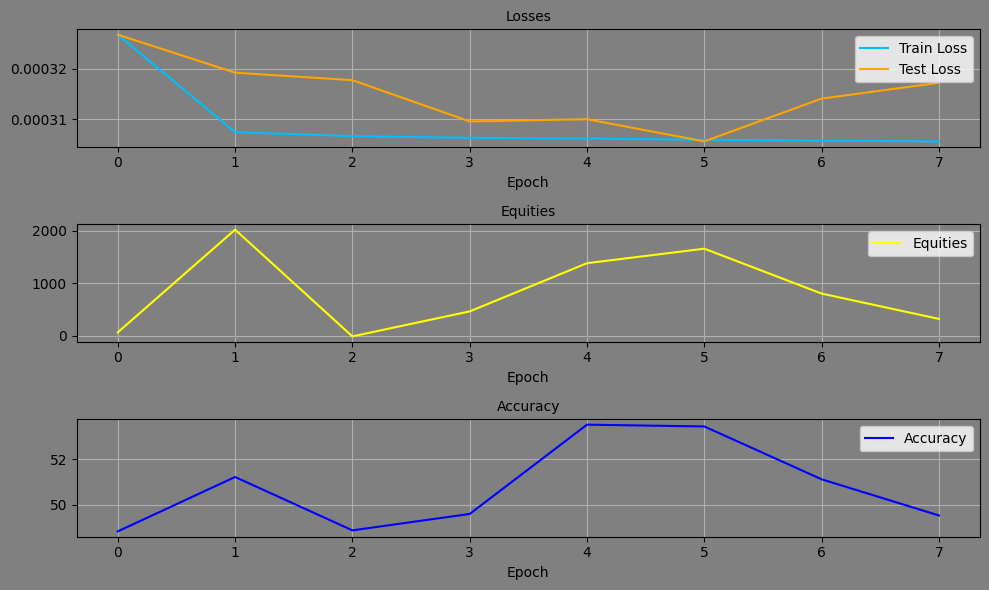

Epoch: 7, Equity: 393.79, Accuracy: 50.63 train_losses: 0.000780048332037487, test_losses: 0.00030414439970627427, Duration: 0:00:05.646187


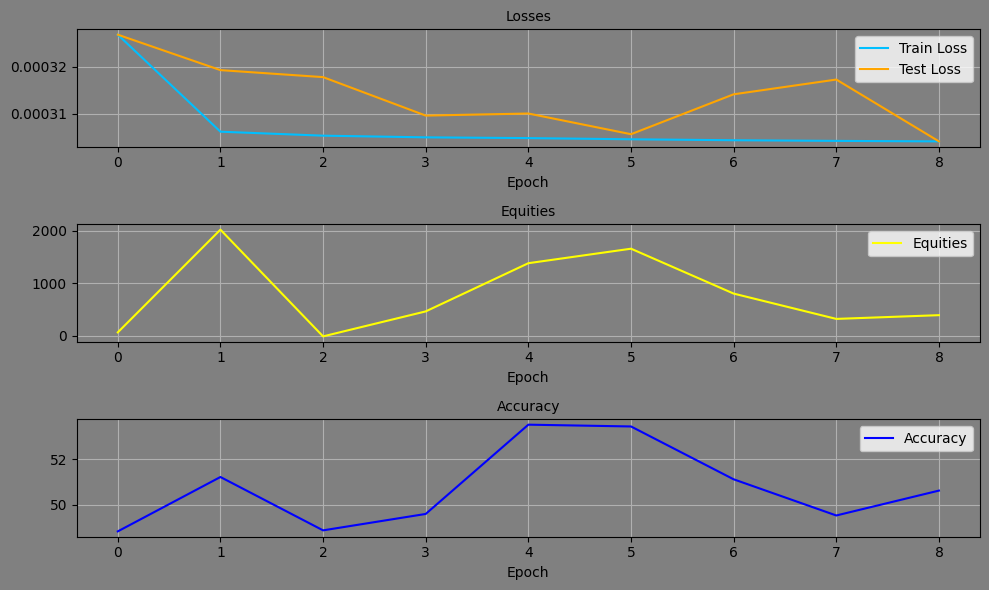

Epoch: 8, Equity: 1899.98, Accuracy: 53.27 train_losses: 0.000778934030970647, test_losses: 0.0003124712675344199, Duration: 0:00:04.622610


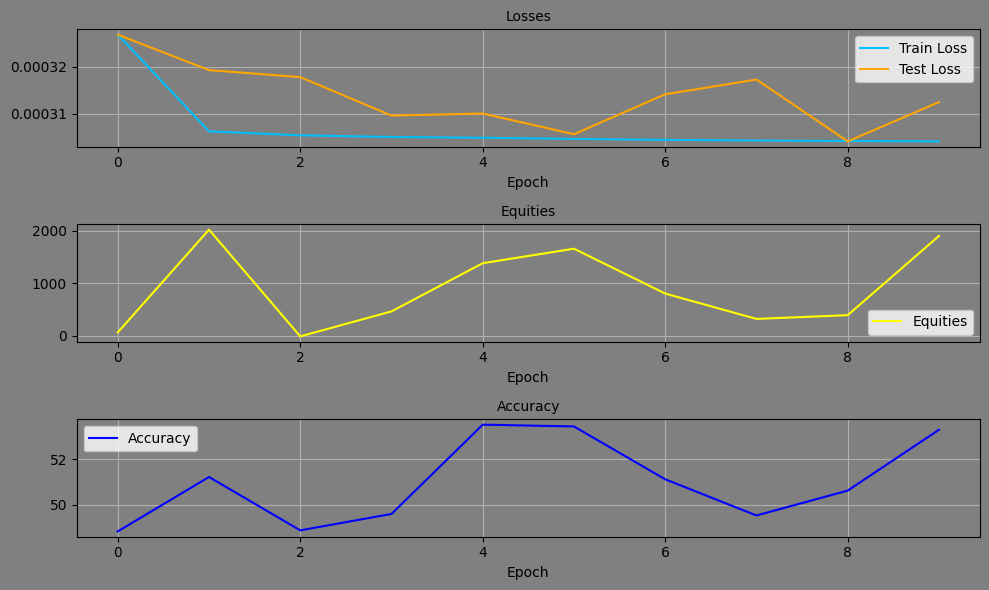

Epoch: 9, Equity: 1102.46, Accuracy: 52.26 train_losses: 0.0007775455548997716, test_losses: 0.0003037250426132232, Duration: 0:00:04.287597


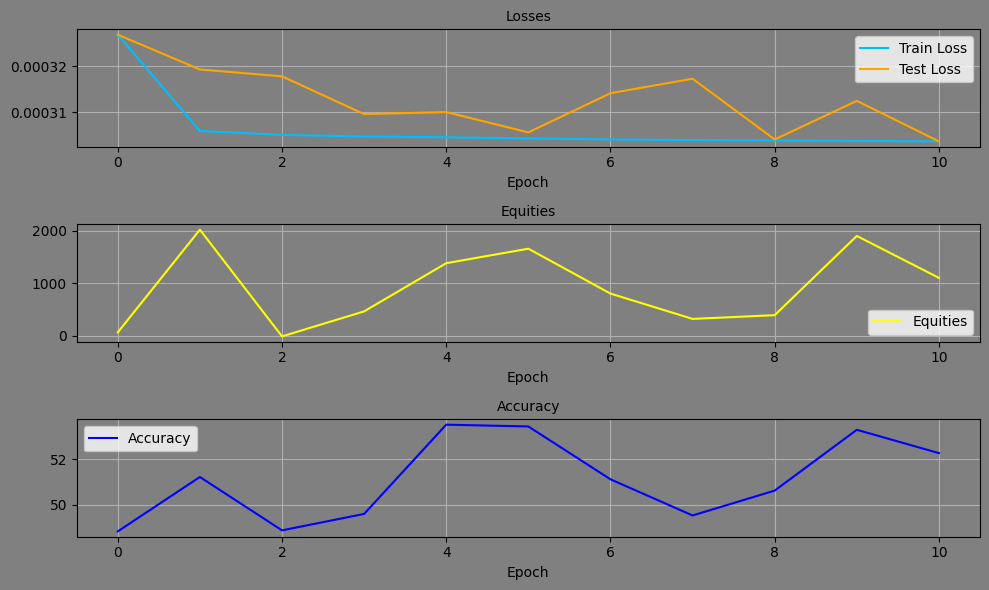

Epoch: 10, Equity: 2217.41, Accuracy: 51.24 train_losses: 0.000776533260751968, test_losses: 0.00030632346170023084, Duration: 0:00:04.254993


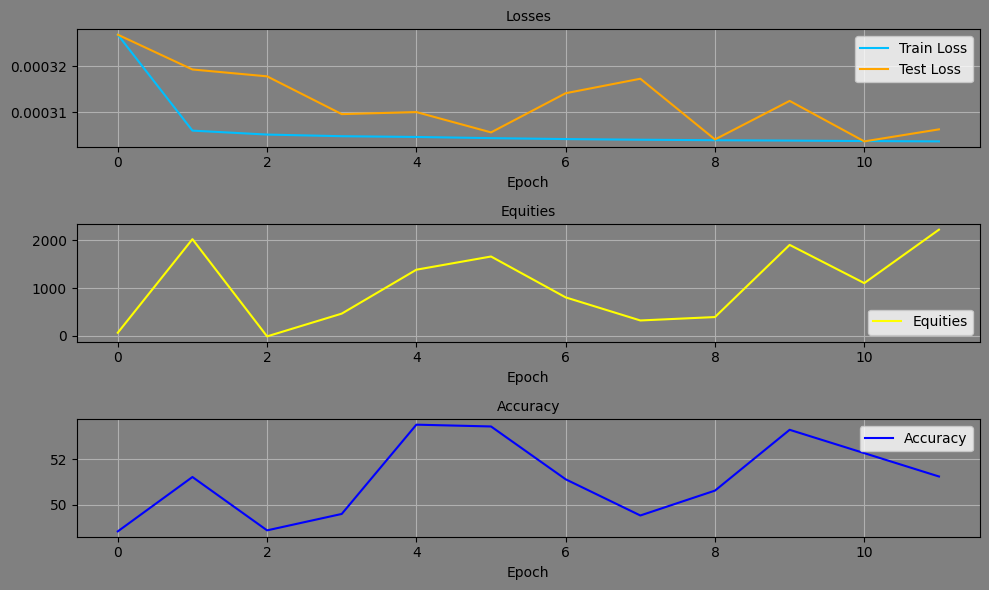

Epoch: 11, Equity: 562.28, Accuracy: 50.74 train_losses: 0.0007760635636213003, test_losses: 0.0003036994894500822, Duration: 0:00:04.137116


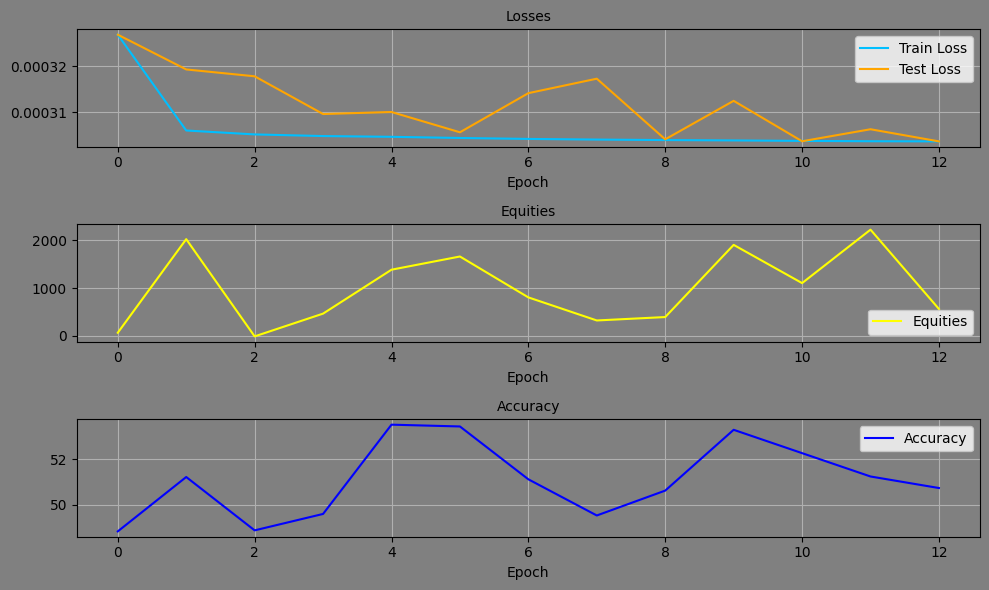

Epoch: 12, Equity: 672.86, Accuracy: 51.60 train_losses: 0.0007757037001262029, test_losses: 0.000303590961266309, Duration: 0:00:03.642303


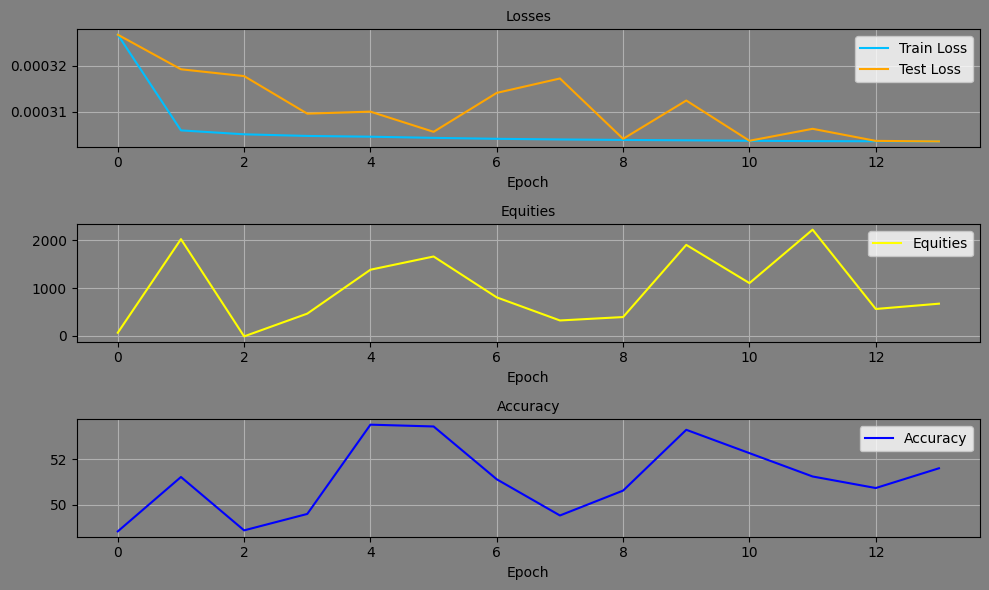

Epoch: 13, Equity: 1167.01, Accuracy: 51.97 train_losses: 0.0007749096338398542, test_losses: 0.00030626094667240977, Duration: 0:00:04.184793


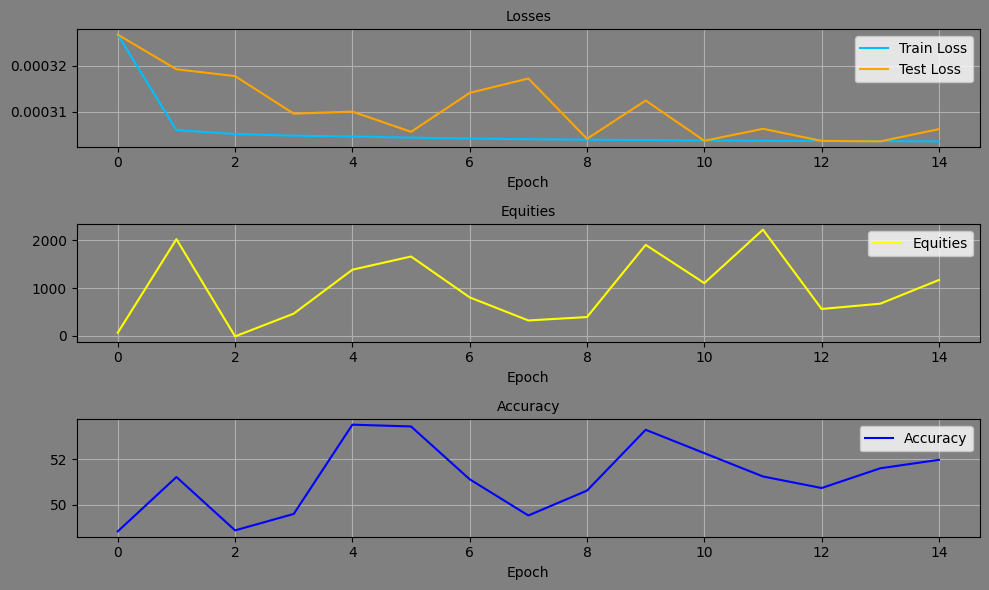

Epoch: 14, Equity: 653.85, Accuracy: 51.52 train_losses: 0.0007748909495949904, test_losses: 0.0003037388960365206, Duration: 0:00:03.932650


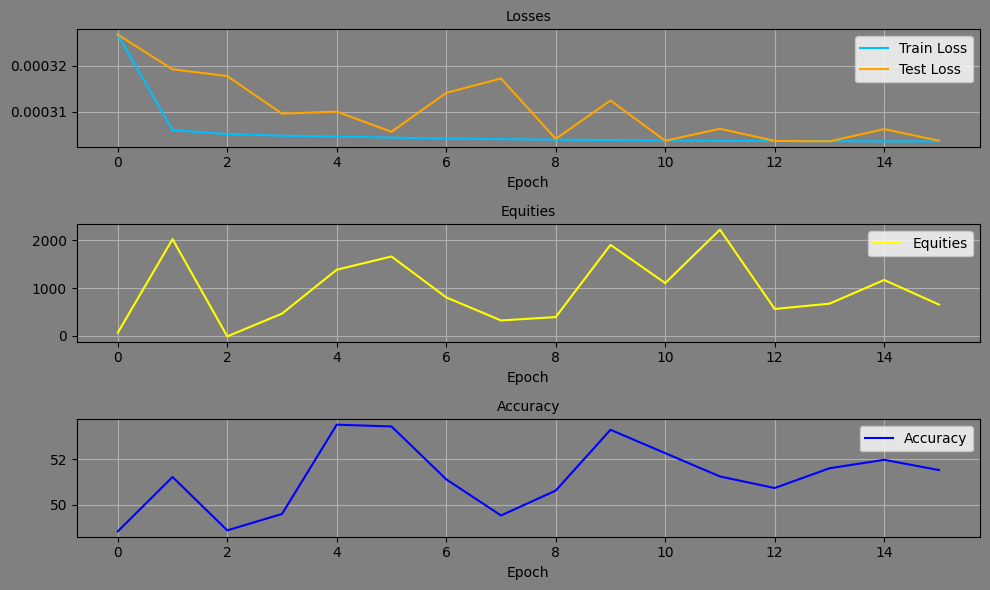

Epoch: 15, Equity: 1378.22, Accuracy: 52.08 train_losses: 0.0007737704917517768, test_losses: 0.00030363703262992203, Duration: 0:00:03.871314


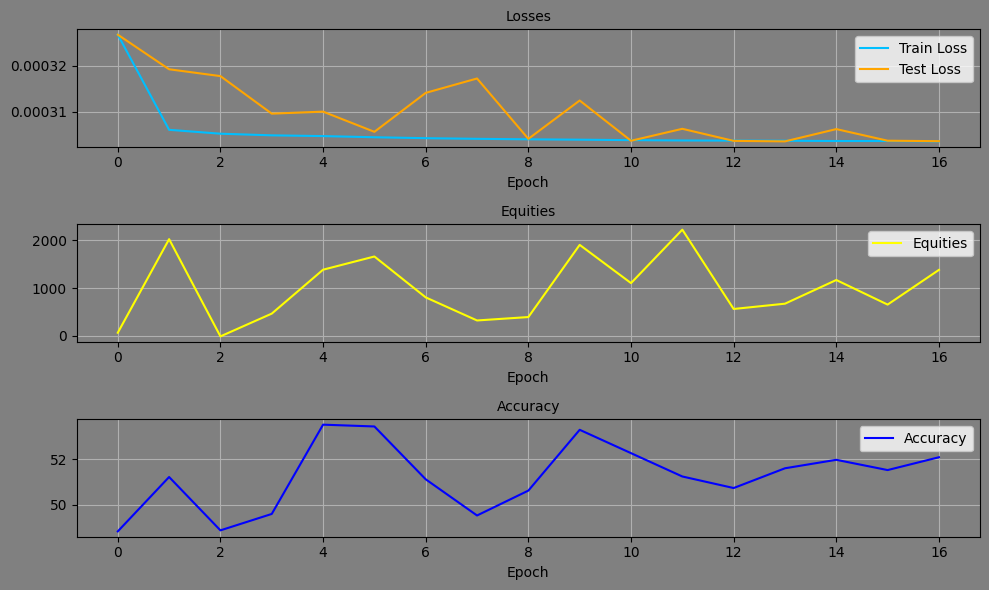

Epoch: 16, Equity: 1722.87, Accuracy: 52.42 train_losses: 0.0007734470031639033, test_losses: 0.000302850705338642, Duration: 0:00:04.080690


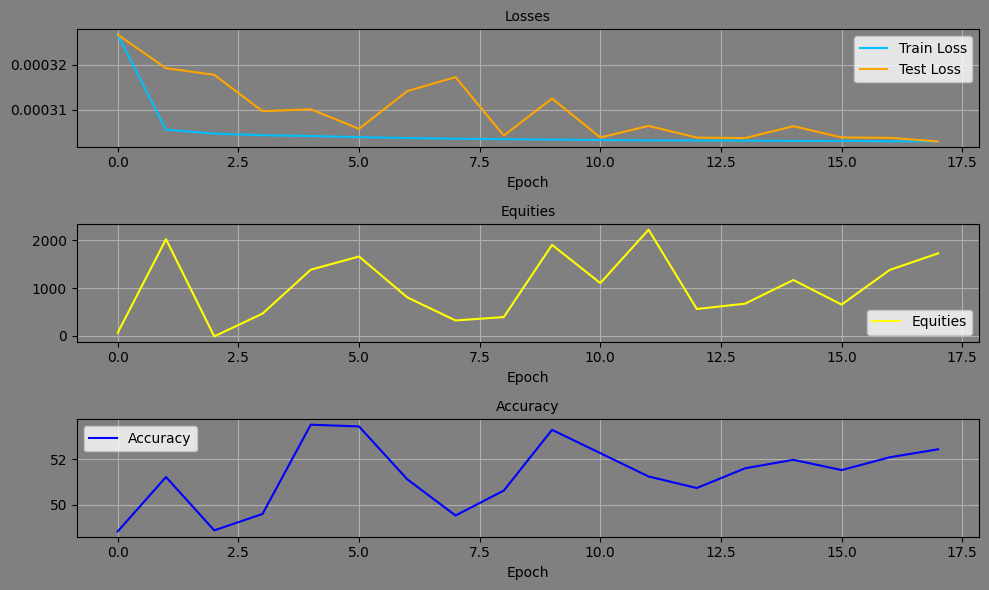

Epoch: 17, Equity: 1728.02, Accuracy: 52.31 train_losses: 0.0007731039203358645, test_losses: 0.00030332361347973347, Duration: 0:00:03.827690


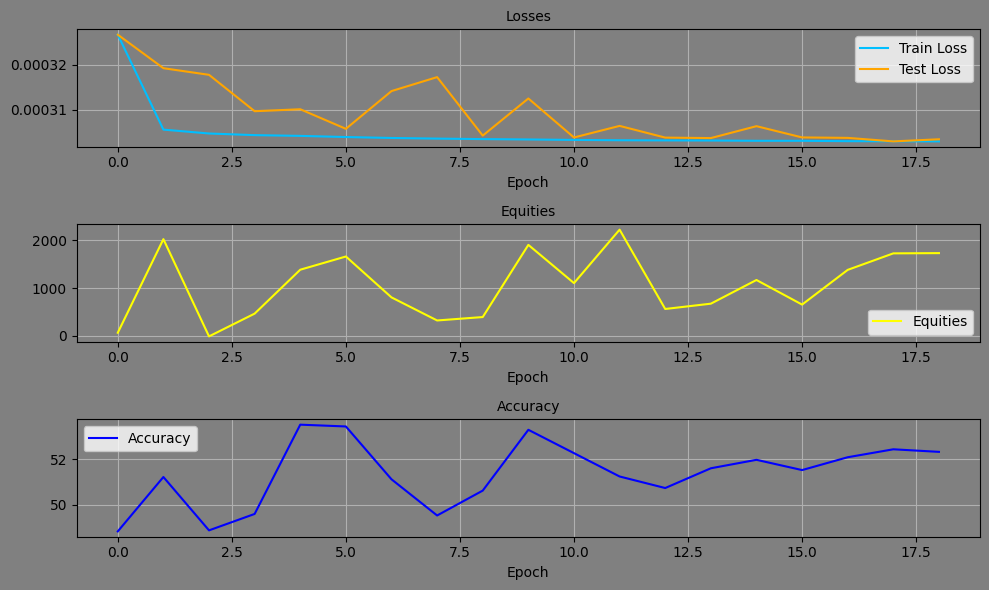

Epoch: 18, Equity: 1022.49, Accuracy: 50.88 train_losses: 0.0007726618134681647, test_losses: 0.0003055413835681975, Duration: 0:00:04.247106


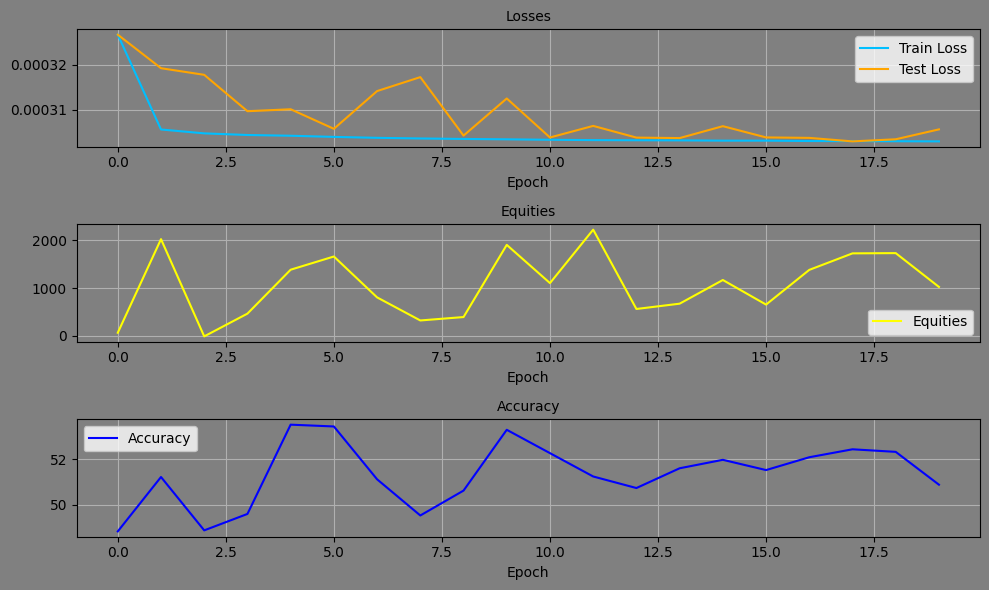

Epoch: 19, Equity: 2418.69, Accuracy: 51.53 train_losses: 0.0007724173873906551, test_losses: 0.00030430141487158835, Duration: 0:00:05.366669


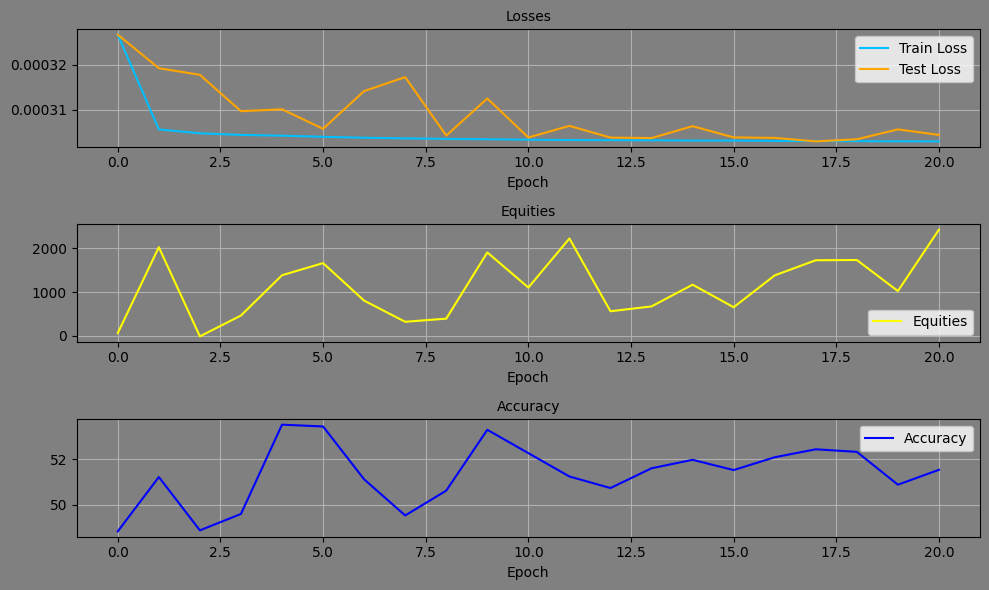

Epoch: 20, Equity: 1968.99, Accuracy: 52.51 train_losses: 0.0007718710215957802, test_losses: 0.0003029126673936844, Duration: 0:00:05.711052


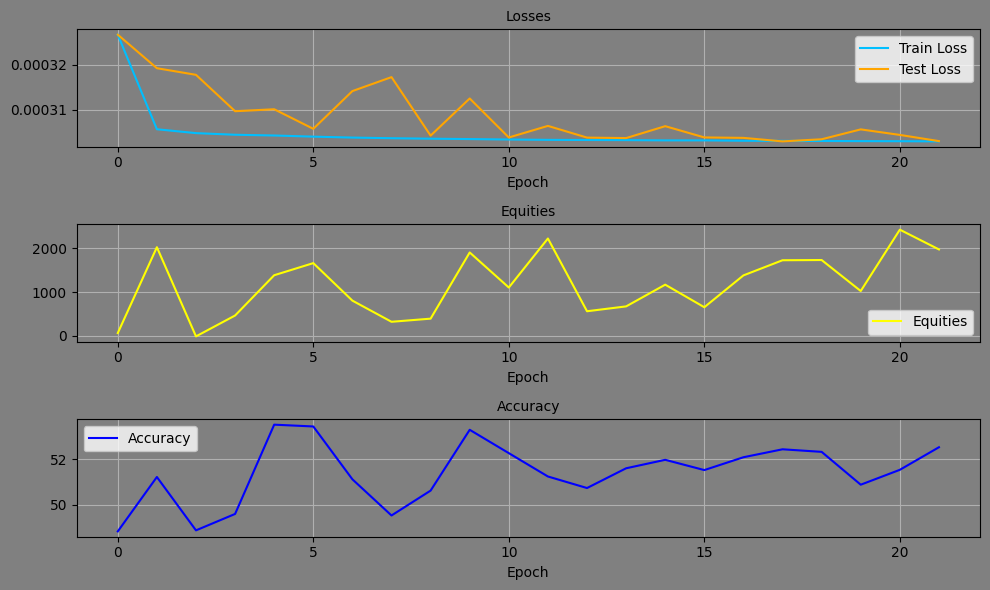

Epoch: 21, Equity: 1696.38, Accuracy: 52.97 train_losses: 0.0007714249324186789, test_losses: 0.0003035690460819751, Duration: 0:00:05.046185


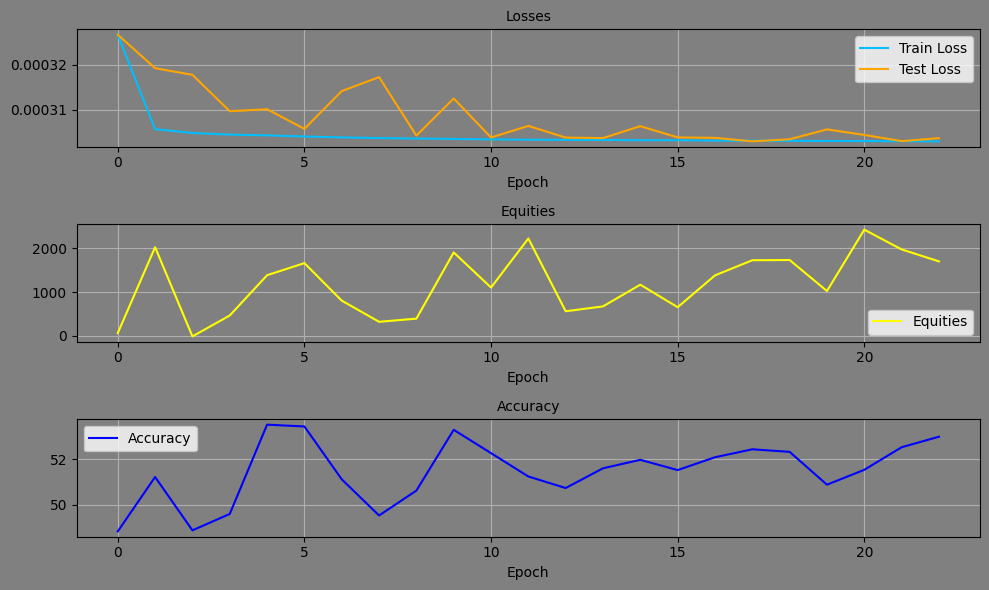

Epoch: 22, Equity: 760.07, Accuracy: 50.67 train_losses: 0.0007707123723416755, test_losses: 0.0003095473221037537, Duration: 0:00:04.610801


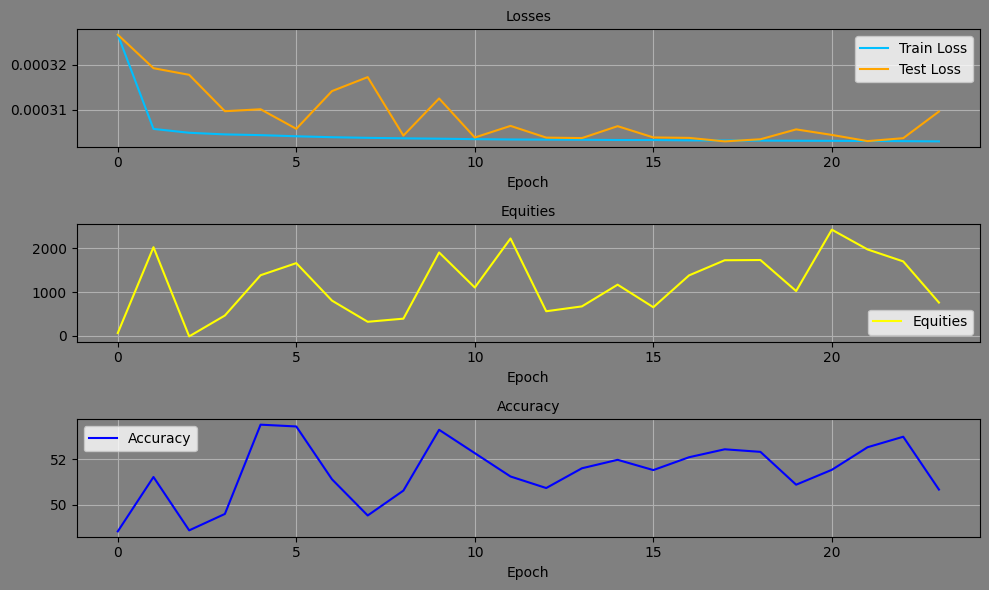

Epoch: 23, Equity: 1372.05, Accuracy: 52.26 train_losses: 0.0007706252612757498, test_losses: 0.0003035418631043285, Duration: 0:00:04.630904


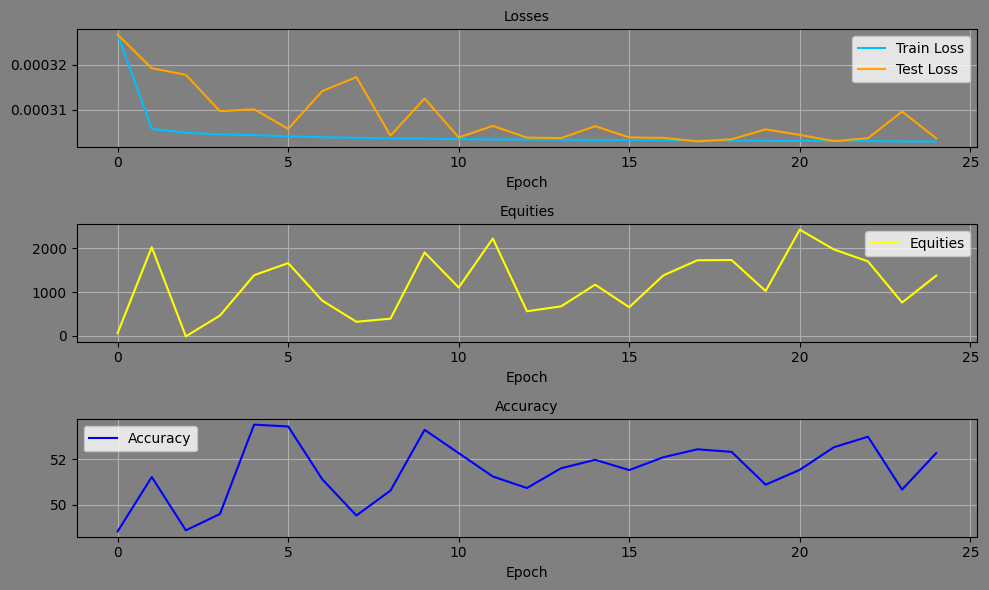

Epoch: 24, Equity: 628.85, Accuracy: 50.10 train_losses: 0.0007703817999876305, test_losses: 0.00030450691701844335, Duration: 0:00:04.293359


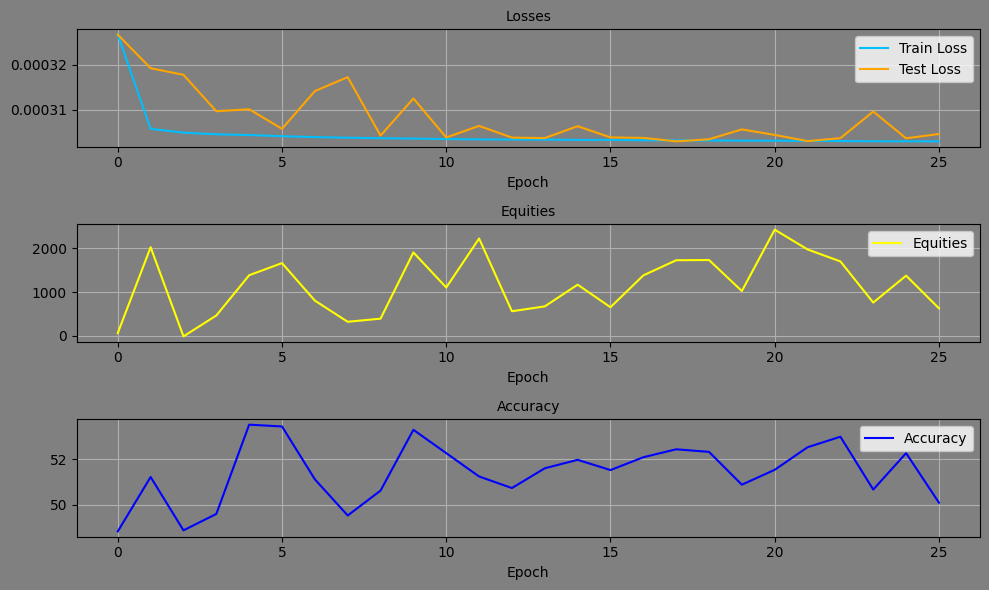

Epoch: 25, Equity: 709.56, Accuracy: 50.41 train_losses: 0.0007701817345088055, test_losses: 0.0003033095272257924, Duration: 0:00:04.129749


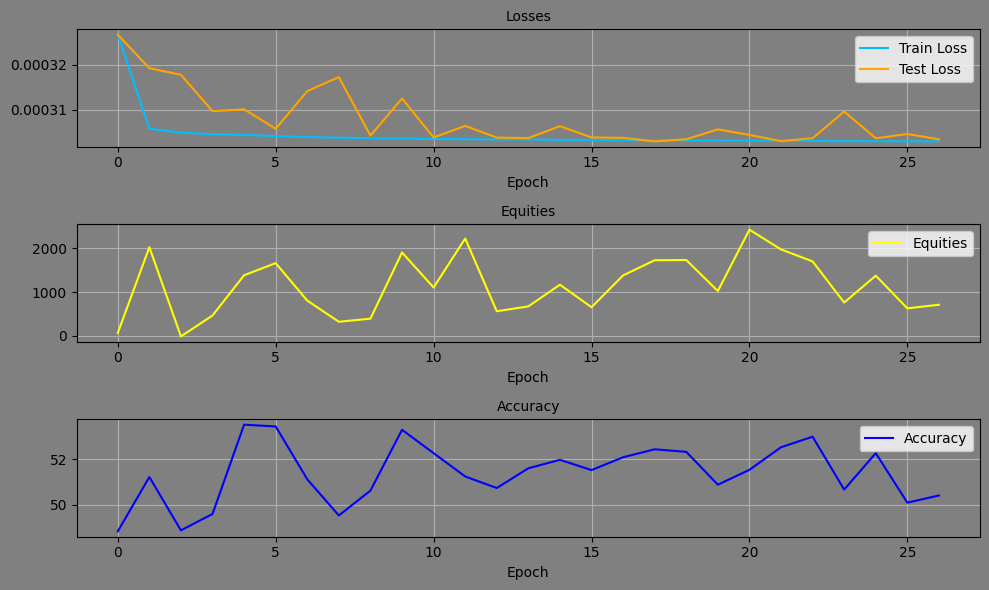

Epoch: 26, Equity: 2055.06, Accuracy: 51.39 train_losses: 0.0007696364703698665, test_losses: 0.00030989284277893603, Duration: 0:00:04.151688


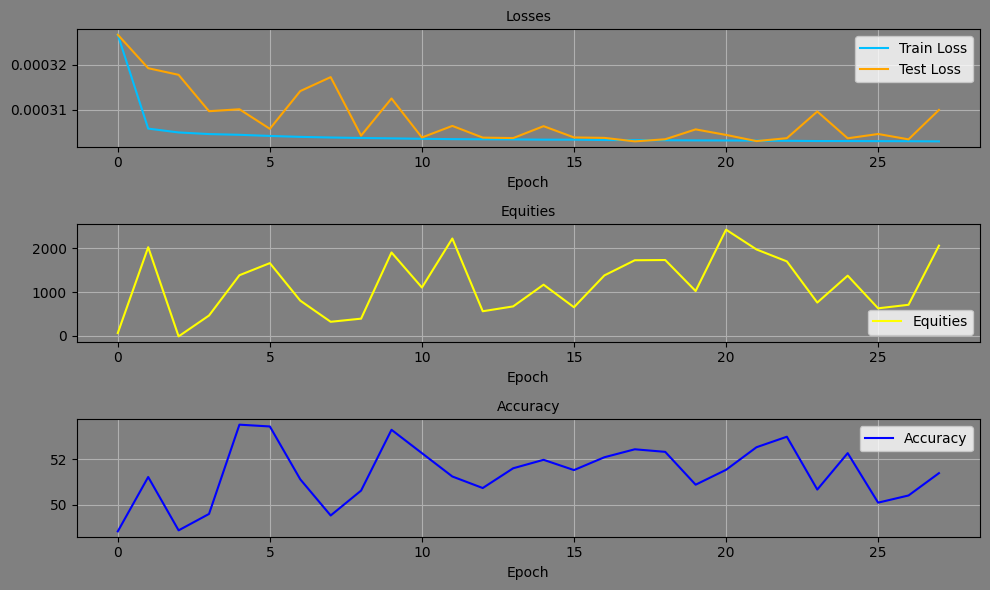

Epoch: 27, Equity: 1597.78, Accuracy: 52.38 train_losses: 0.0007694033686687406, test_losses: 0.00030325603438541293, Duration: 0:00:04.343867


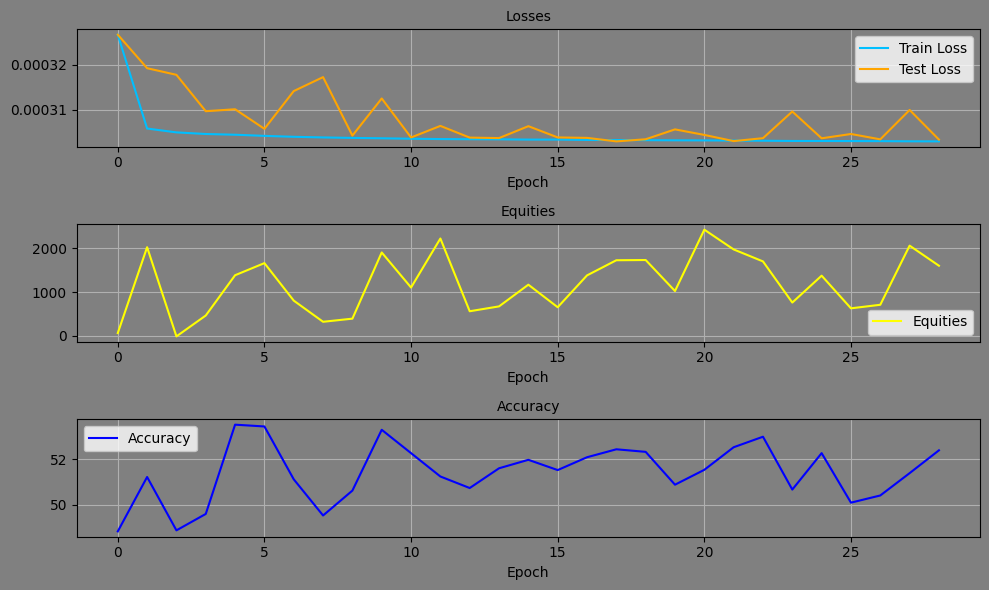

Epoch: 28, Equity: 1692.51, Accuracy: 52.18 train_losses: 0.0007690910880893998, test_losses: 0.0003037822316400707, Duration: 0:00:04.344697


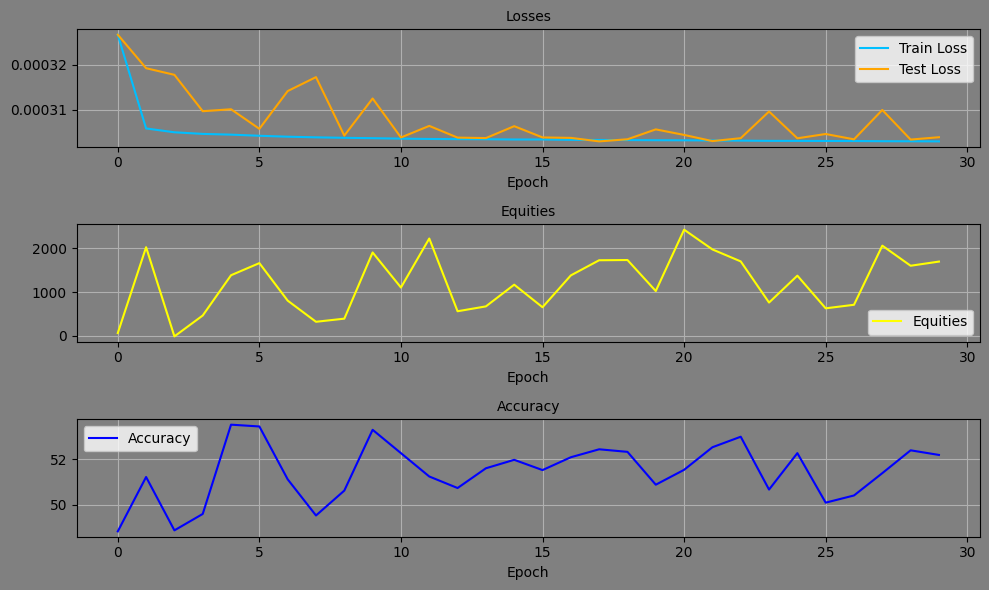

Epoch: 29, Equity: 1868.39, Accuracy: 52.88 train_losses: 0.0007690633272211932, test_losses: 0.0003026767517440021, Duration: 0:00:04.305718


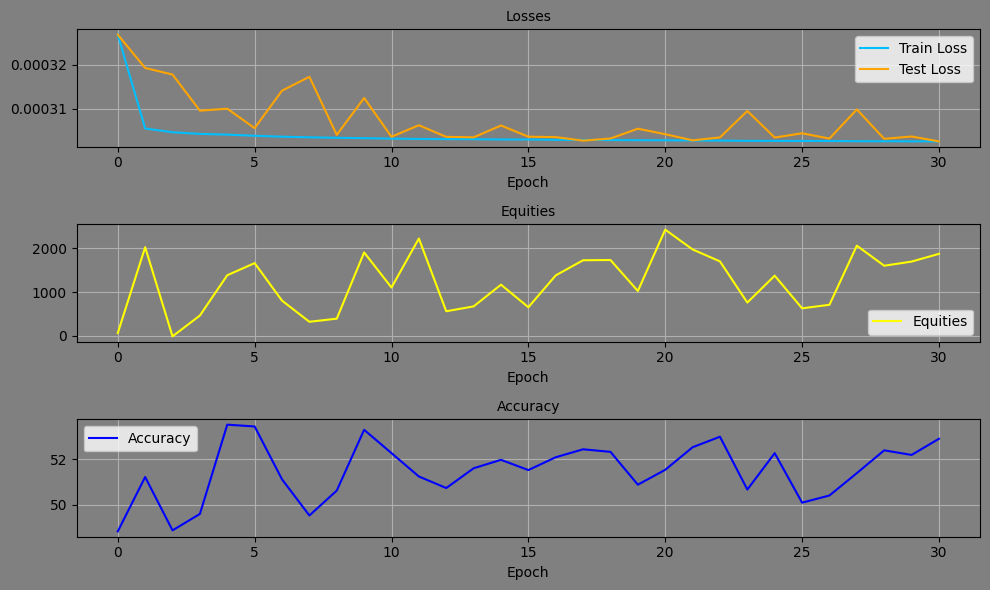

Epoch: 30, Equity: 1875.94, Accuracy: 52.09 train_losses: 0.0007688630896871166, test_losses: 0.00030265390523709357, Duration: 0:00:04.303937


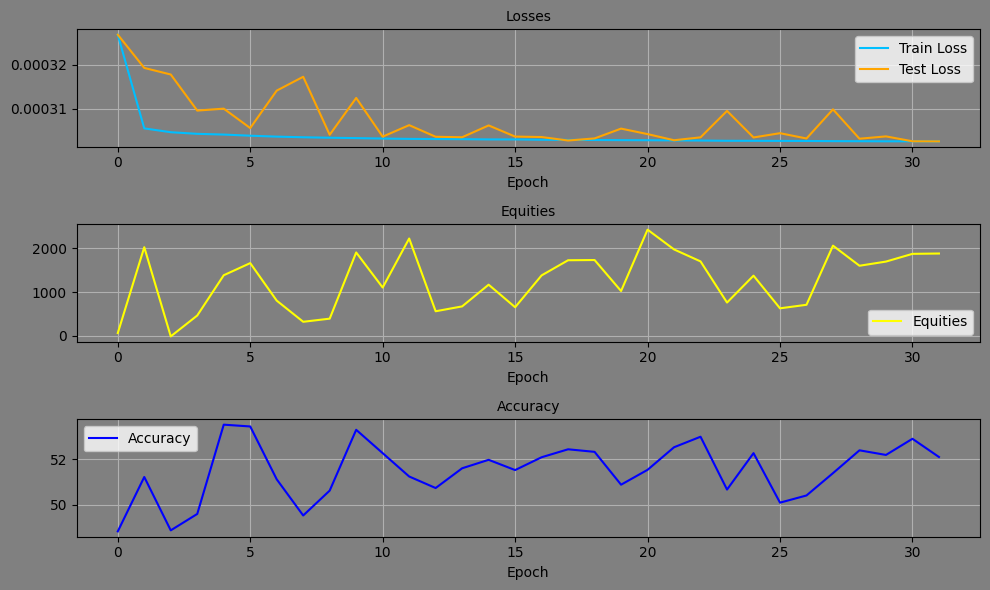

Epoch: 31, Equity: 1570.61, Accuracy: 51.72 train_losses: 0.0007686426108618778, test_losses: 0.0003028928767889738, Duration: 0:00:04.353920


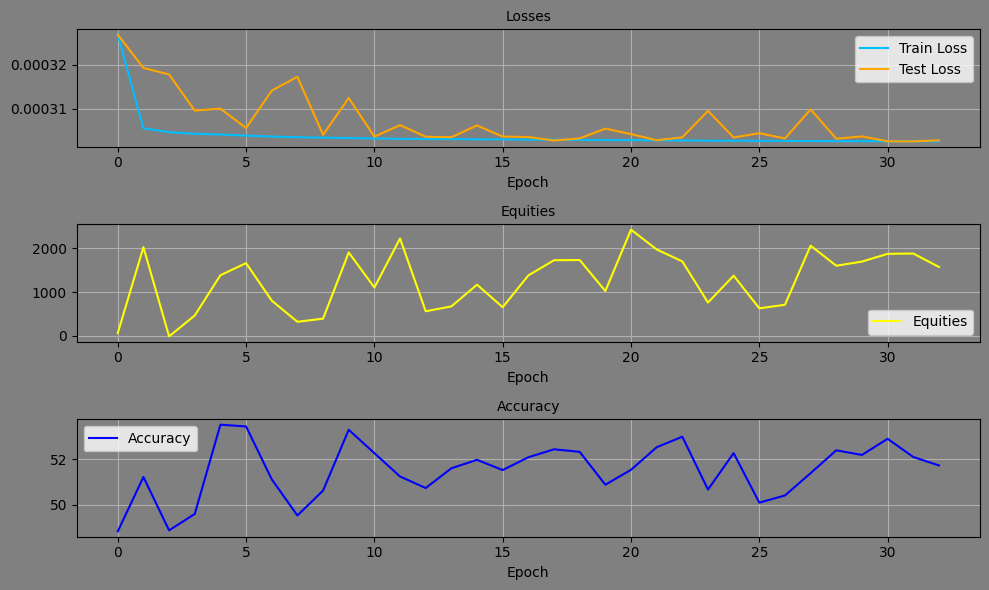

Epoch: 32, Equity: 728.60, Accuracy: 49.70 train_losses: 0.000767958367379158, test_losses: 0.00030351310851983726, Duration: 0:00:04.421705


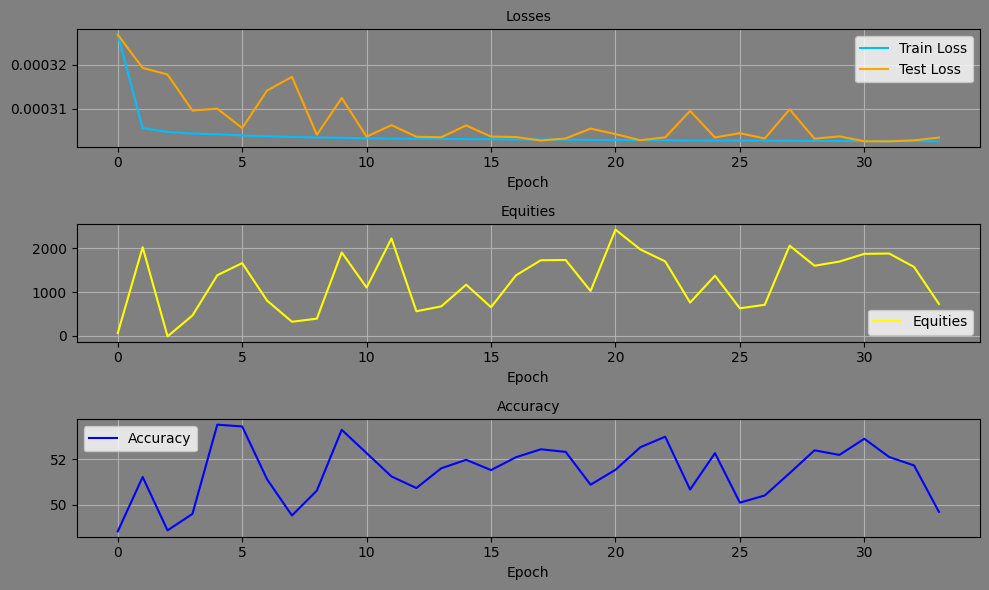

Epoch: 33, Equity: 2257.25, Accuracy: 51.46 train_losses: 0.0007685172989427152, test_losses: 0.00030240582418628037, Duration: 0:00:04.376101


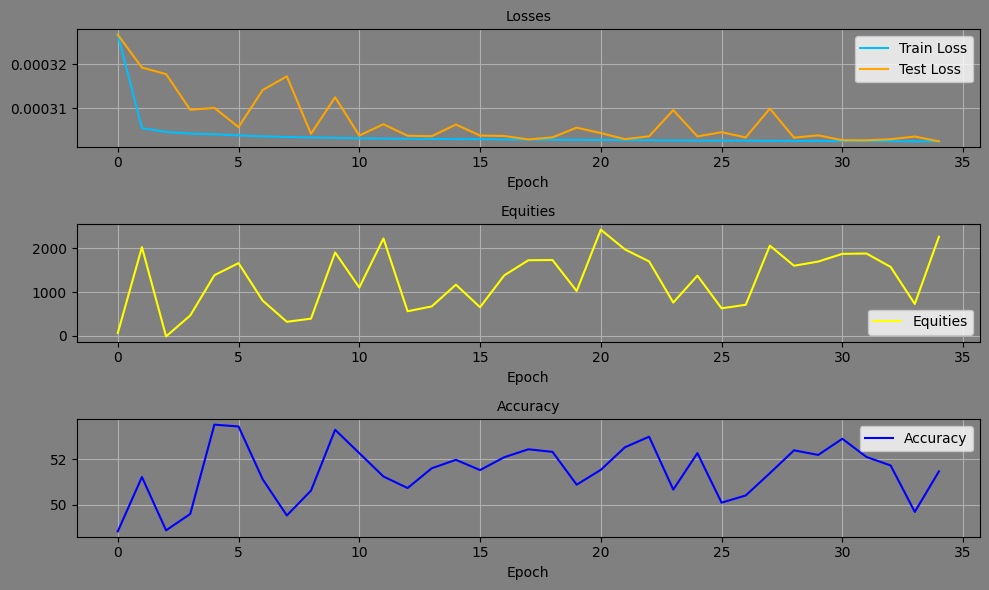

Epoch: 34, Equity: 1994.28, Accuracy: 51.53 train_losses: 0.000767742232796899, test_losses: 0.00030457822140306234, Duration: 0:00:04.378258


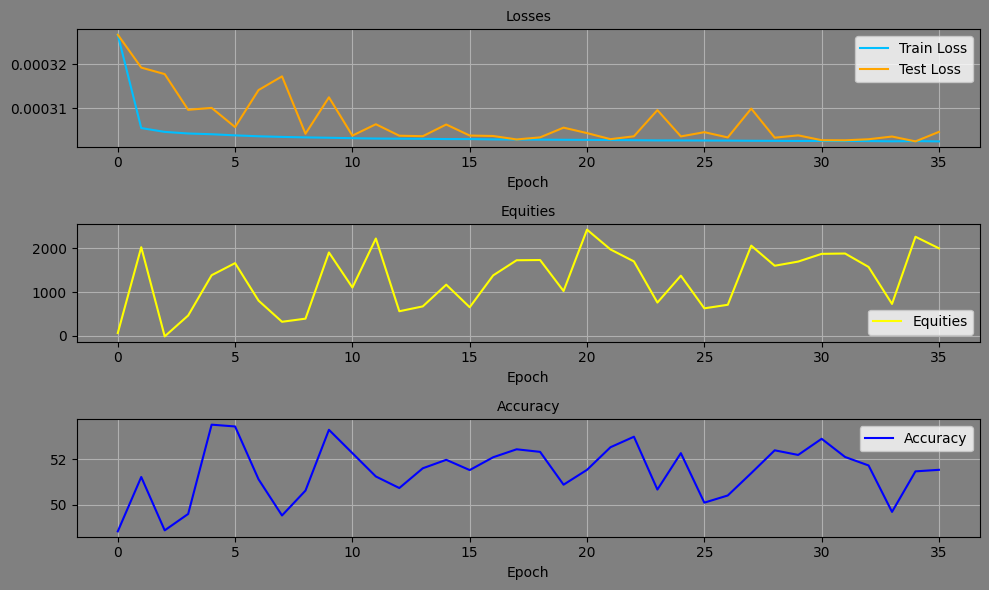

Epoch: 35, Equity: 1413.34, Accuracy: 52.29 train_losses: 0.00076747051444702, test_losses: 0.0003041930904146284, Duration: 0:00:04.317044


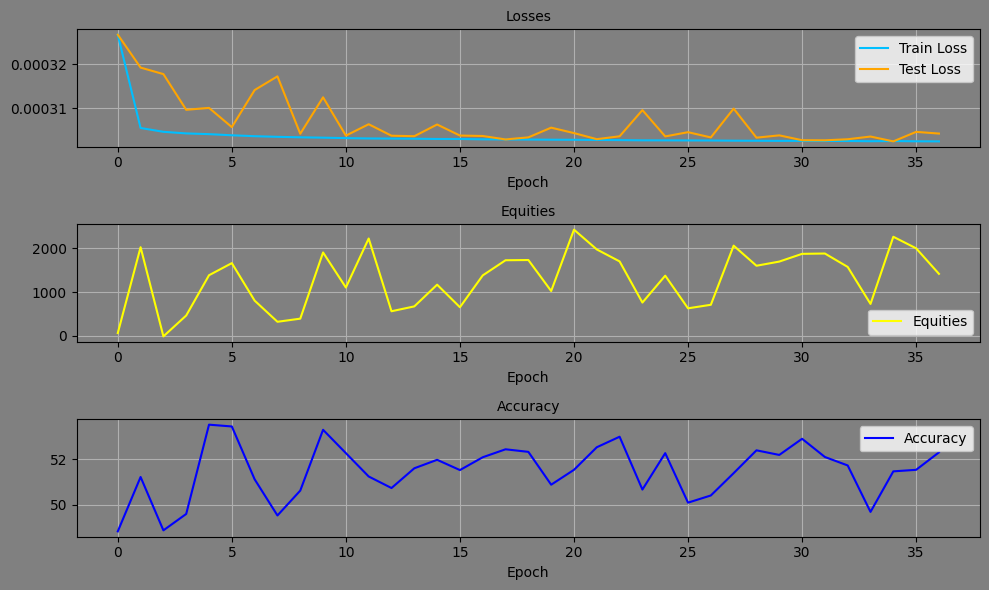

Epoch: 36, Equity: 540.02, Accuracy: 49.41 train_losses: 0.0007670515292046, test_losses: 0.0003072612453252077, Duration: 0:00:04.359600


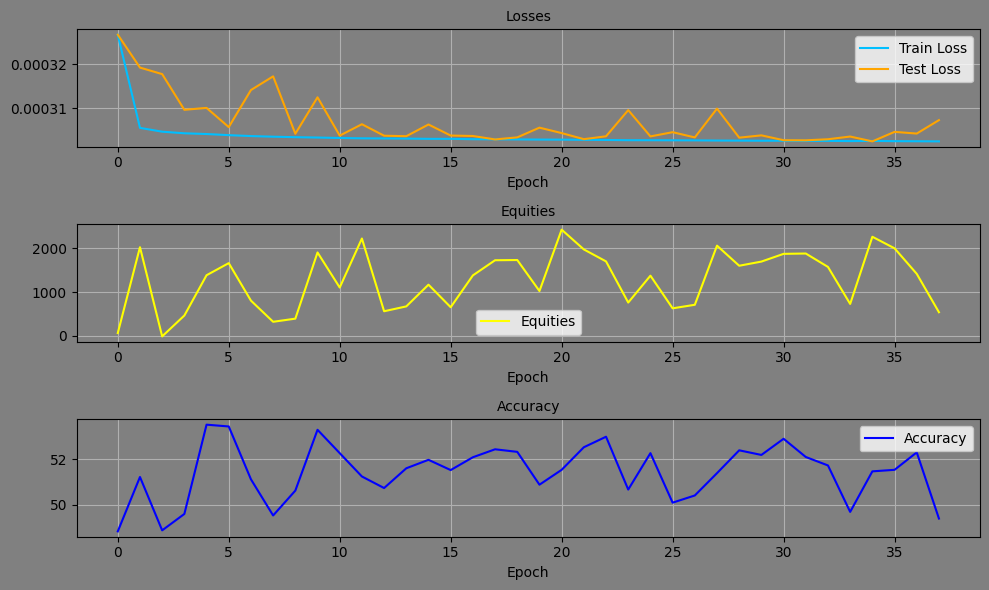

Epoch: 37, Equity: 2054.51, Accuracy: 51.27 train_losses: 0.0007672449512680477, test_losses: 0.00030492409132421017, Duration: 0:00:04.390974


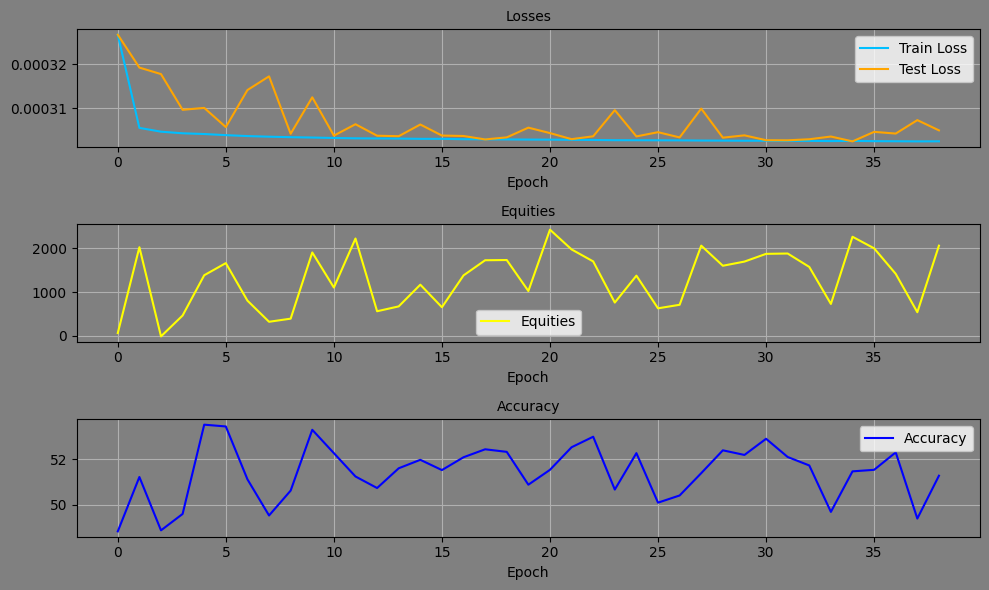

Epoch: 38, Equity: 67.80, Accuracy: 48.96 train_losses: 0.0007670216896781609, test_losses: 0.00030562604661099613, Duration: 0:00:04.271021


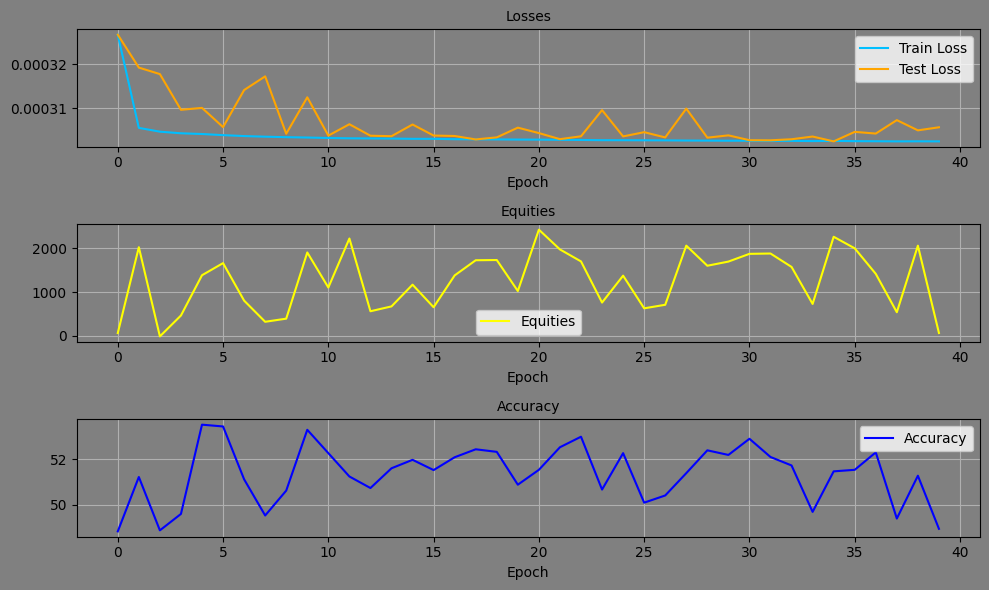

Epoch: 39, Equity: 2340.28, Accuracy: 51.51 train_losses: 0.0007667437980234875, test_losses: 0.00030396628426387906, Duration: 0:00:04.186221


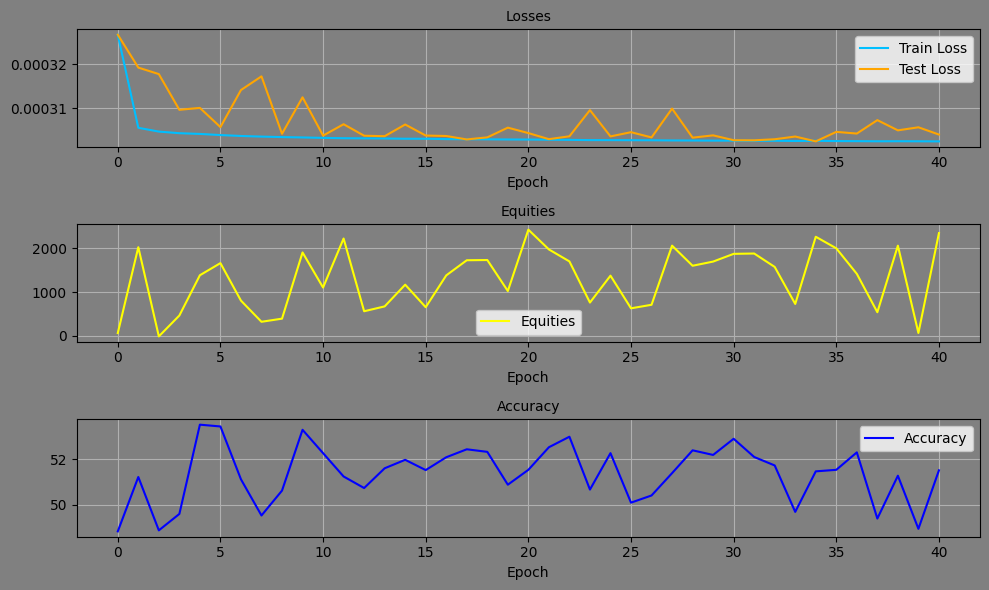

Epoch: 40, Equity: 2481.75, Accuracy: 51.60 train_losses: 0.0007666763226655069, test_losses: 0.00030332899768836796, Duration: 0:00:04.214696


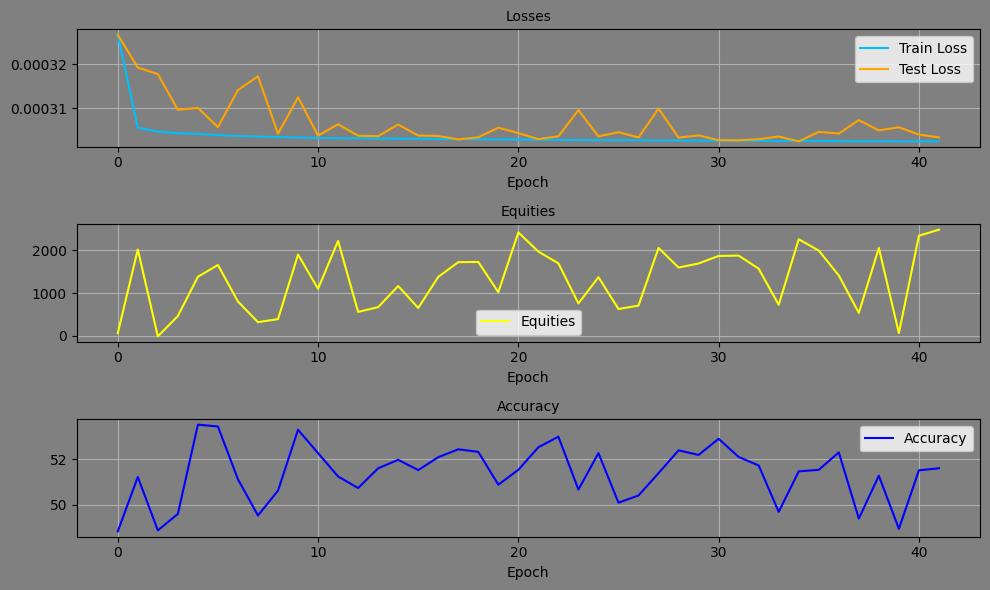

Epoch: 41, Equity: 627.16, Accuracy: 49.35 train_losses: 0.0007658830418891256, test_losses: 0.00030573224648833275, Duration: 0:00:04.332811


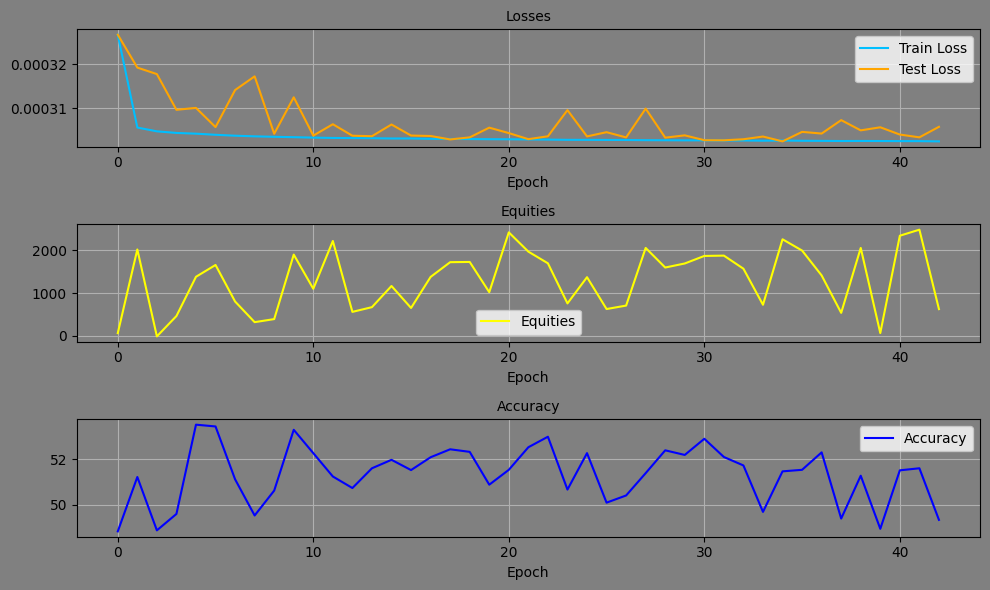

Epoch: 42, Equity: 2217.68, Accuracy: 51.59 train_losses: 0.0007655870327547517, test_losses: 0.00030342768877744675, Duration: 0:00:04.173658


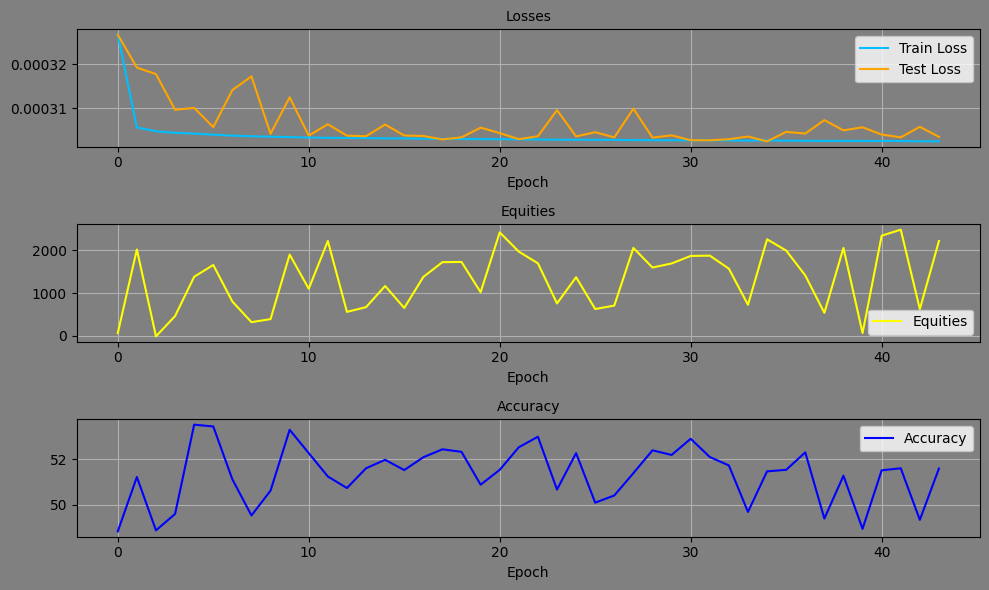

Epoch: 43, Equity: 2099.48, Accuracy: 51.42 train_losses: 0.000765834829046334, test_losses: 0.00030256438185460865, Duration: 0:00:04.440751


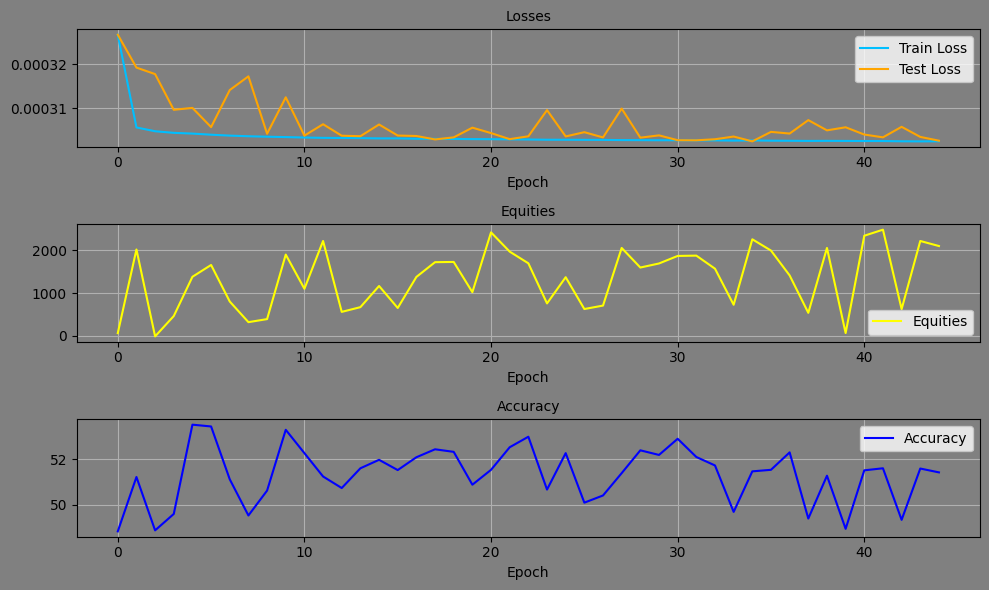

Epoch: 44, Equity: 1626.35, Accuracy: 50.59 train_losses: 0.0007658121804144009, test_losses: 0.0003021614102181047, Duration: 0:00:04.416693


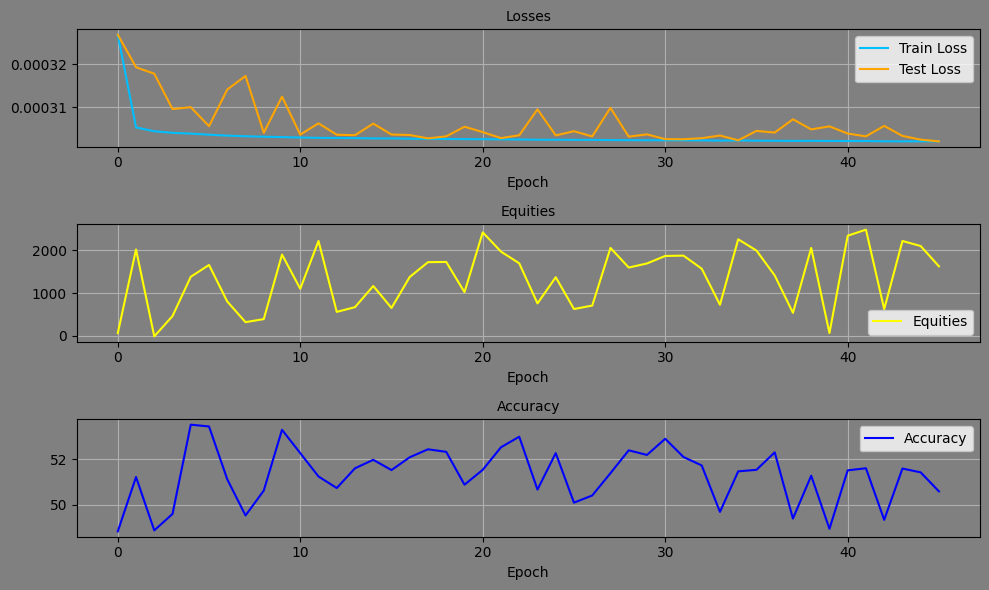

Epoch: 45, Equity: 2366.55, Accuracy: 51.59 train_losses: 0.0007646277981610308, test_losses: 0.00030393648194149137, Duration: 0:00:04.479087


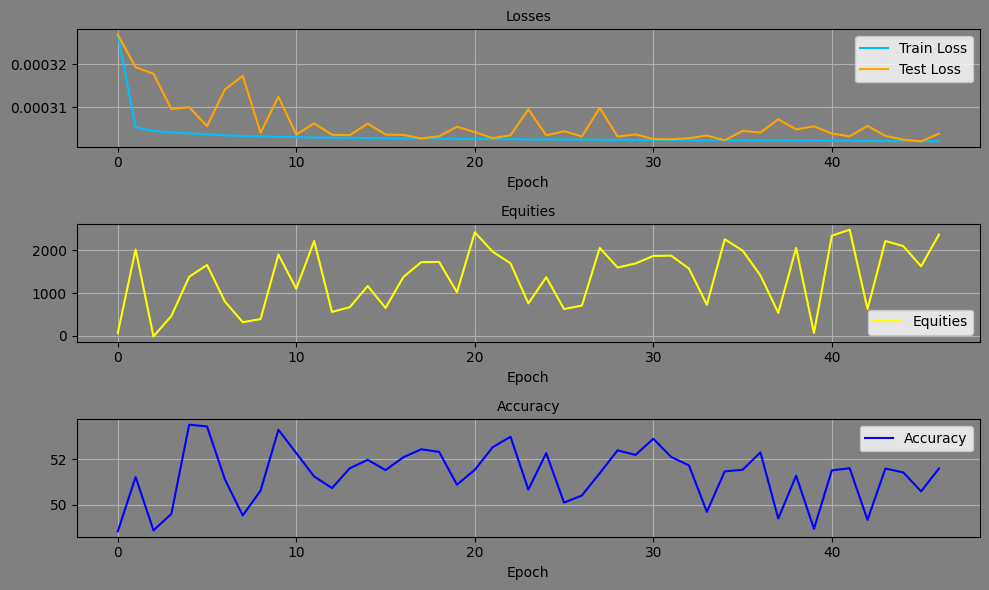

Epoch: 46, Equity: 467.37, Accuracy: 49.33 train_losses: 0.0007656985038734972, test_losses: 0.0003025280311703682, Duration: 0:00:04.245465


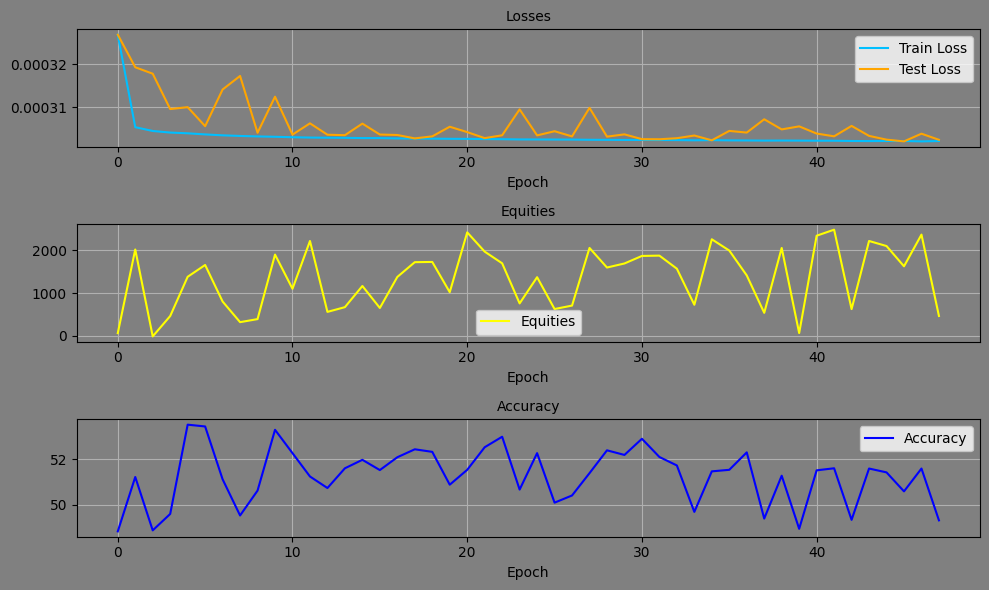

Epoch: 47, Equity: 1679.74, Accuracy: 51.18 train_losses: 0.0007648899858177519, test_losses: 0.0003032726526726037, Duration: 0:00:04.266884


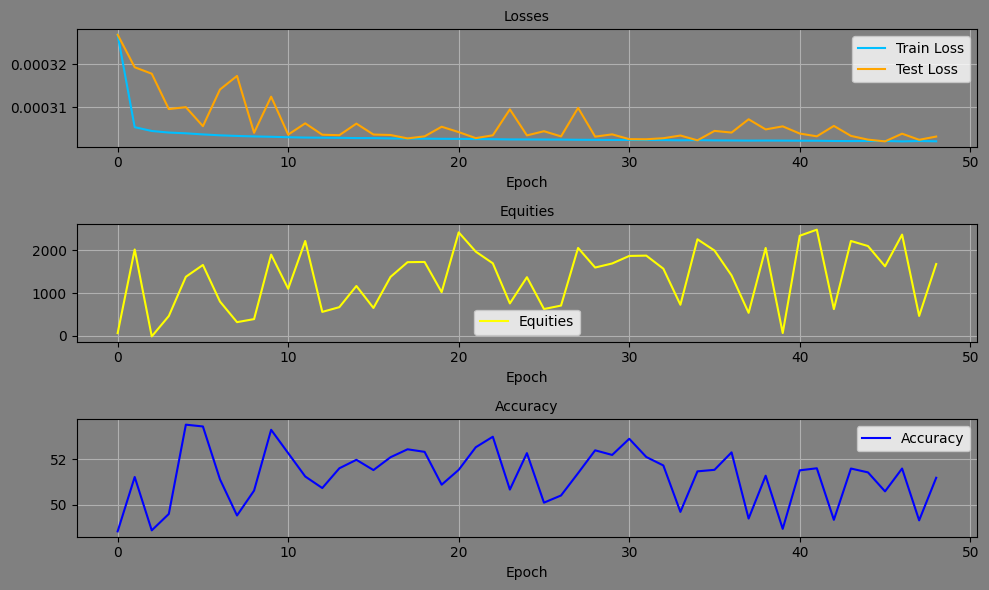

Epoch: 48, Equity: 1448.50, Accuracy: 50.31 train_losses: 0.000764784797402096, test_losses: 0.0003022253804374486, Duration: 0:00:04.356519


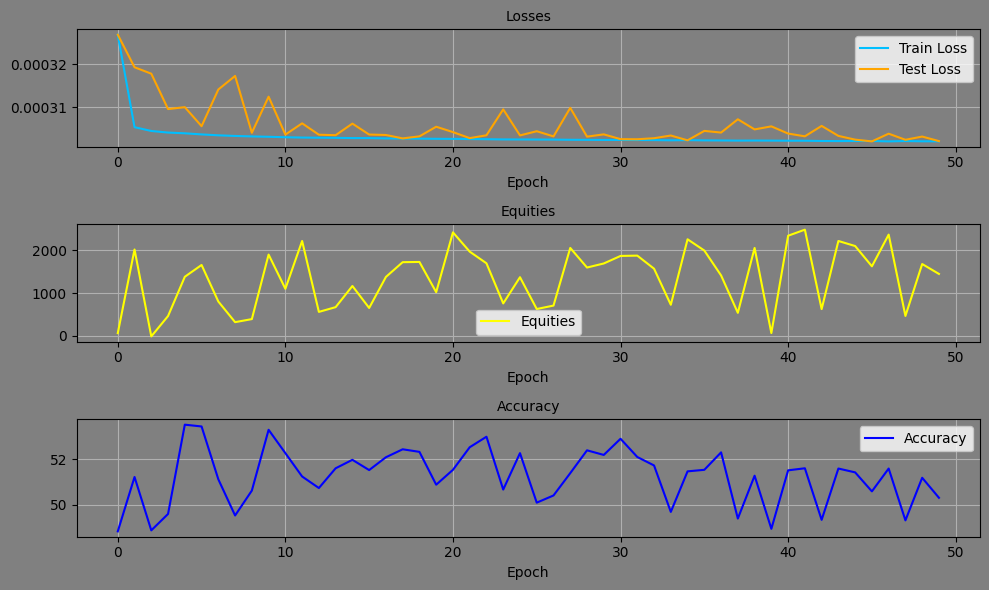

Epoch: 49, Equity: 1885.98, Accuracy: 51.42 train_losses: 0.0007647793237242128, test_losses: 0.000306017289403826, Duration: 0:00:04.661796


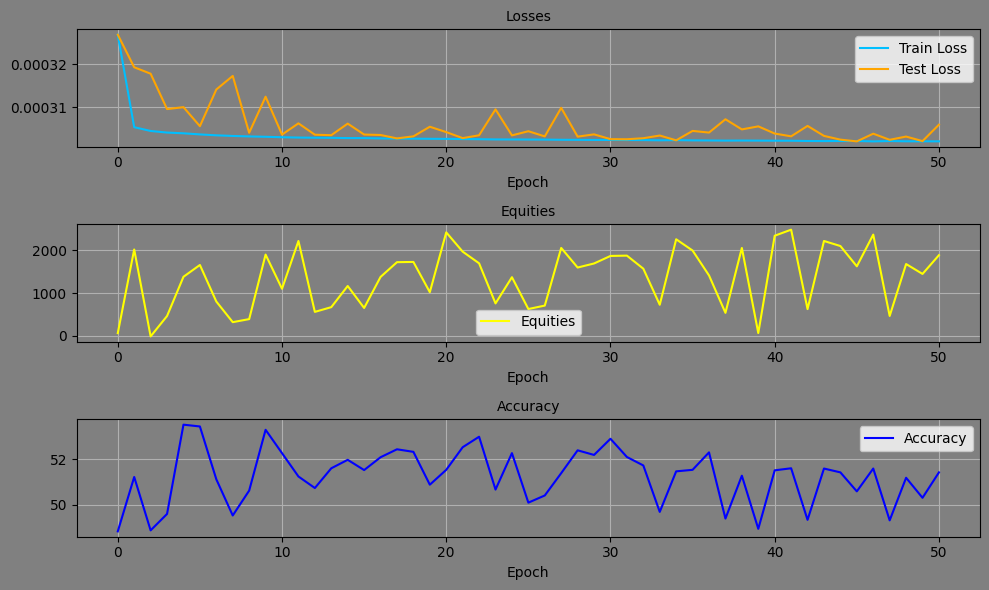

Epoch: 50, Equity: 2428.87, Accuracy: 51.17 train_losses: 0.0007649273622048712, test_losses: 0.0003063166223000735, Duration: 0:00:04.222993


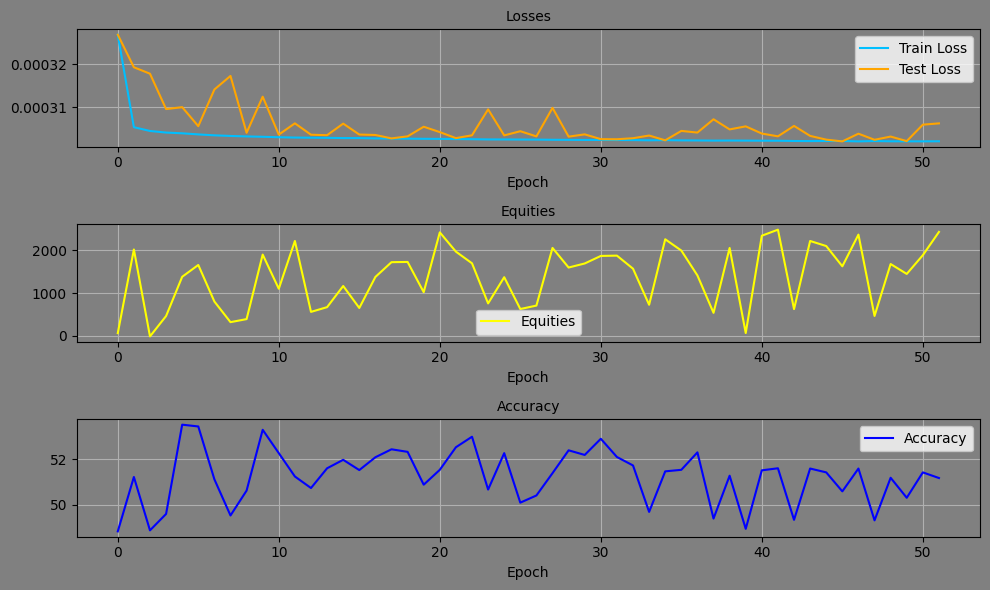

Epoch: 51, Equity: 668.63, Accuracy: 49.43 train_losses: 0.0007642320035791774, test_losses: 0.00030311968293972313, Duration: 0:00:04.437666


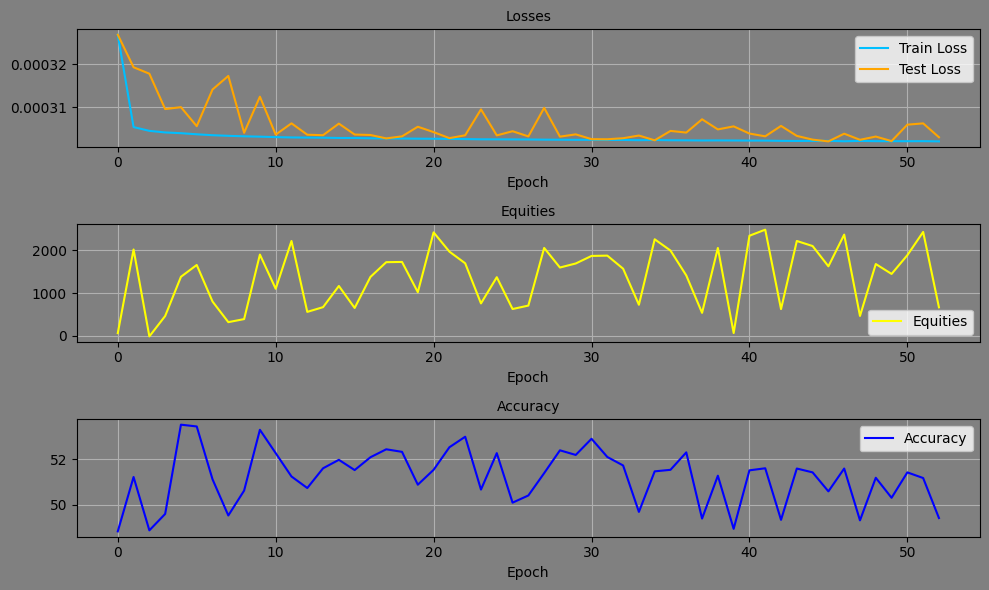

Epoch: 52, Equity: 2415.05, Accuracy: 51.05 train_losses: 0.0007639405669569282, test_losses: 0.00030179350869730115, Duration: 0:00:04.349674


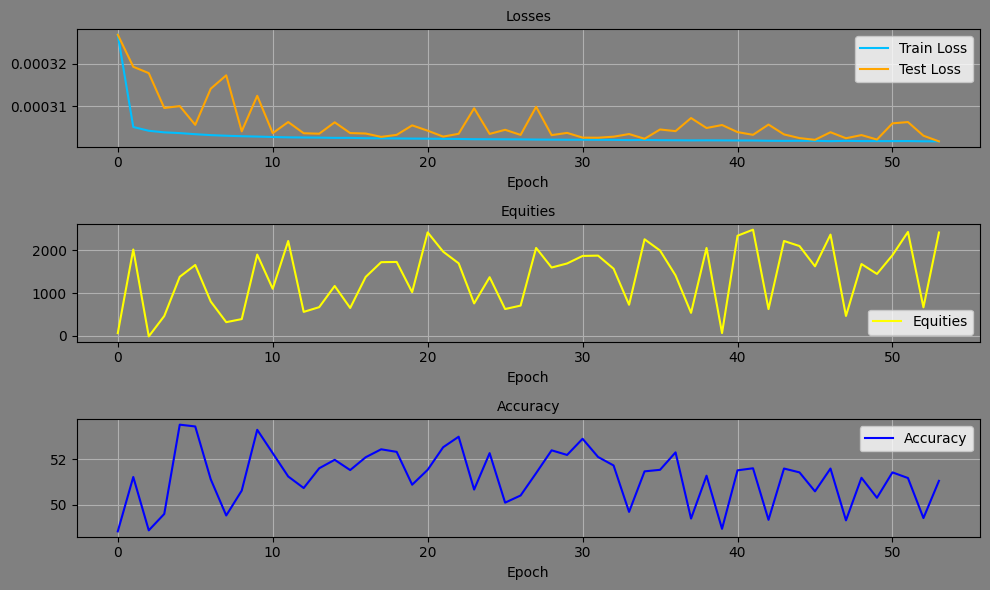

Epoch: 53, Equity: 2295.88, Accuracy: 50.46 train_losses: 0.0007635302880623827, test_losses: 0.00030252282158471644, Duration: 0:00:04.525995


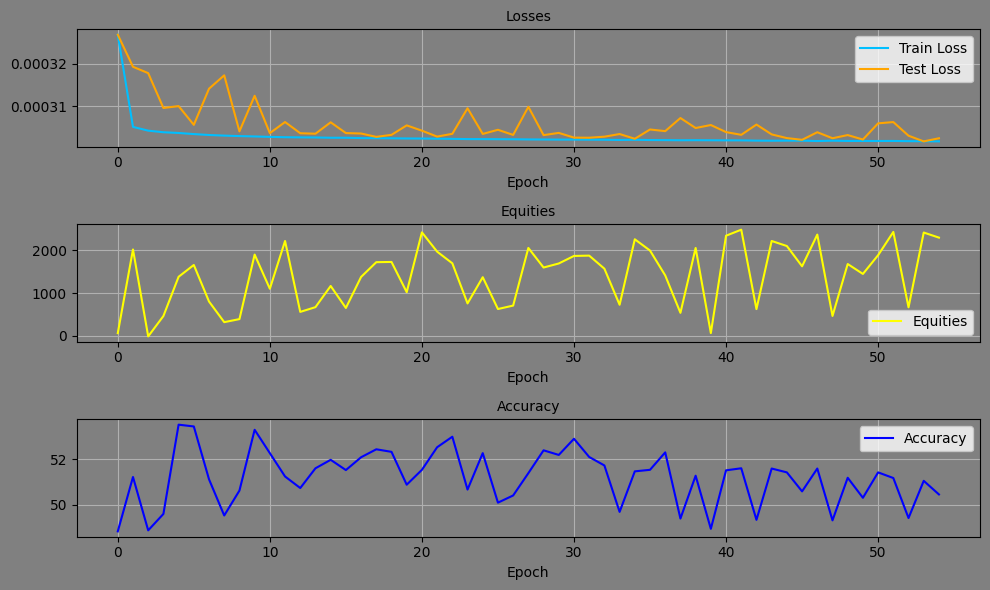

Epoch: 54, Equity: 2637.18, Accuracy: 51.74 train_losses: 0.0007634187282382346, test_losses: 0.000302266504149884, Duration: 0:00:04.333664


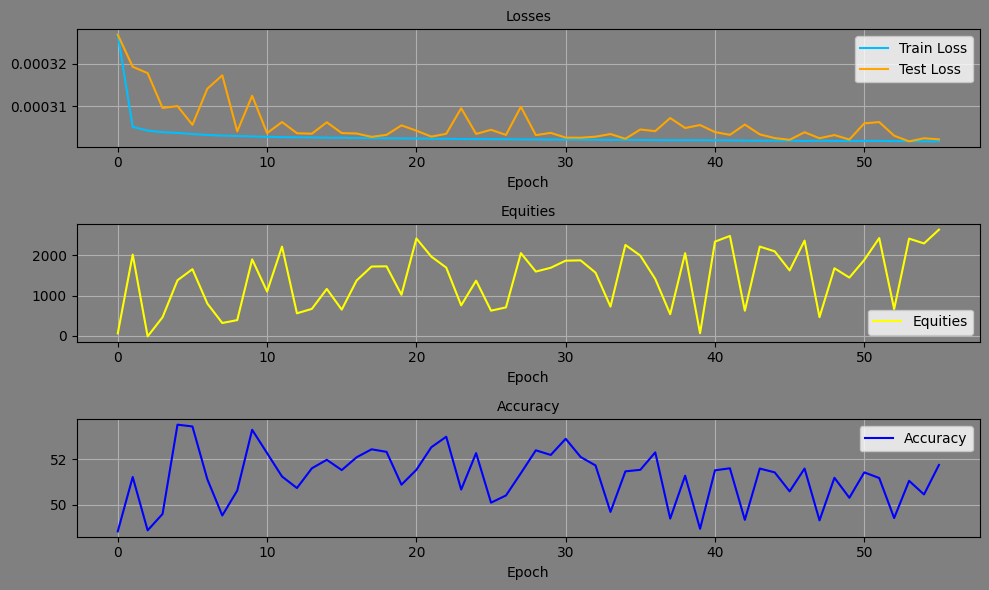

Epoch: 55, Equity: 826.27, Accuracy: 49.29 train_losses: 0.0007628219126363136, test_losses: 0.00030427746241912246, Duration: 0:00:04.891726


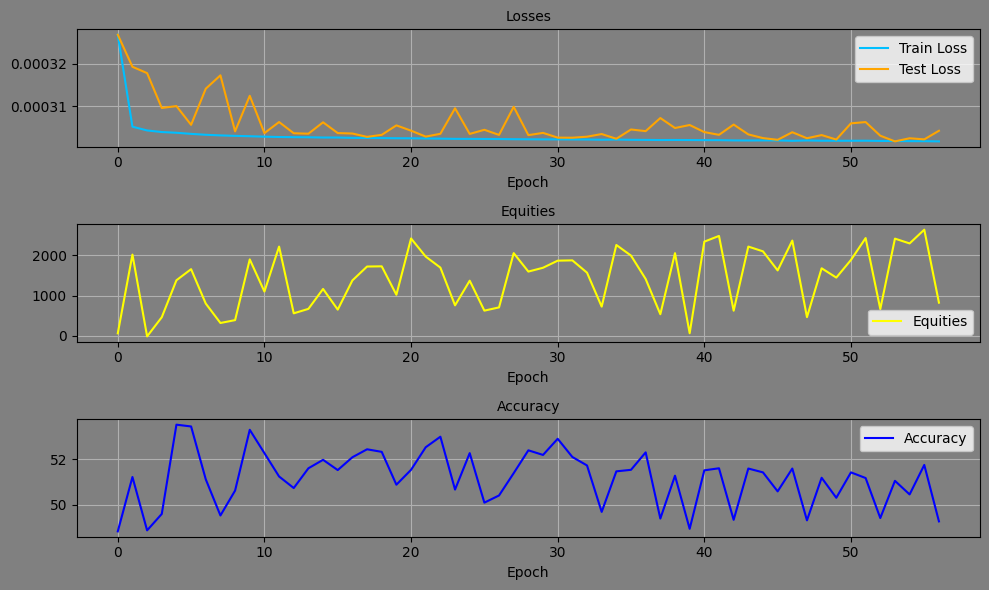

Epoch: 56, Equity: 890.92, Accuracy: 49.36 train_losses: 0.0007625989939615325, test_losses: 0.0003048245271202177, Duration: 0:00:05.278092


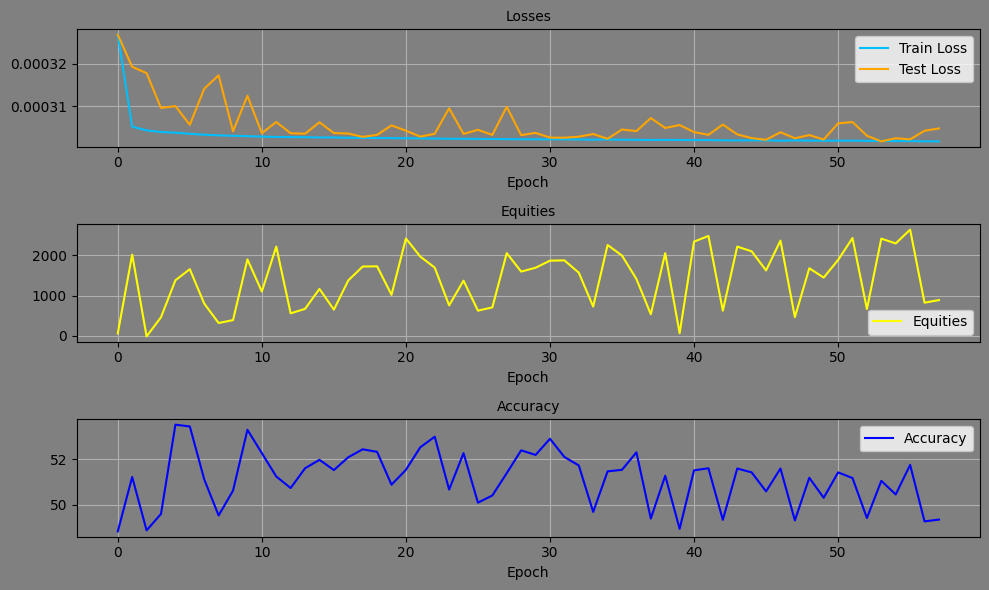

Epoch: 57, Equity: 1108.74, Accuracy: 49.72 train_losses: 0.0007624301164477847, test_losses: 0.0003030991938430816, Duration: 0:00:05.312544


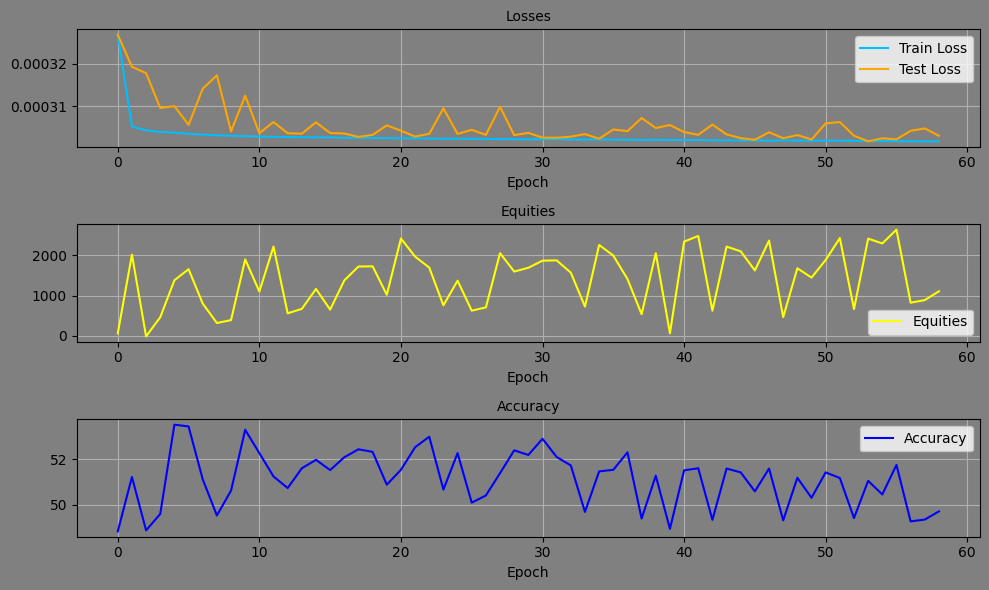

Epoch: 58, Equity: 2086.43, Accuracy: 51.35 train_losses: 0.0007619580439456781, test_losses: 0.00030181737383827567, Duration: 0:00:05.283534


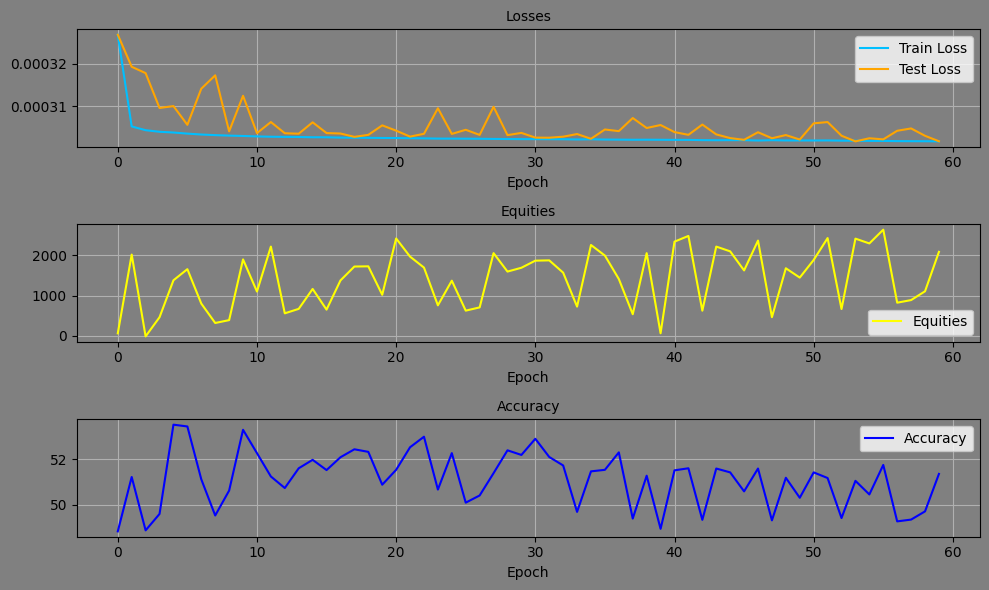

Epoch: 59, Equity: 2221.38, Accuracy: 51.30 train_losses: 0.0007616956834612284, test_losses: 0.00030252974829636514, Duration: 0:00:05.267310


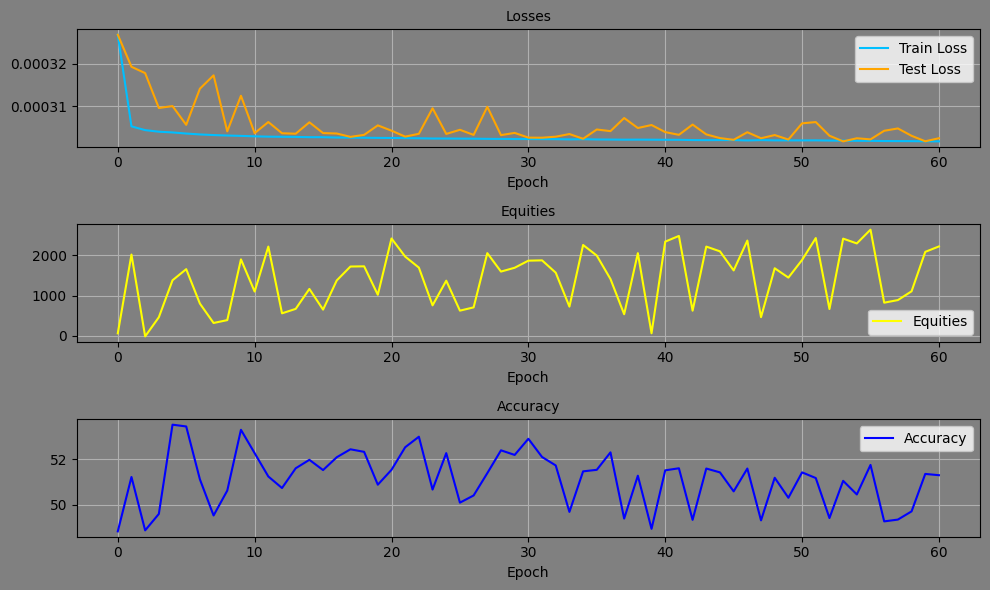

Epoch: 60, Equity: 2054.51, Accuracy: 49.83 train_losses: 0.0007611258018749168, test_losses: 0.0003037095593754202, Duration: 0:00:05.406921


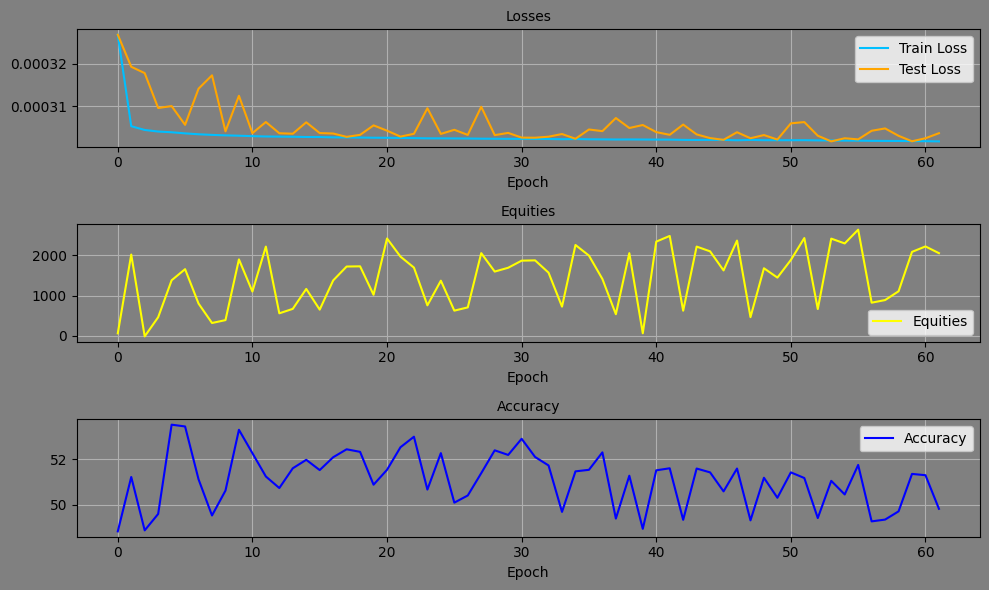

Epoch: 61, Equity: 678.74, Accuracy: 49.06 train_losses: 0.0007608027473544483, test_losses: 0.00030353048350661993, Duration: 0:00:05.069483


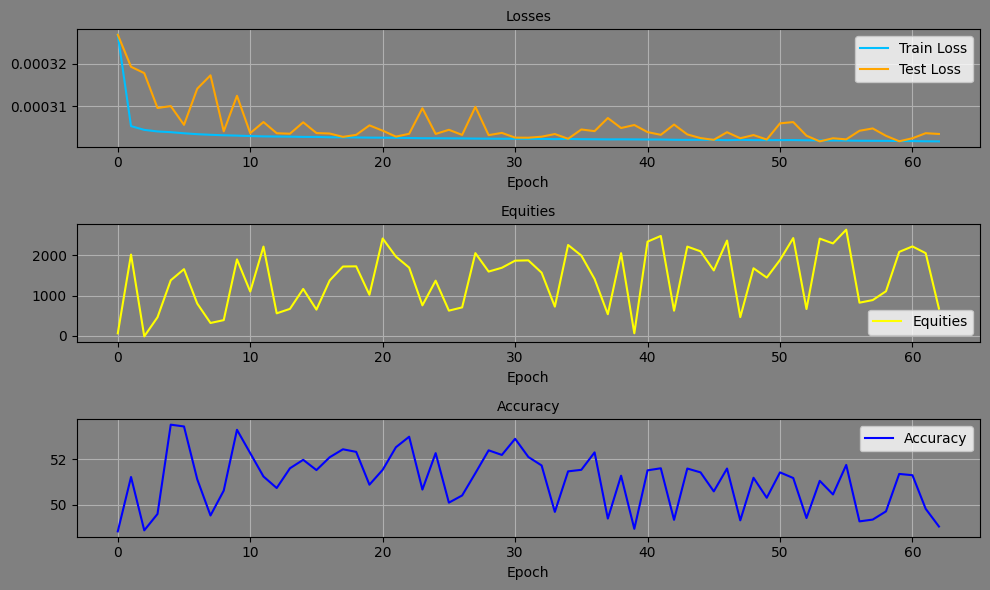

Epoch: 62, Equity: 1414.77, Accuracy: 49.77 train_losses: 0.0007605613029048149, test_losses: 0.00030578760197386146, Duration: 0:00:05.253549


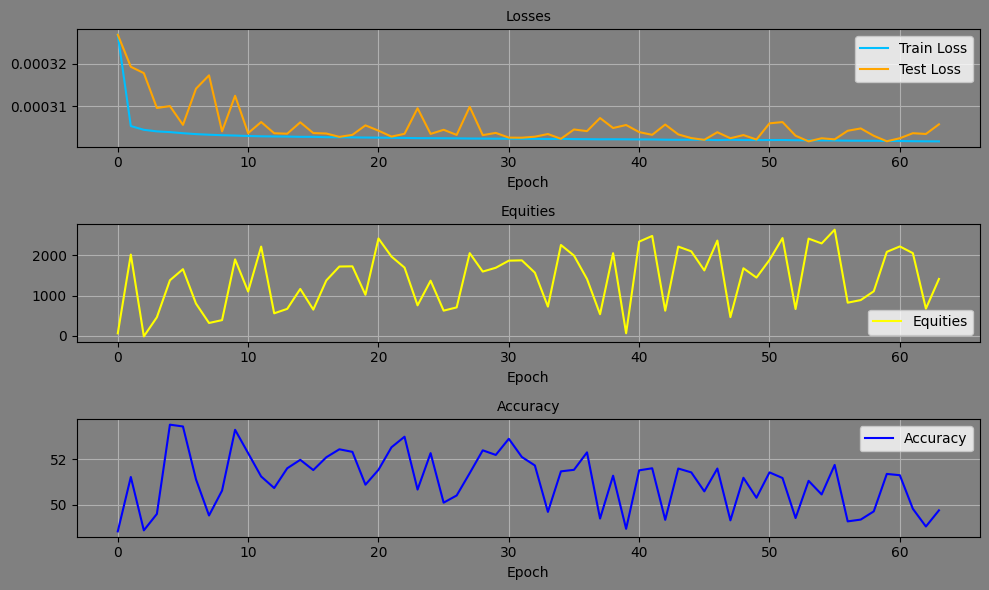

Epoch: 63, Equity: 2655.65, Accuracy: 51.46 train_losses: 0.0007605966511942708, test_losses: 0.0003019611758645624, Duration: 0:00:04.209944


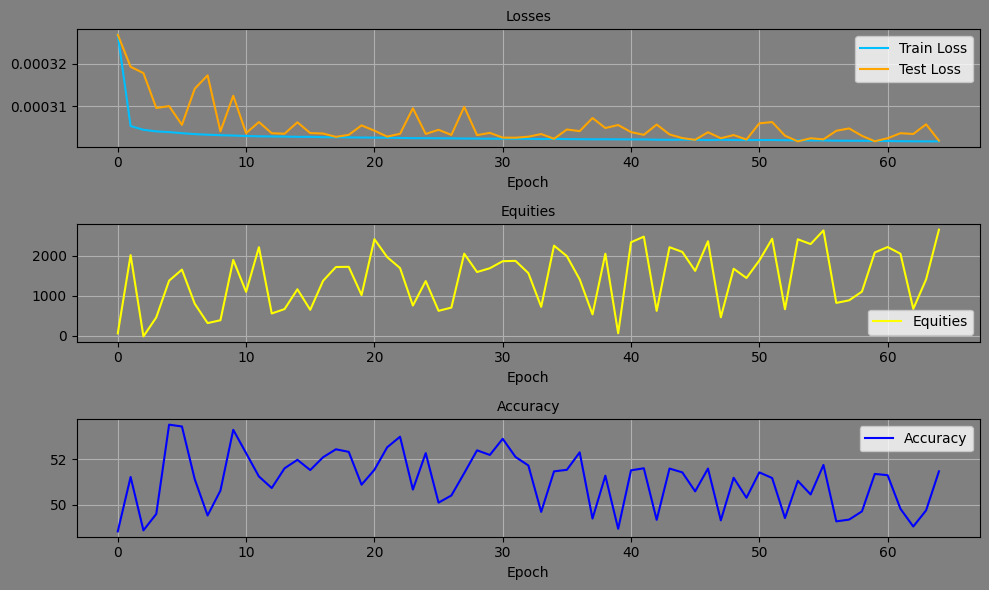

Epoch: 64, Equity: 2472.66, Accuracy: 50.60 train_losses: 0.0007603321515351273, test_losses: 0.00030578221776522696, Duration: 0:00:05.653103


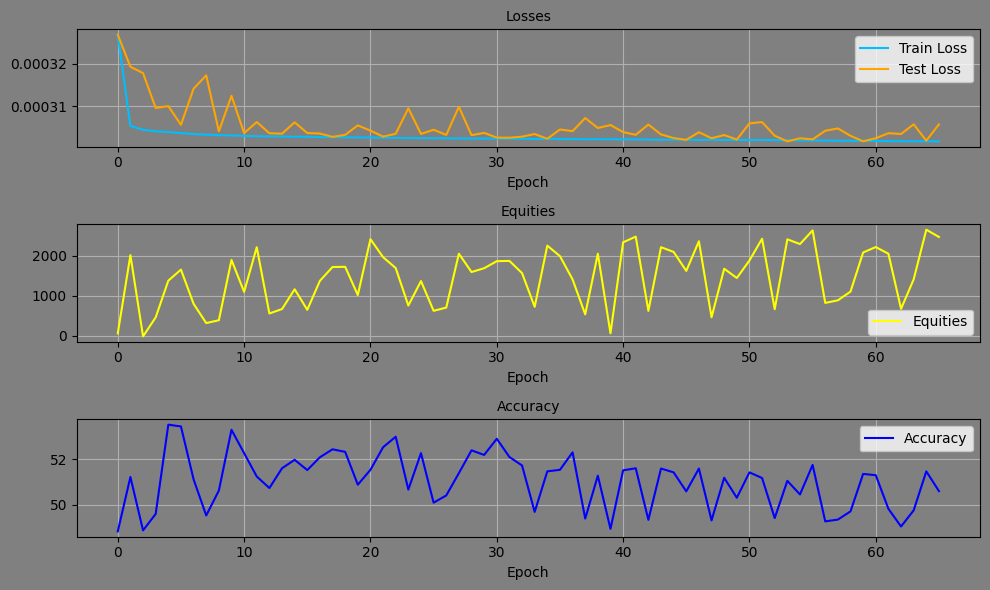

Epoch: 65, Equity: 2656.68, Accuracy: 51.08 train_losses: 0.0007602944520109058, test_losses: 0.00030220317421481013, Duration: 0:00:04.927781


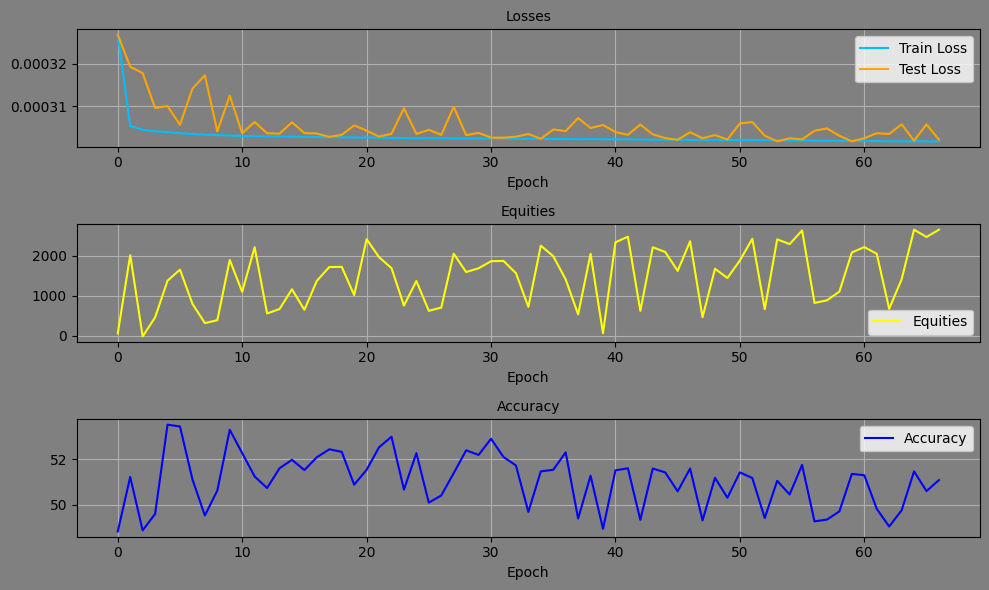

Epoch: 66, Equity: 1140.77, Accuracy: 49.39 train_losses: 0.0007595413172067102, test_losses: 0.0003032655513379723, Duration: 0:00:05.253268


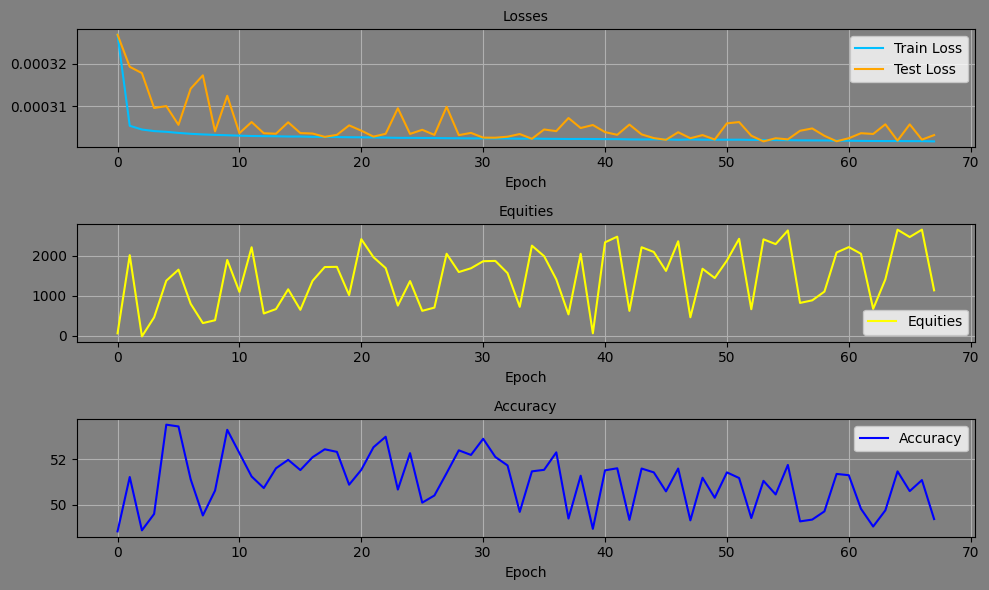

Epoch: 67, Equity: 2144.07, Accuracy: 51.04 train_losses: 0.0007598392643566958, test_losses: 0.00030156882712617517, Duration: 0:00:06.044256


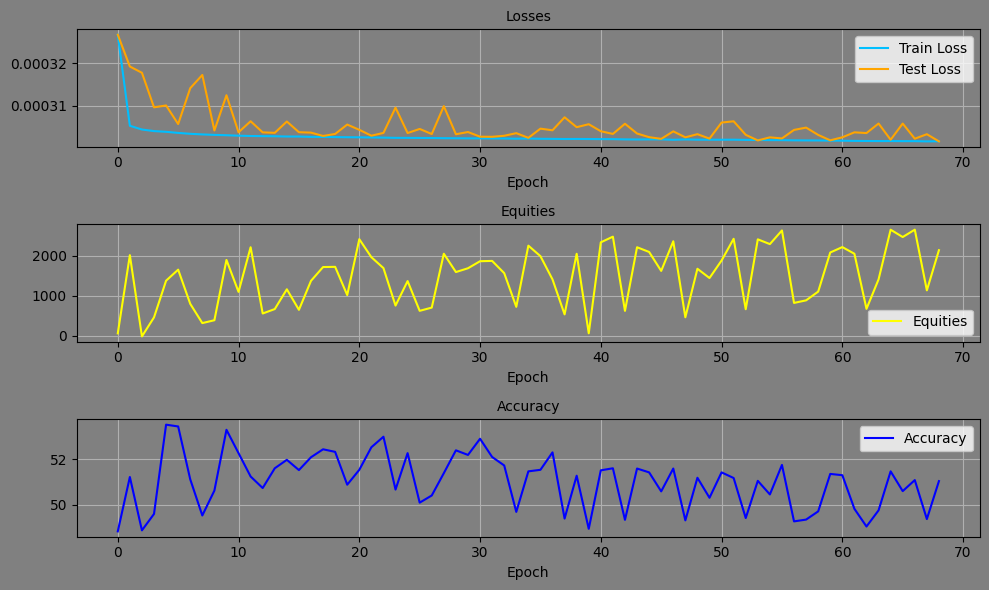

Epoch: 68, Equity: 463.81, Accuracy: 49.16 train_losses: 0.0007591950762376172, test_losses: 0.00030873974901624024, Duration: 0:00:05.773108


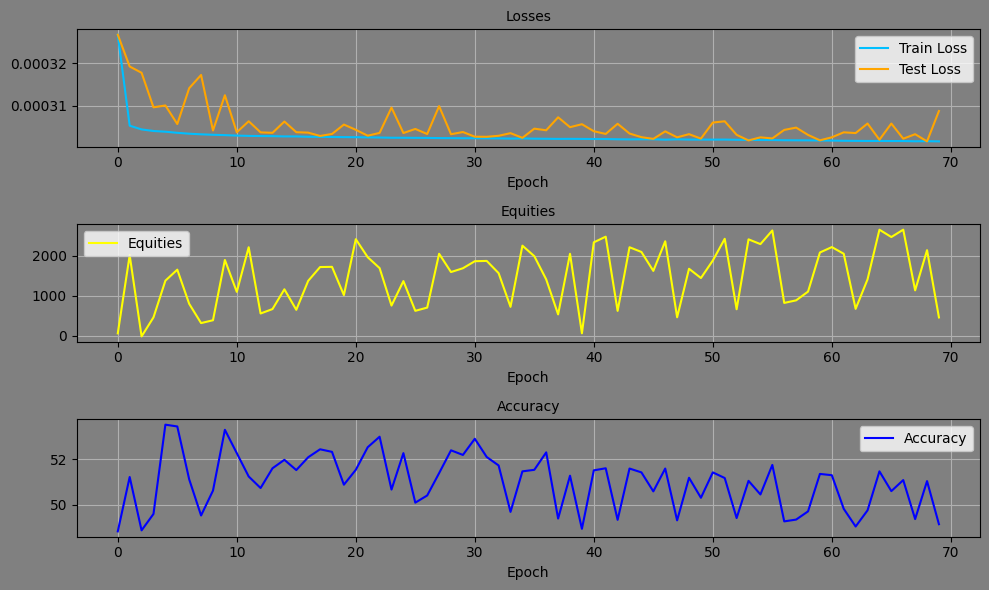

Epoch: 69, Equity: 2502.36, Accuracy: 51.44 train_losses: 0.0007588418821933967, test_losses: 0.00030232424614951015, Duration: 0:00:05.371174


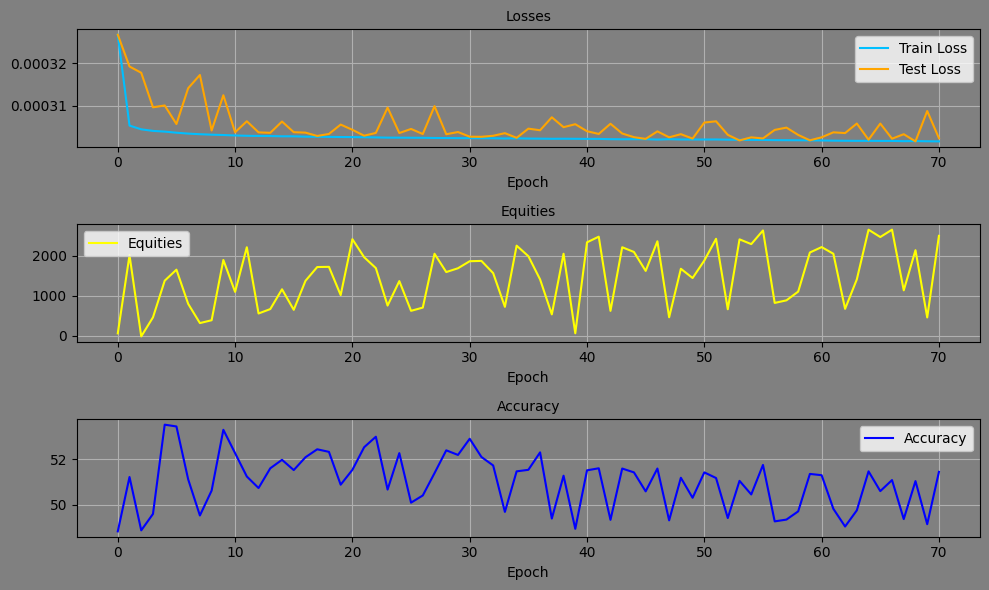

Epoch: 70, Equity: 1304.50, Accuracy: 49.39 train_losses: 0.0007588286772365851, test_losses: 0.00030694075394421816, Duration: 0:00:05.018393


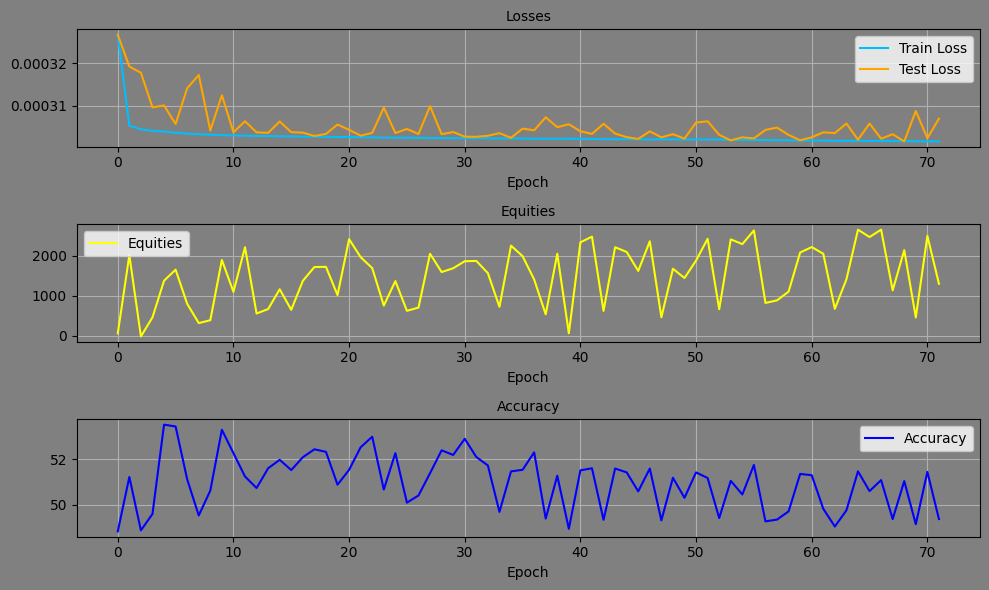

Epoch: 71, Equity: 1771.67, Accuracy: 51.17 train_losses: 0.0007586688434662742, test_losses: 0.00030252468422986567, Duration: 0:00:05.255082


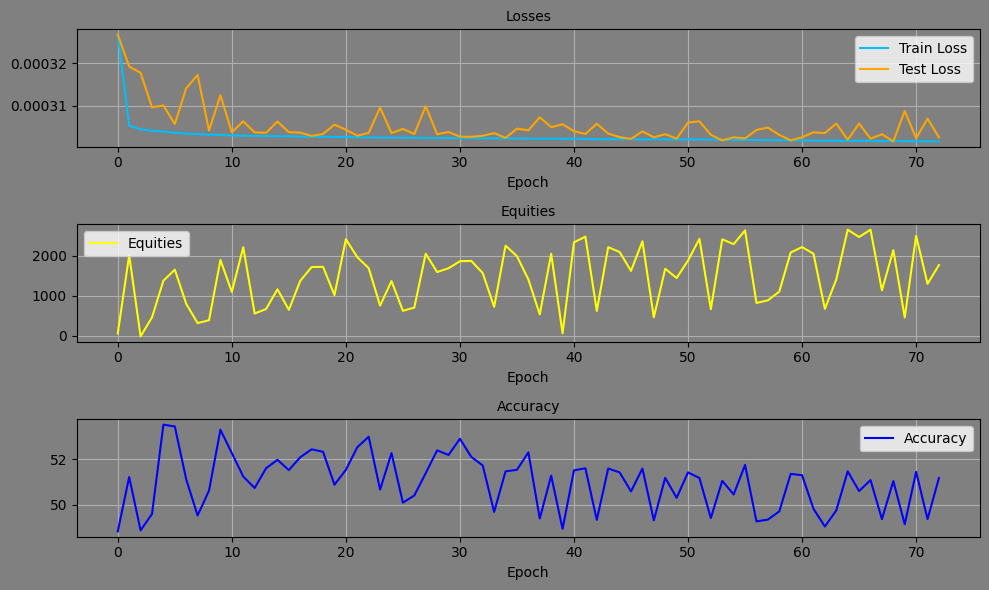

Epoch: 72, Equity: 1998.68, Accuracy: 49.47 train_losses: 0.000757930669981546, test_losses: 0.0003030727384611964, Duration: 0:00:05.160647


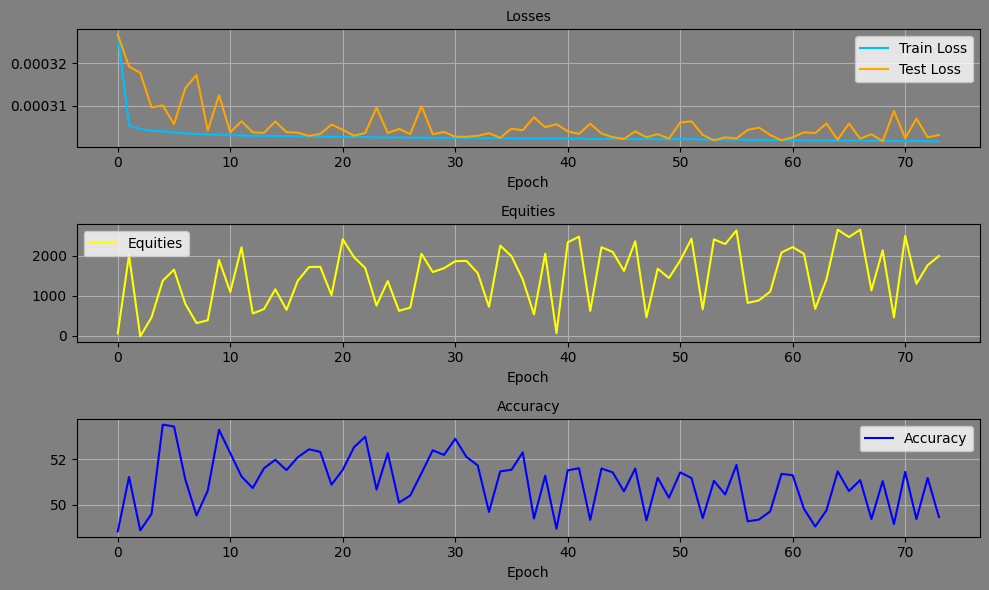

Epoch: 73, Equity: 1882.05, Accuracy: 51.20 train_losses: 0.0007584068198681561, test_losses: 0.0003024600737262517, Duration: 0:00:04.619162


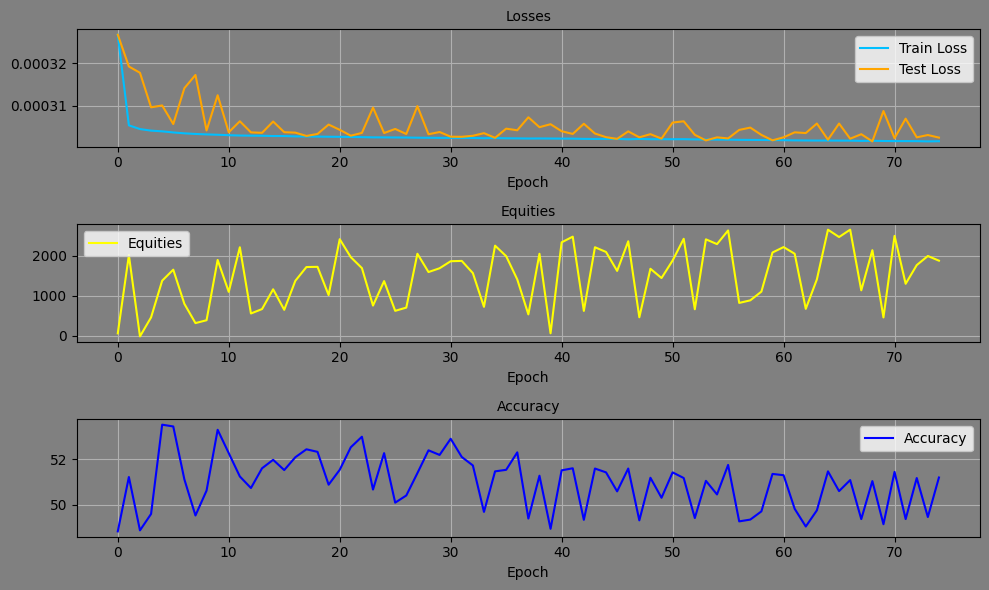

Epoch: 74, Equity: 2193.32, Accuracy: 51.14 train_losses: 0.0007585483168658921, test_losses: 0.00030271202558651567, Duration: 0:00:04.330301


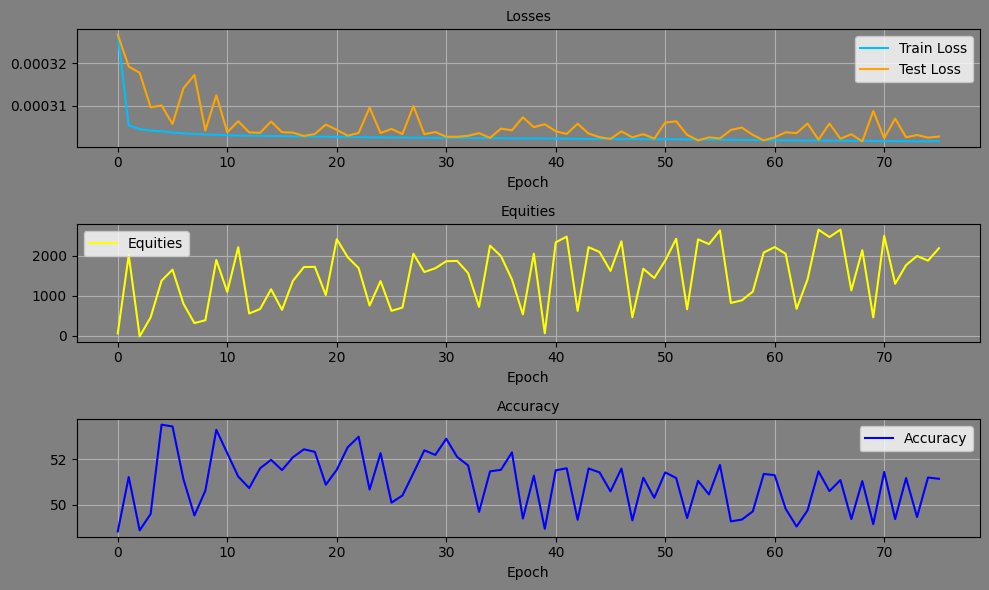

Epoch: 75, Equity: 1552.62, Accuracy: 49.78 train_losses: 0.0007577650153027319, test_losses: 0.0003025043988600373, Duration: 0:00:04.483742


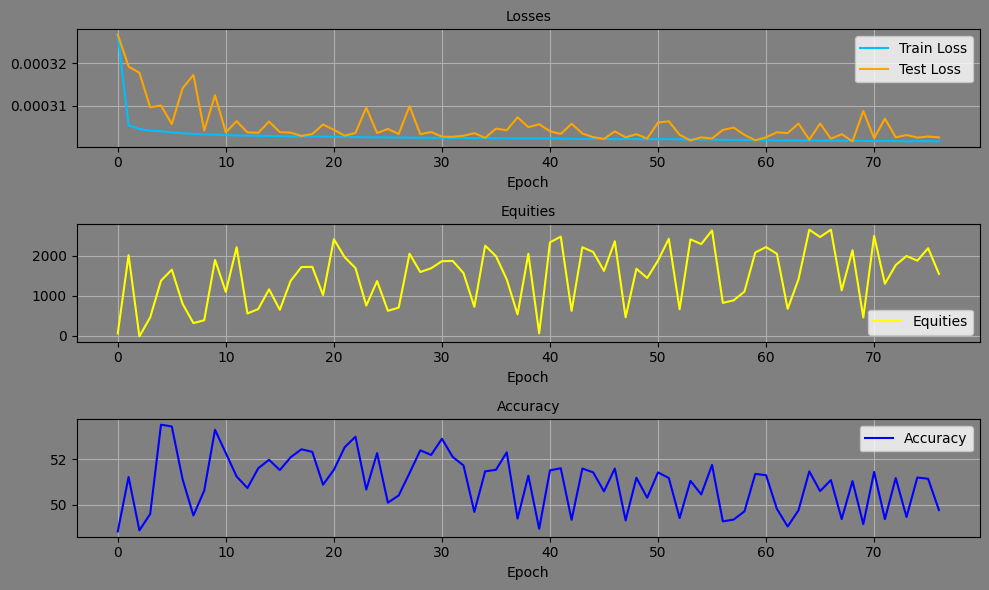

Epoch: 76, Equity: 2130.05, Accuracy: 49.70 train_losses: 0.0007574938197256605, test_losses: 0.0003035360132344067, Duration: 0:00:04.369500


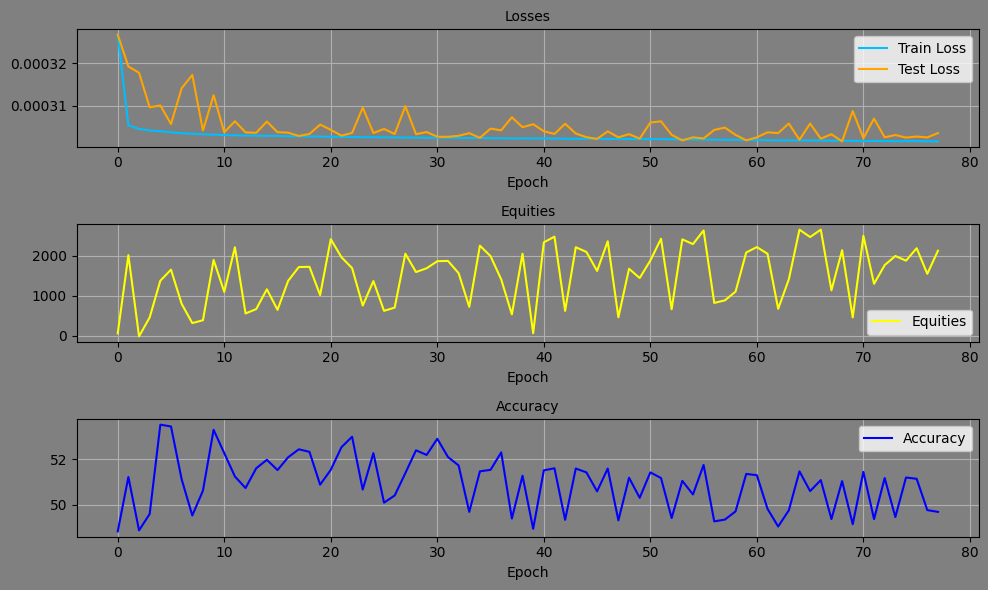

Epoch: 77, Equity: 2311.34, Accuracy: 51.28 train_losses: 0.0007572951974498587, test_losses: 0.0003023028839379549, Duration: 0:00:04.329928


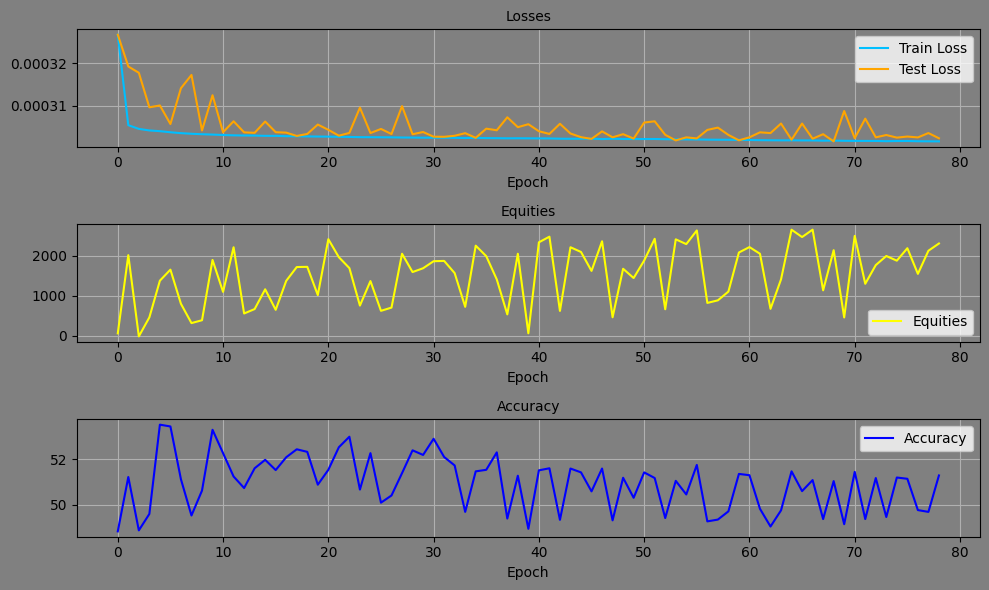

Epoch: 78, Equity: 2209.85, Accuracy: 50.27 train_losses: 0.0007571970833191888, test_losses: 0.0003030475927516818, Duration: 0:00:04.273951


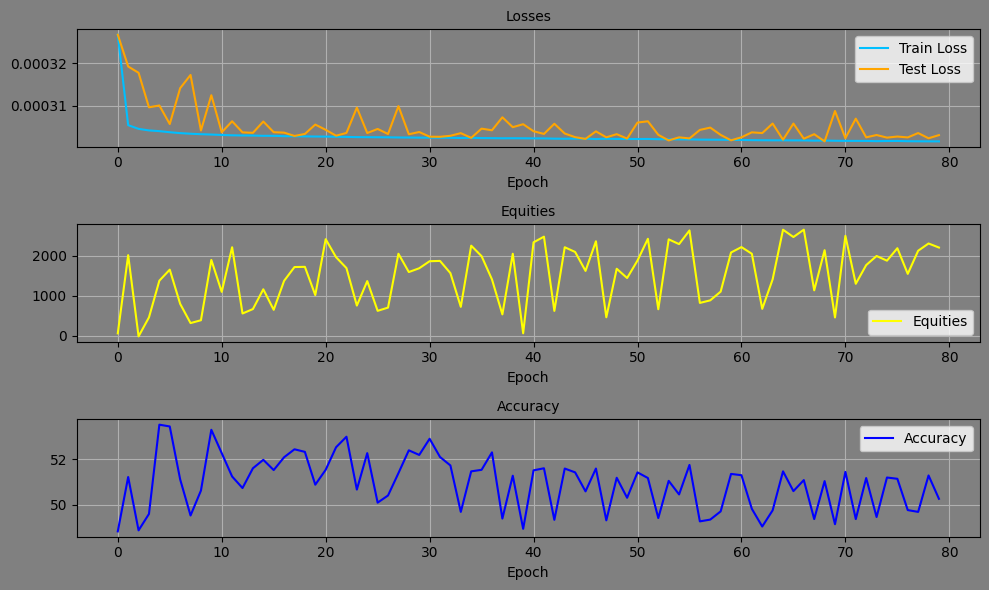

Epoch: 79, Equity: 957.57, Accuracy: 49.49 train_losses: 0.0007569894973656924, test_losses: 0.0003029695071745664, Duration: 0:00:04.282272


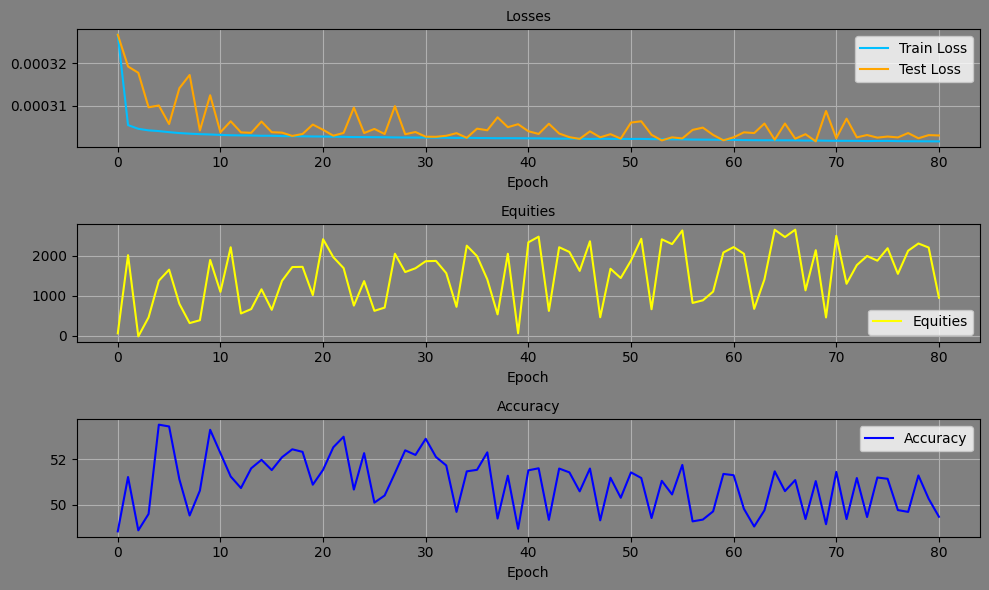

Epoch: 80, Equity: 2260.50, Accuracy: 50.96 train_losses: 0.0007564933841674775, test_losses: 0.0003031392116099596, Duration: 0:00:04.161621


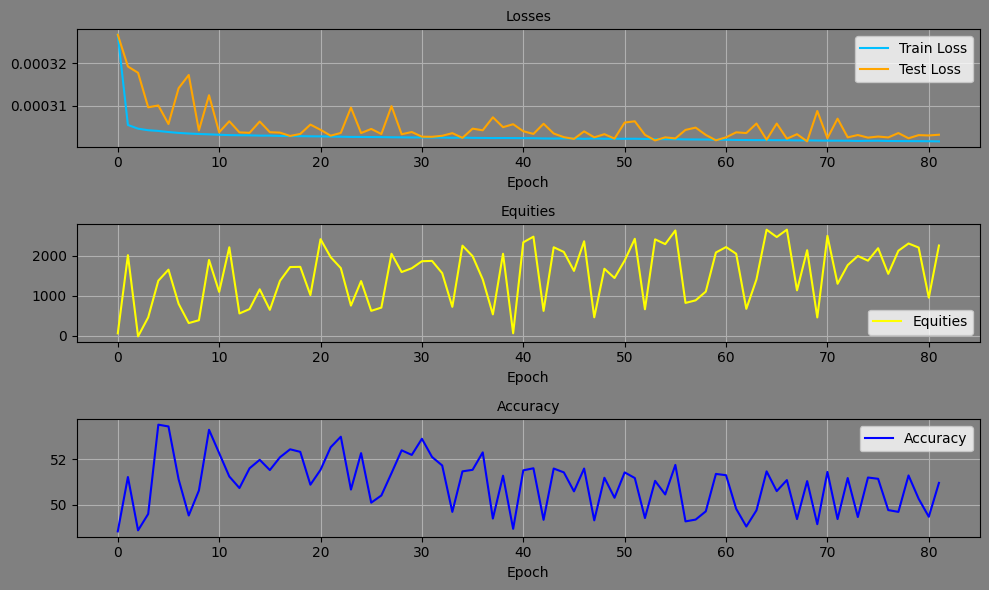

Epoch: 81, Equity: 2273.42, Accuracy: 49.73 train_losses: 0.0007560067499194003, test_losses: 0.00030150605016388, Duration: 0:00:04.461953


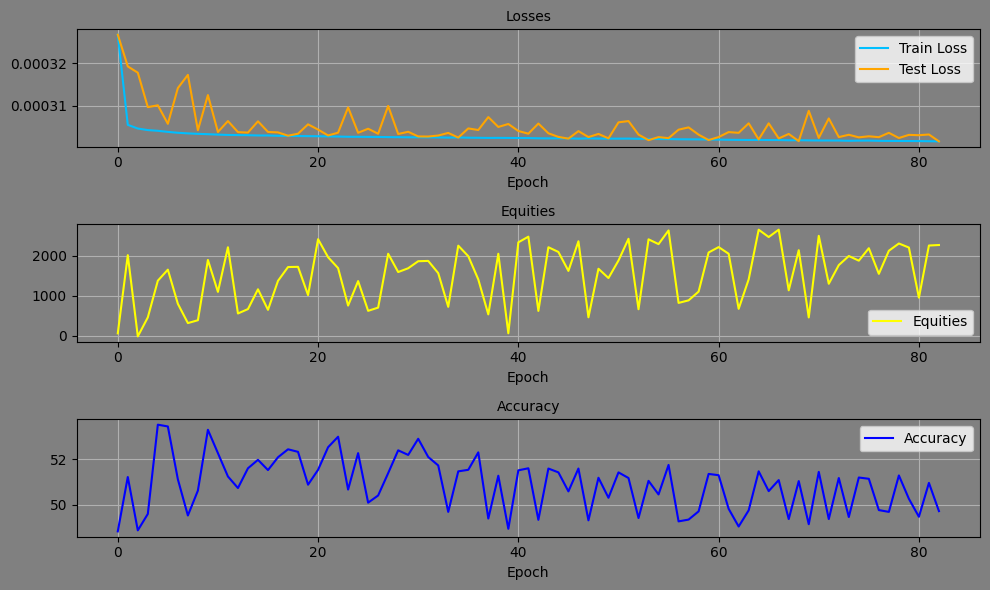

Epoch: 82, Equity: 1878.70, Accuracy: 51.13 train_losses: 0.0007556862101010749, test_losses: 0.00030688807601109147, Duration: 0:00:04.413185


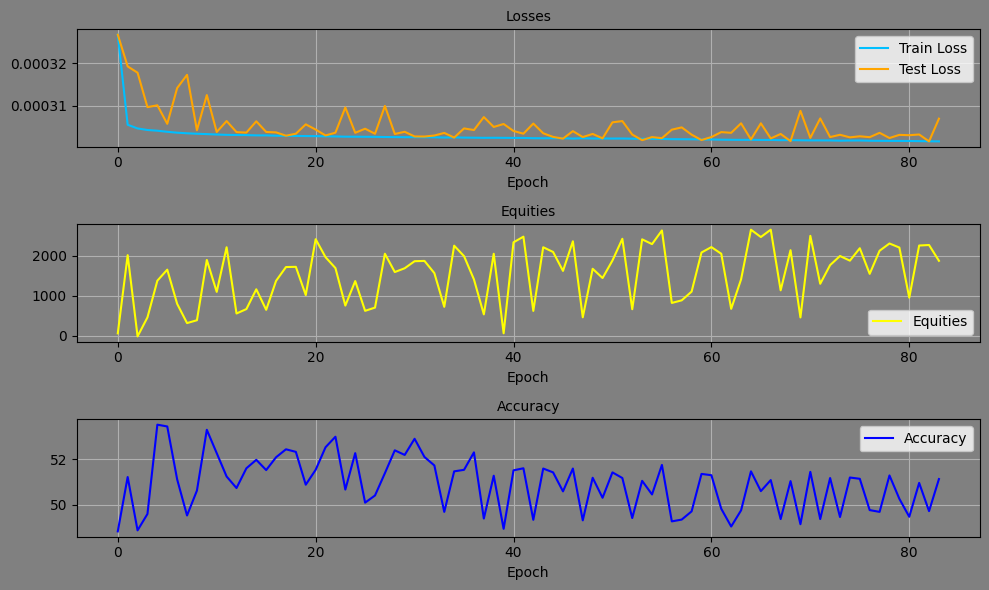

Epoch: 83, Equity: 2168.73, Accuracy: 50.55 train_losses: 0.0007551056111241389, test_losses: 0.0003040031297132373, Duration: 0:00:04.377698


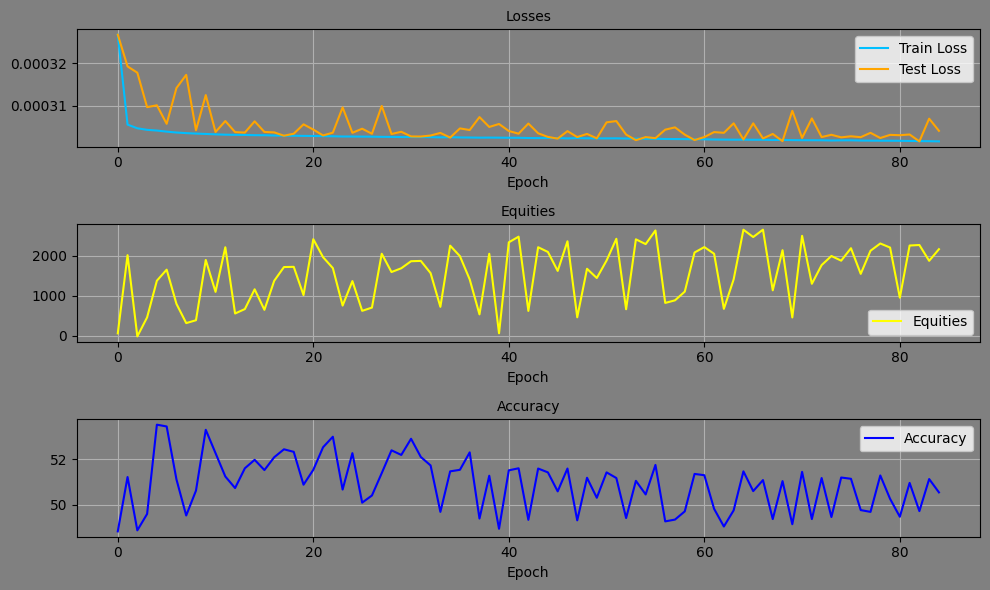

Epoch: 84, Equity: 2170.70, Accuracy: 50.87 train_losses: 0.0007546080505713757, test_losses: 0.0003017699928022921, Duration: 0:00:04.321440


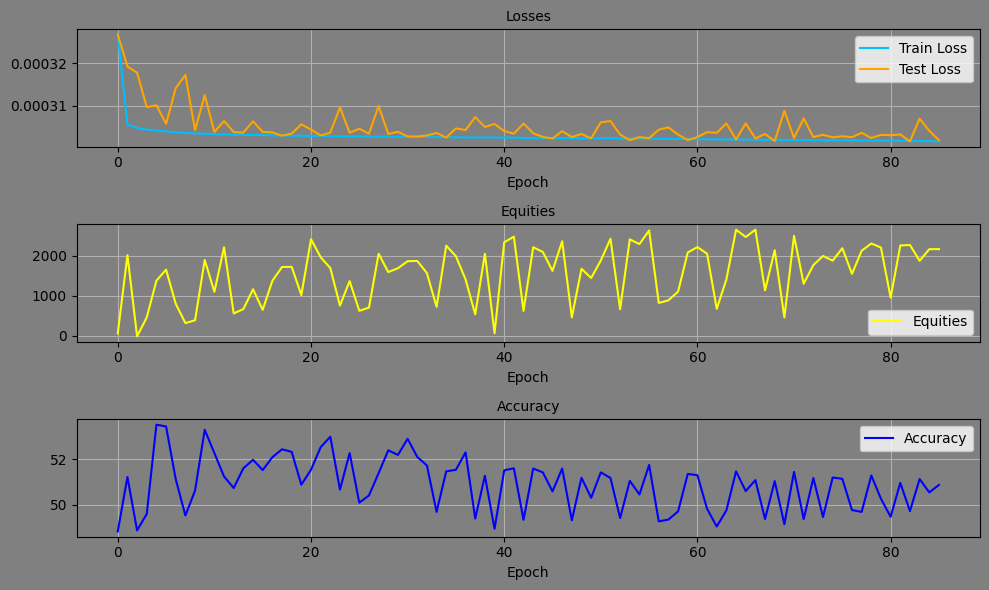

Epoch: 85, Equity: 811.73, Accuracy: 49.23 train_losses: 0.0007546951570153852, test_losses: 0.0003049829974770546, Duration: 0:00:04.192062


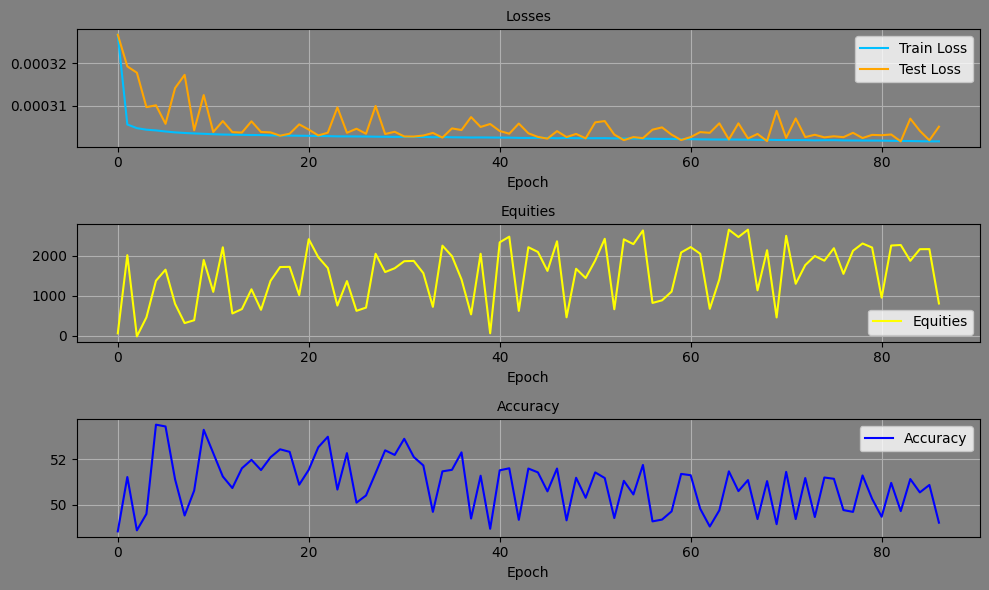

Epoch: 86, Equity: 1231.85, Accuracy: 49.89 train_losses: 0.0007543808126792837, test_losses: 0.0003041381132788956, Duration: 0:00:04.357455


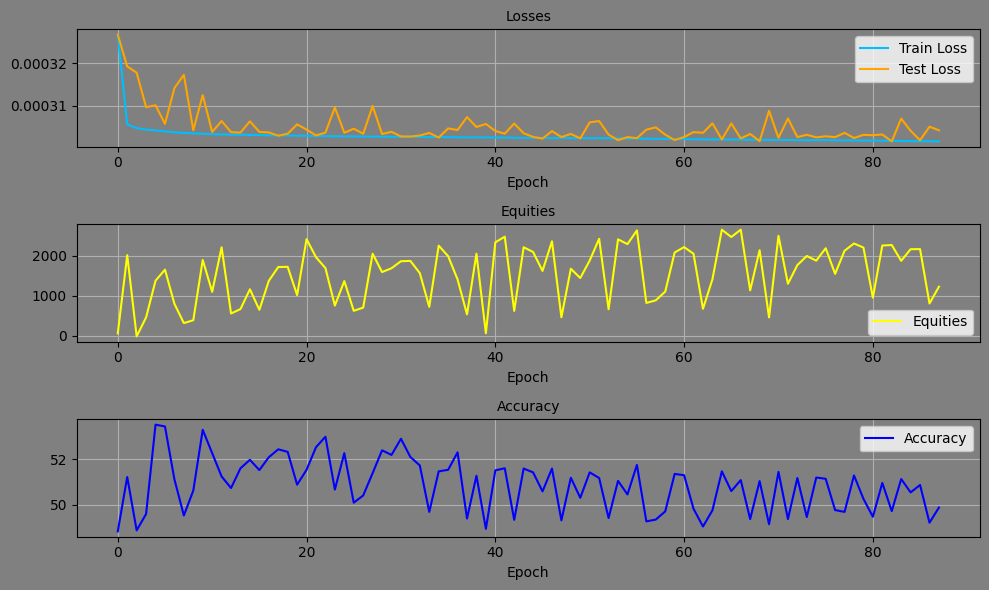

Epoch: 87, Equity: 2154.13, Accuracy: 51.34 train_losses: 0.000754067922602554, test_losses: 0.00030306674307212234, Duration: 0:00:04.410753


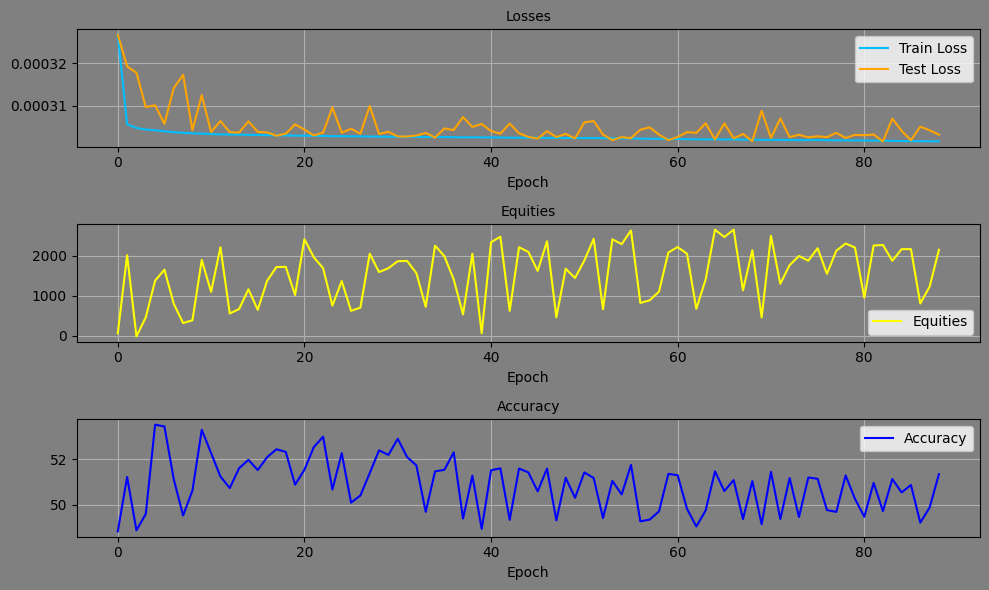

Epoch: 88, Equity: 1857.39, Accuracy: 49.18 train_losses: 0.0007533410495258415, test_losses: 0.0003041003365069628, Duration: 0:00:04.384551


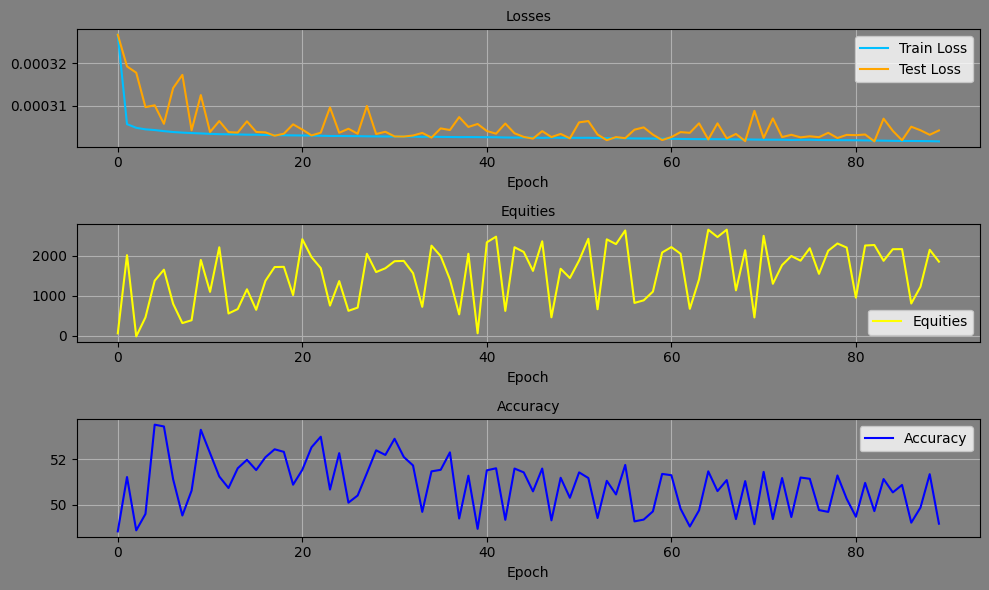

Epoch: 89, Equity: 2529.55, Accuracy: 50.42 train_losses: 0.0007530434822188199, test_losses: 0.00030259971390478313, Duration: 0:00:04.383771


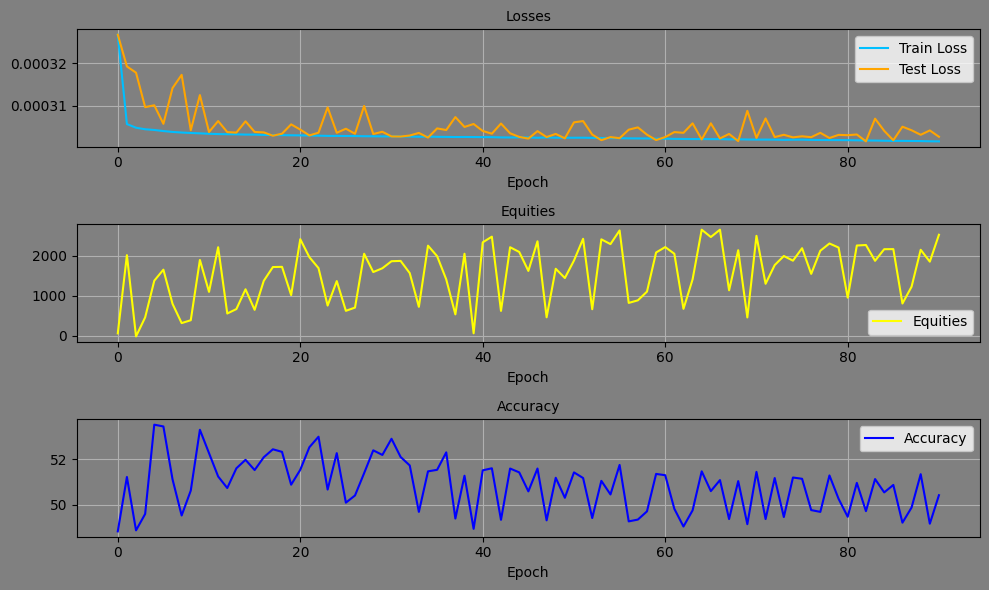

Epoch: 90, Equity: 1970.36, Accuracy: 49.08 train_losses: 0.0007538436035476009, test_losses: 0.00030241356580518186, Duration: 0:00:04.337595


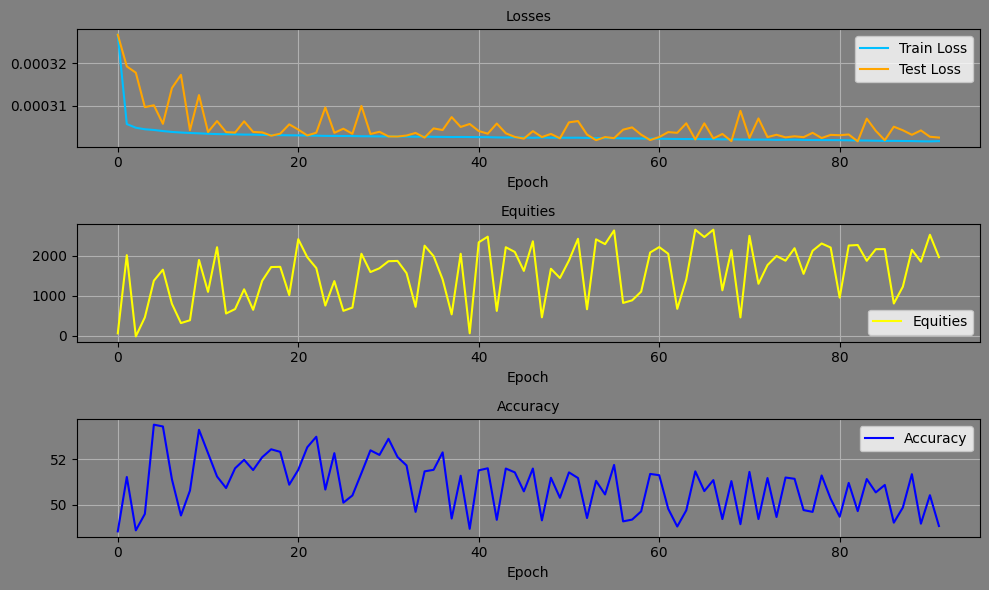

Epoch: 91, Equity: 2675.96, Accuracy: 50.27 train_losses: 0.0007522683127466377, test_losses: 0.0003046849451493472, Duration: 0:00:04.368591


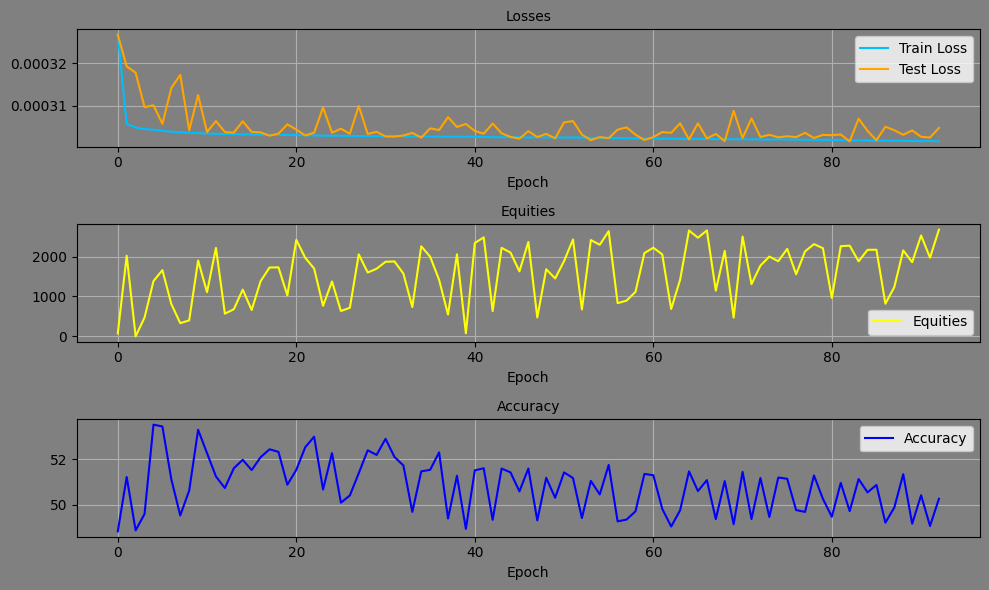

Epoch: 92, Equity: 1522.90, Accuracy: 49.05 train_losses: 0.0007527169582058652, test_losses: 0.00030219231848604977, Duration: 0:00:04.456858


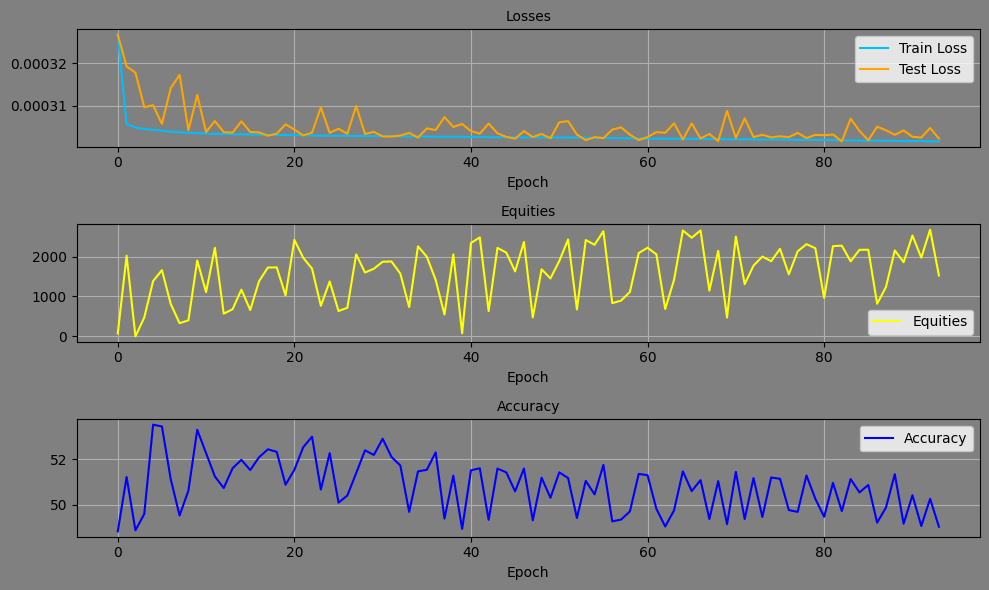

Epoch: 93, Equity: 2374.27, Accuracy: 50.85 train_losses: 0.0007527911796712085, test_losses: 0.00030202168272808194, Duration: 0:00:04.262039


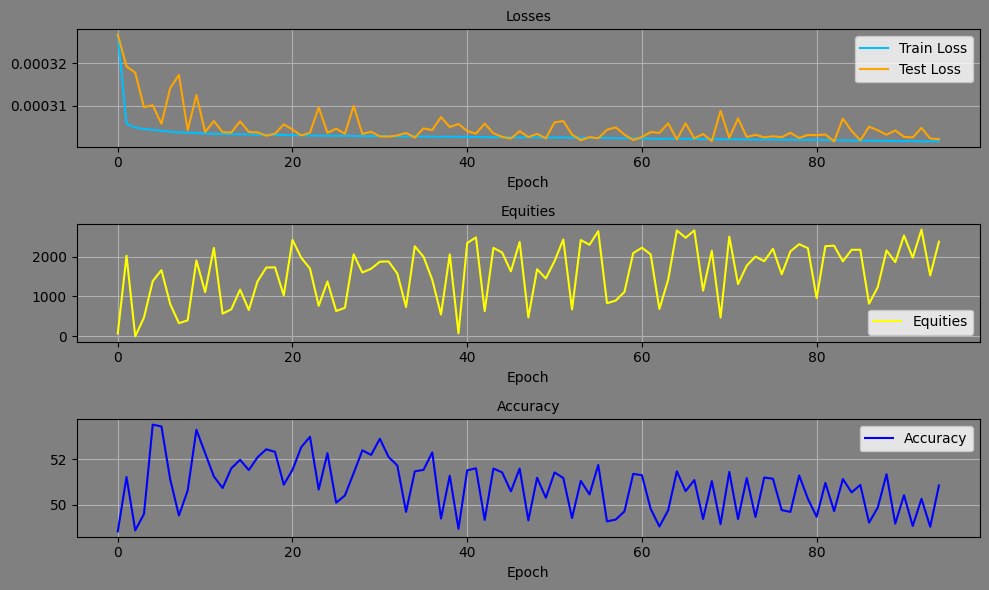

Epoch: 94, Equity: 2282.64, Accuracy: 51.06 train_losses: 0.0007517543001014663, test_losses: 0.000303068634821102, Duration: 0:00:04.380645


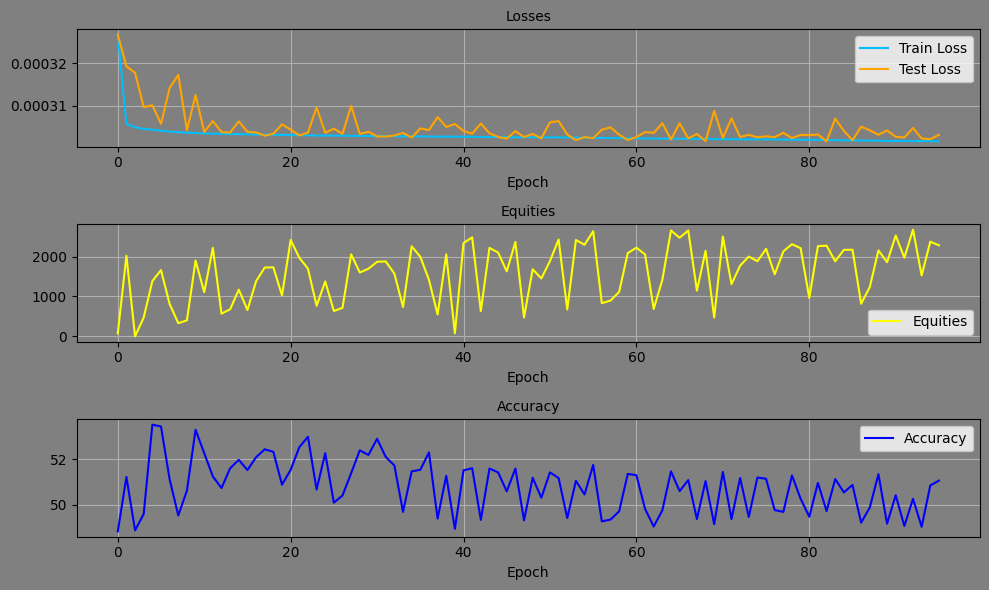

Epoch: 95, Equity: 2212.08, Accuracy: 50.12 train_losses: 0.00075121859143537, test_losses: 0.0003035569388885051, Duration: 0:00:04.395731


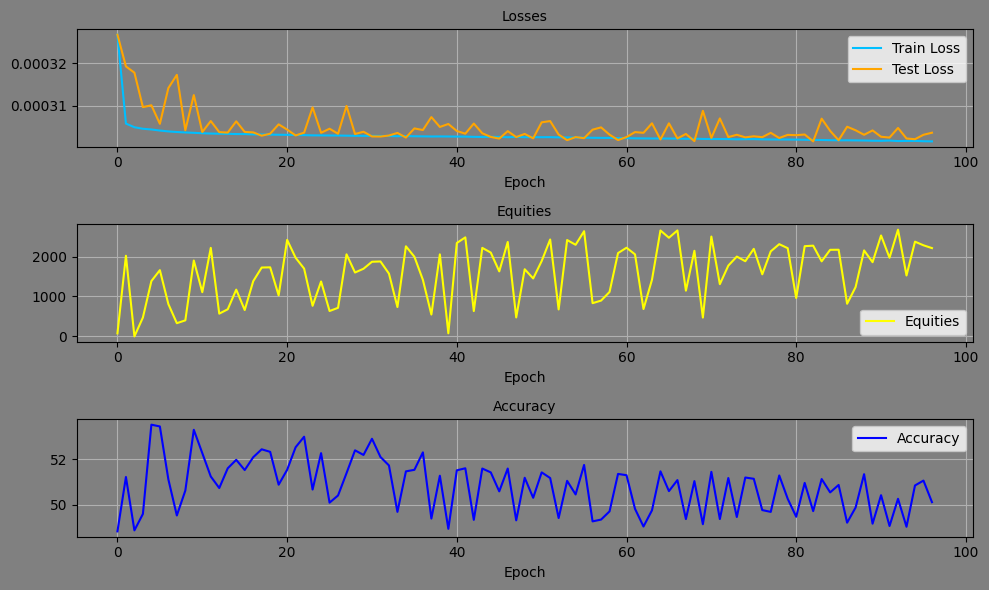

Epoch: 96, Equity: 2399.12, Accuracy: 51.27 train_losses: 0.0007518562843424737, test_losses: 0.0003043076430913061, Duration: 0:00:04.319398


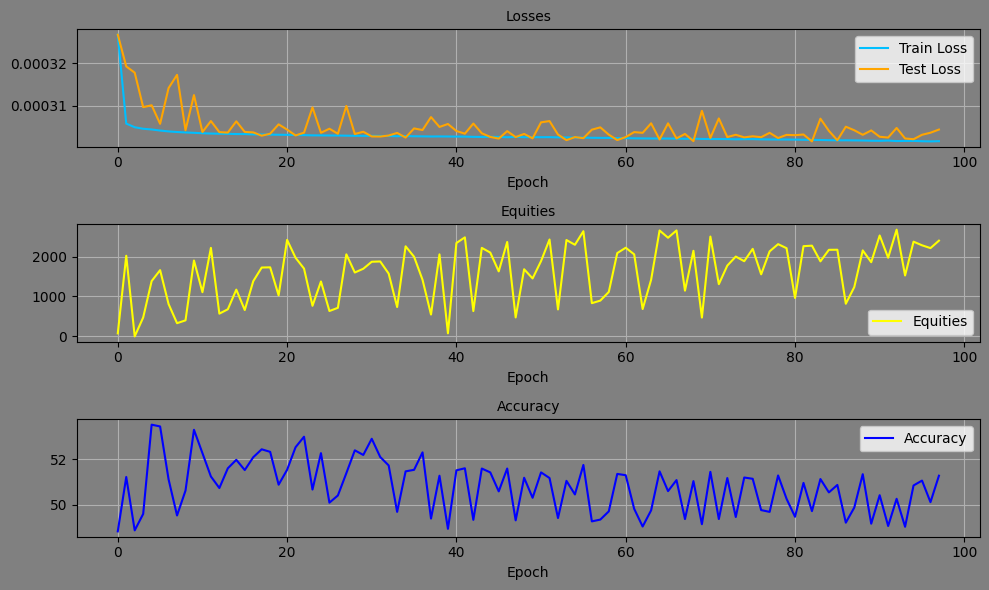

Epoch: 97, Equity: 1157.98, Accuracy: 49.64 train_losses: 0.0007510446707853685, test_losses: 0.0003036957641597837, Duration: 0:00:04.461002


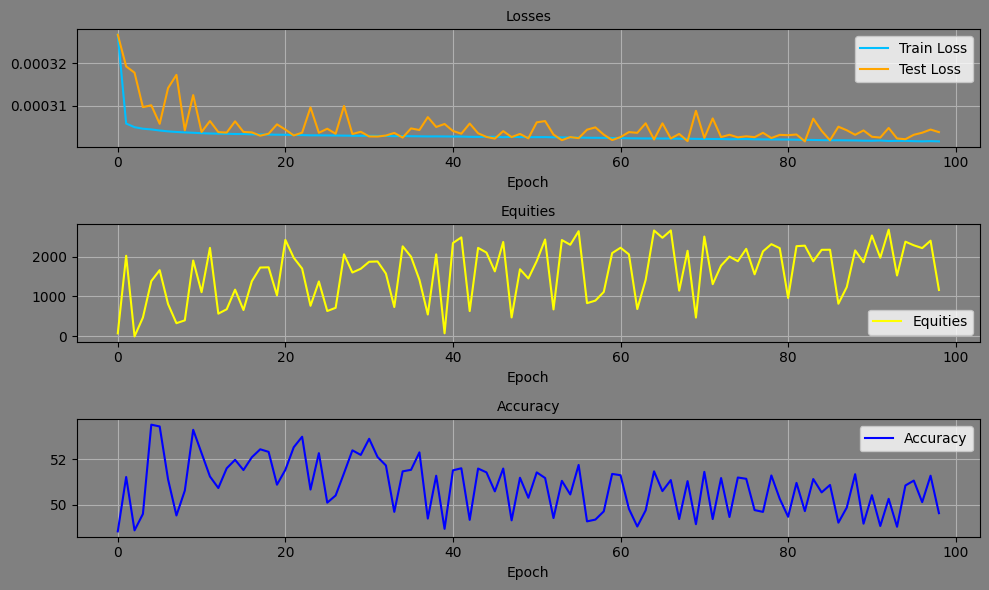

Epoch: 98, Equity: 2447.29, Accuracy: 51.02 train_losses: 0.0007510457500912543, test_losses: 0.000303900393191725, Duration: 0:00:04.323416


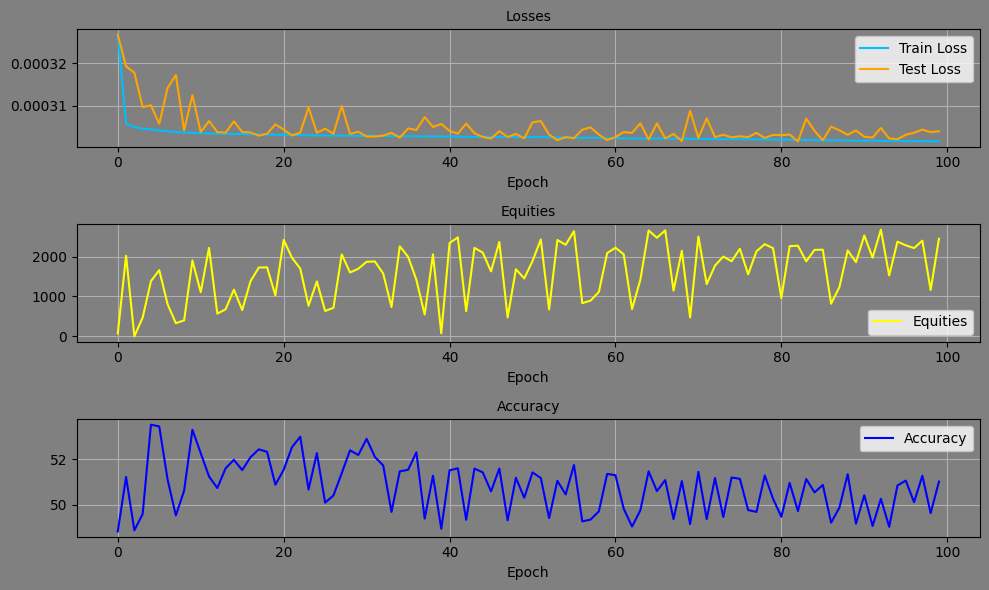

Epoch: 99, Equity: 2832.47, Accuracy: 51.46 train_losses: 0.0007508035738598102, test_losses: 0.0003043855831492692, Duration: 0:00:04.451726


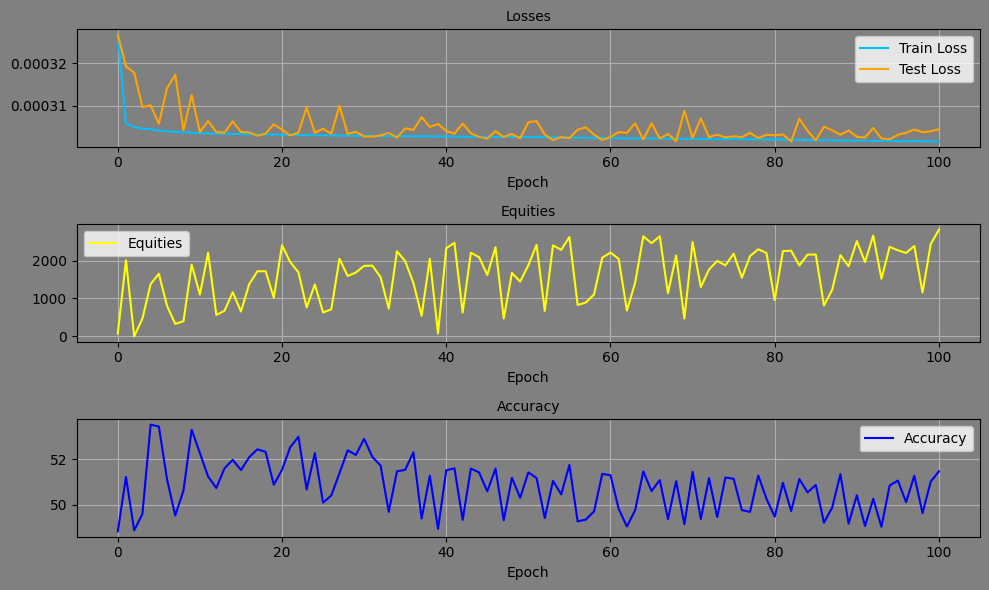

Epoch: 100, Equity: 2602.52, Accuracy: 48.94 train_losses: 0.0007507496800994934, test_losses: 0.00030228254036046565, Duration: 0:00:04.472160


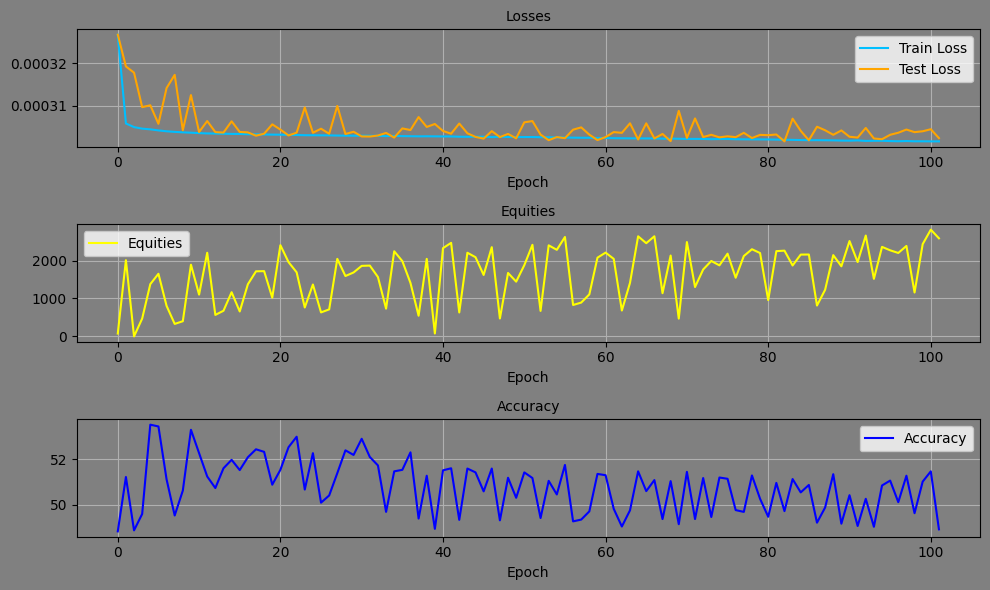

Epoch: 101, Equity: 2881.21, Accuracy: 50.57 train_losses: 0.0007504629422397483, test_losses: 0.00030204220092855394, Duration: 0:00:04.557984


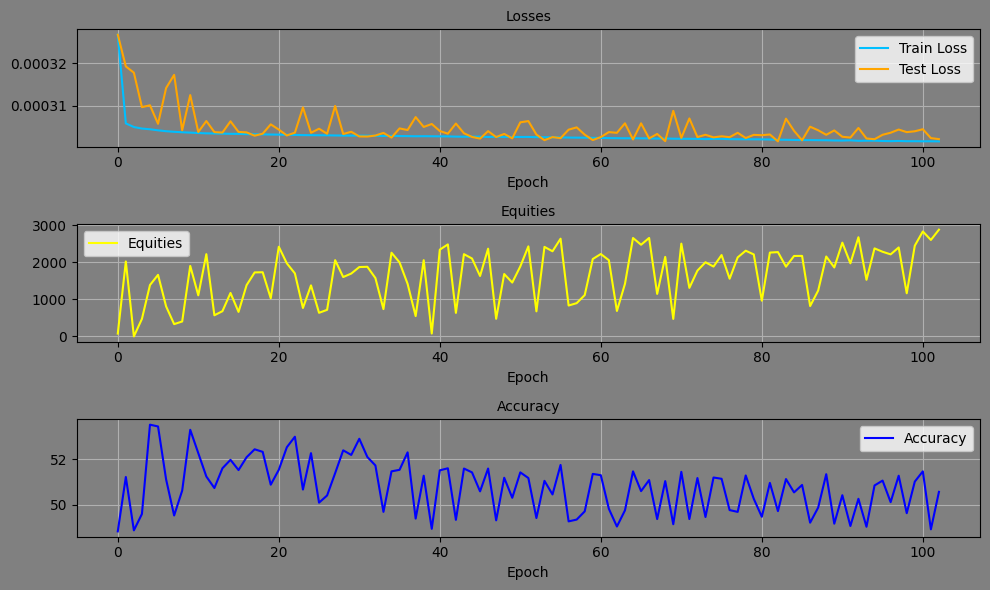

Epoch: 102, Equity: 2775.03, Accuracy: 51.52 train_losses: 0.0007503542369386249, test_losses: 0.00030244424124248326, Duration: 0:00:04.417056


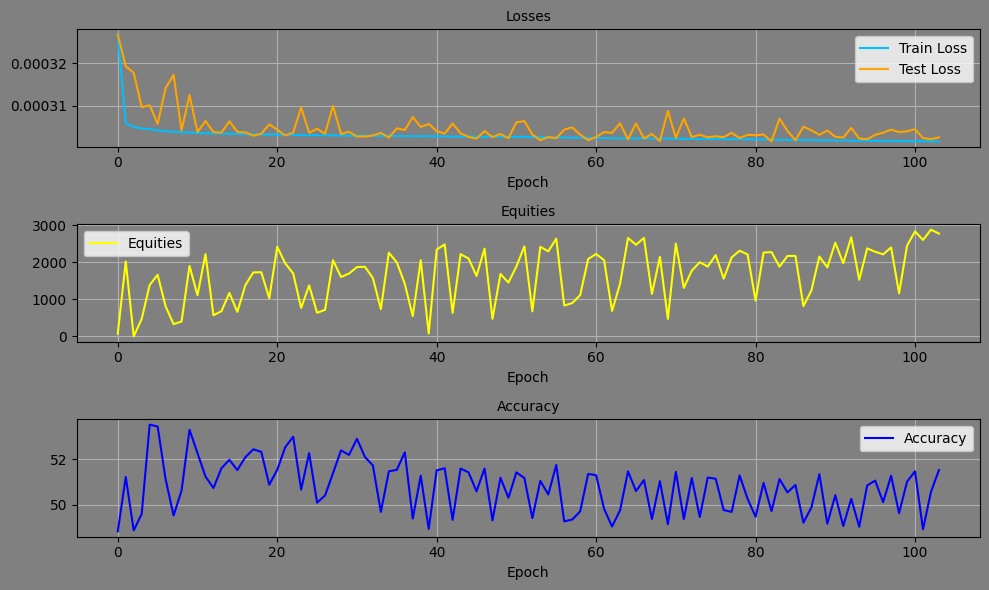

Epoch: 103, Equity: 1612.22, Accuracy: 48.99 train_losses: 0.0007497197990558784, test_losses: 0.000301732390653342, Duration: 0:00:04.353919


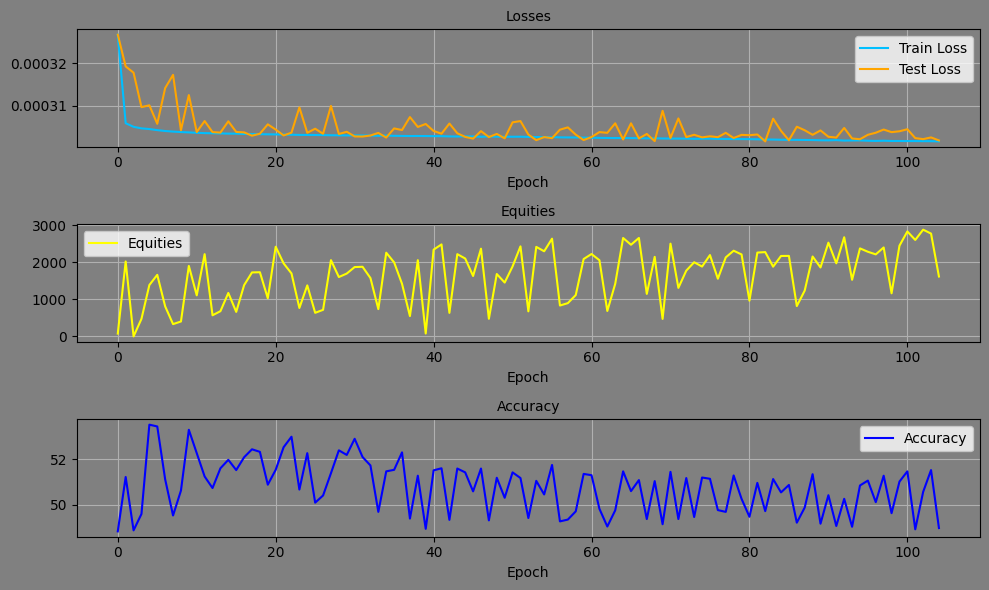

Epoch: 104, Equity: 807.00, Accuracy: 49.41 train_losses: 0.0007494232140117657, test_losses: 0.0003034449473489076, Duration: 0:00:04.489751


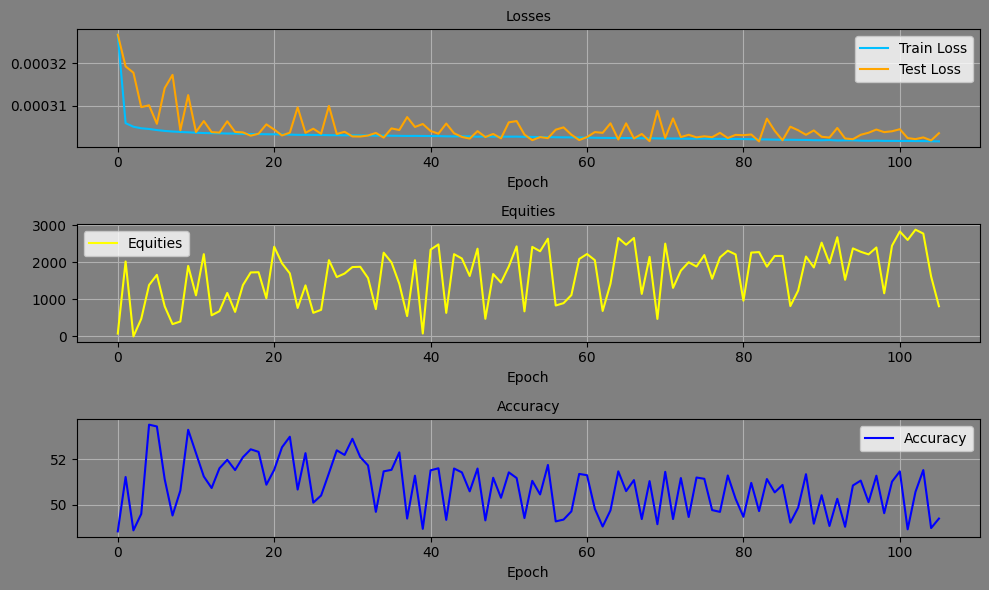

Epoch: 105, Equity: 2417.08, Accuracy: 49.83 train_losses: 0.000748806325911405, test_losses: 0.00030265082023106515, Duration: 0:00:04.362119


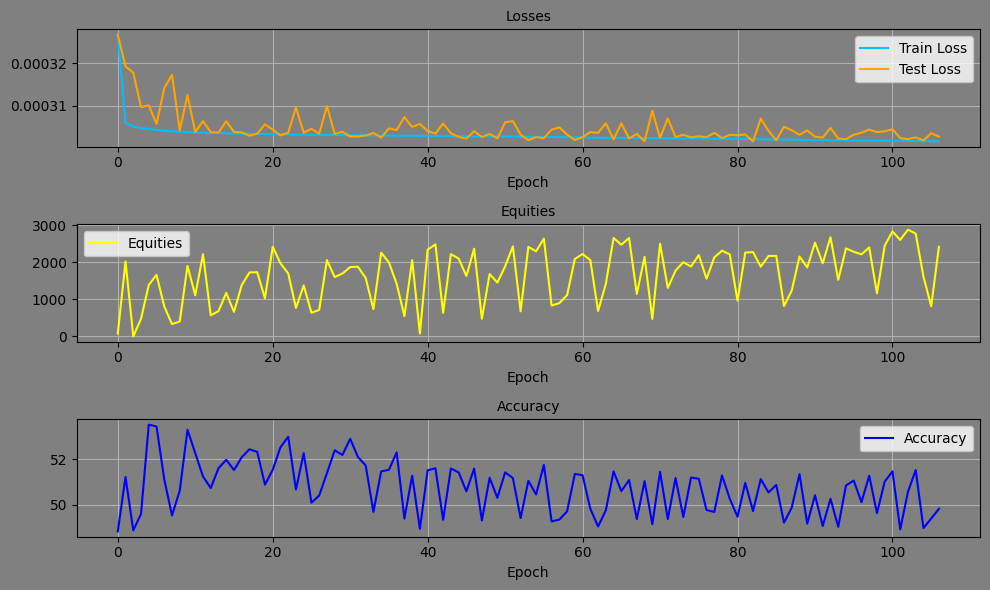

Epoch: 106, Equity: 2164.69, Accuracy: 51.02 train_losses: 0.0007494379946190592, test_losses: 0.0003041618620045483, Duration: 0:00:04.494607


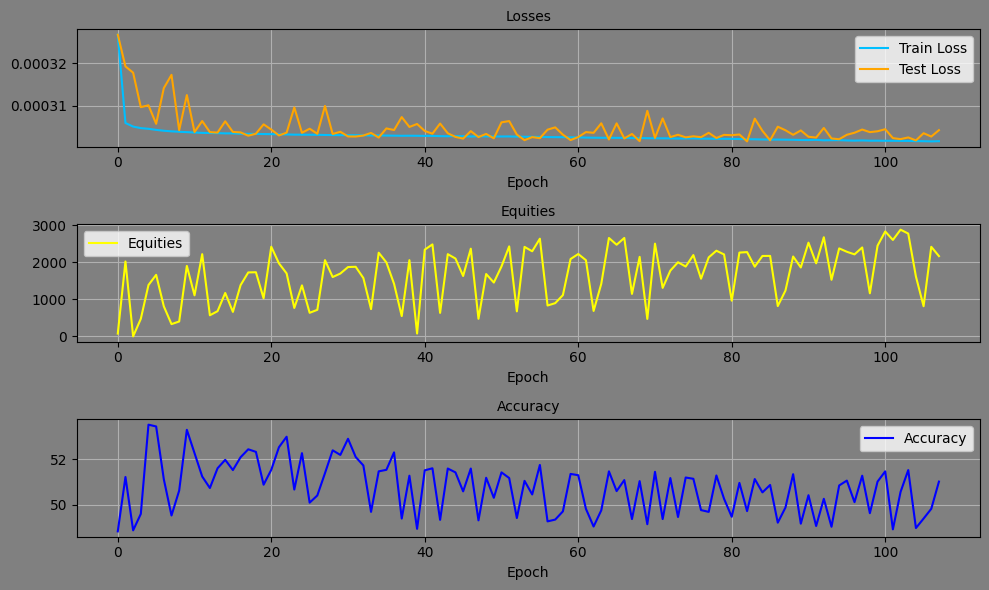

Epoch: 107, Equity: 2217.47, Accuracy: 49.62 train_losses: 0.0007484032893350374, test_losses: 0.0003015565744135529, Duration: 0:00:04.460360


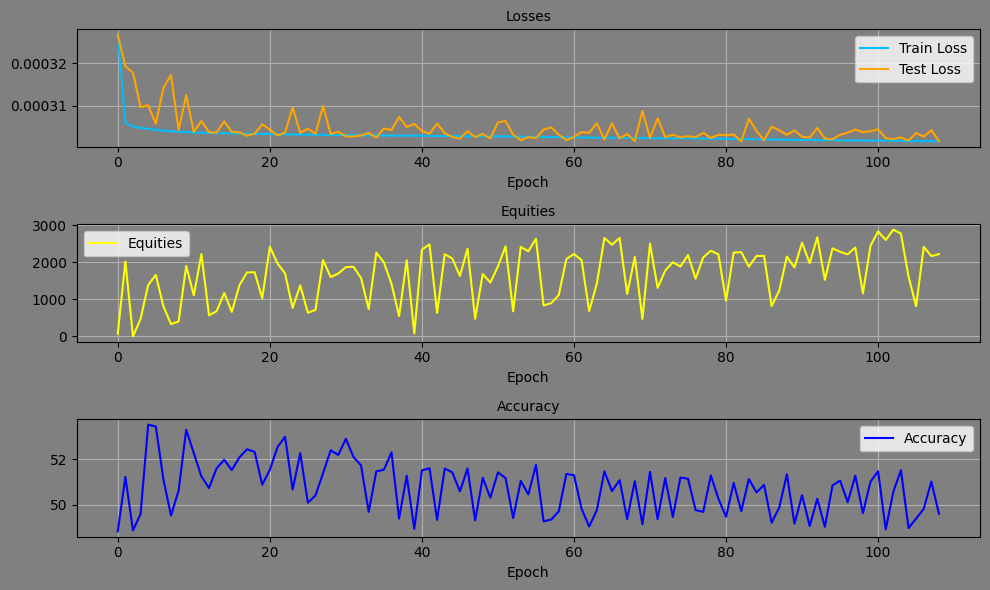

Epoch: 108, Equity: 763.75, Accuracy: 49.65 train_losses: 0.0007488377514887161, test_losses: 0.0003040623851120472, Duration: 0:00:04.767109


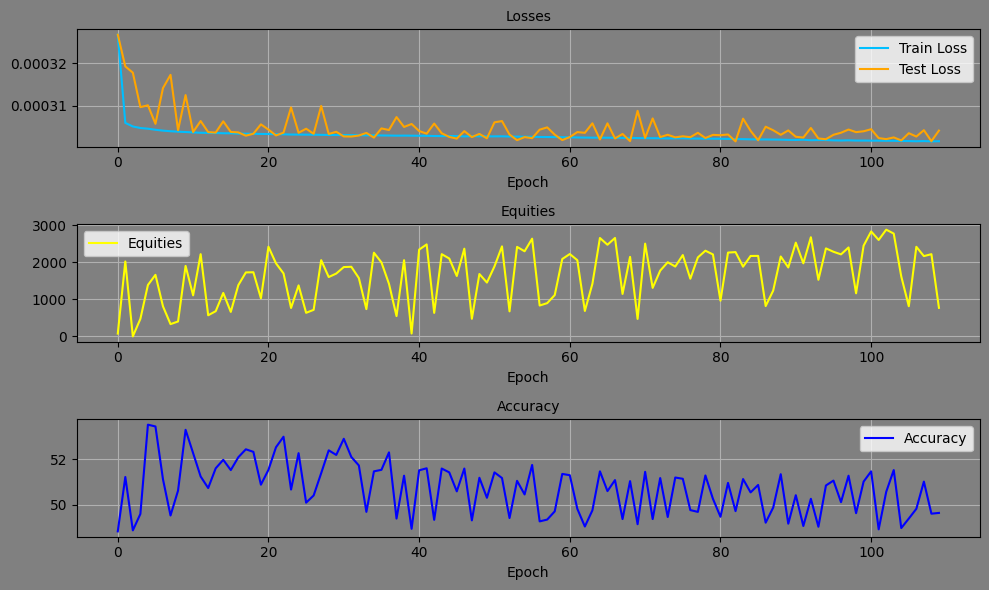

Epoch: 109, Equity: 2668.02, Accuracy: 50.73 train_losses: 0.0007489837139047663, test_losses: 0.0003020873118657619, Duration: 0:00:05.108974


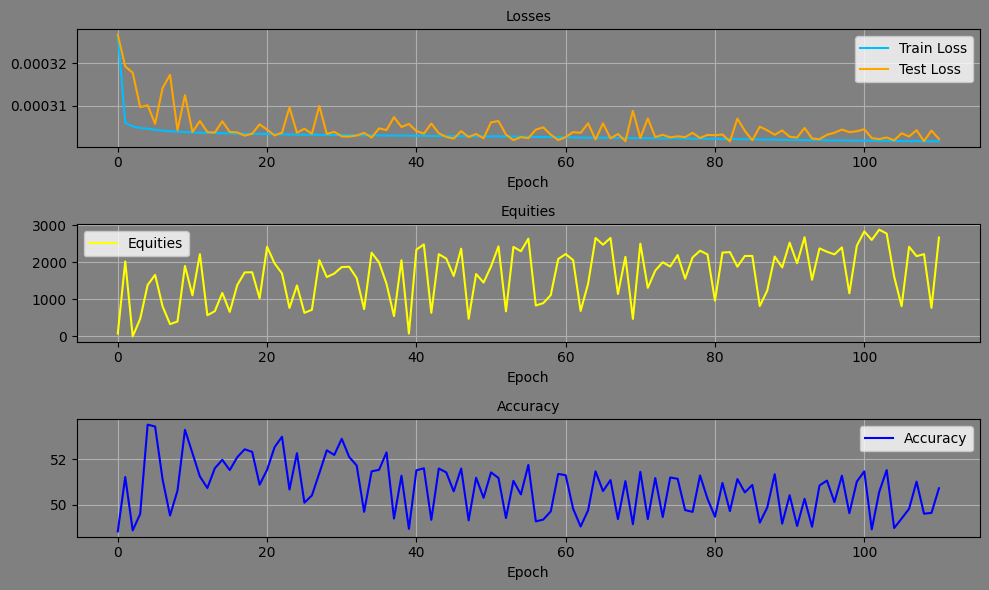

Epoch: 110, Equity: 2546.50, Accuracy: 51.50 train_losses: 0.0007485475006792528, test_losses: 0.0003061479947064072, Duration: 0:00:05.050780


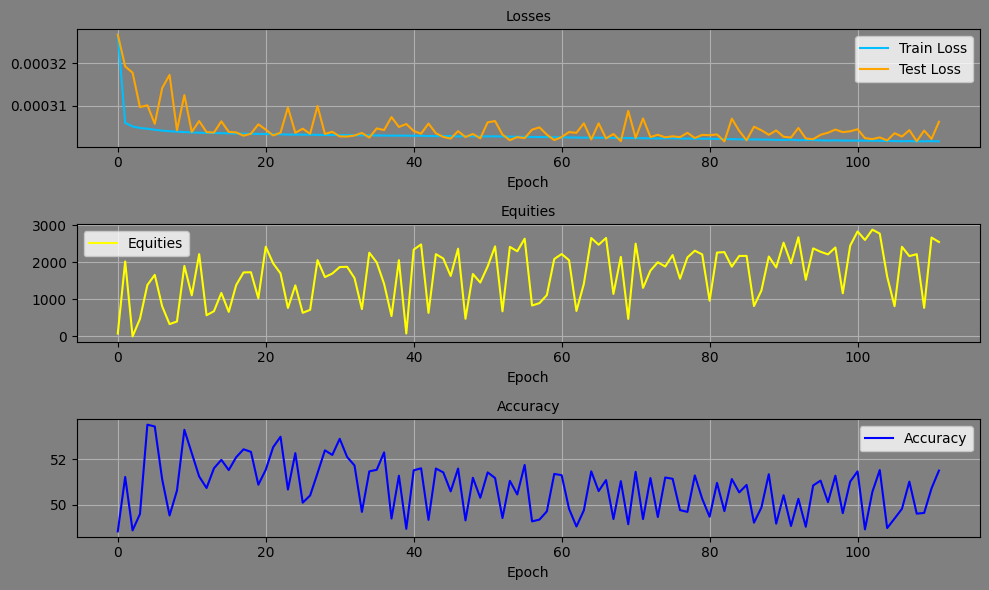

Epoch: 111, Equity: 1449.16, Accuracy: 48.67 train_losses: 0.000747623353381296, test_losses: 0.0003013823297806084, Duration: 0:00:04.986846


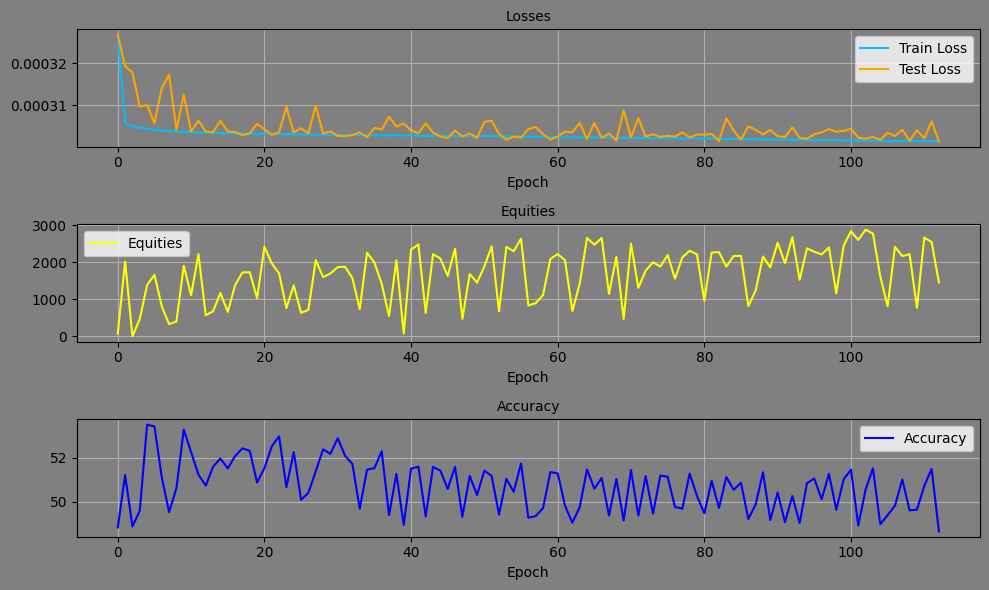

Epoch: 112, Equity: 1154.05, Accuracy: 49.37 train_losses: 0.0007476476678536506, test_losses: 0.0003024154284503311, Duration: 0:00:05.041265


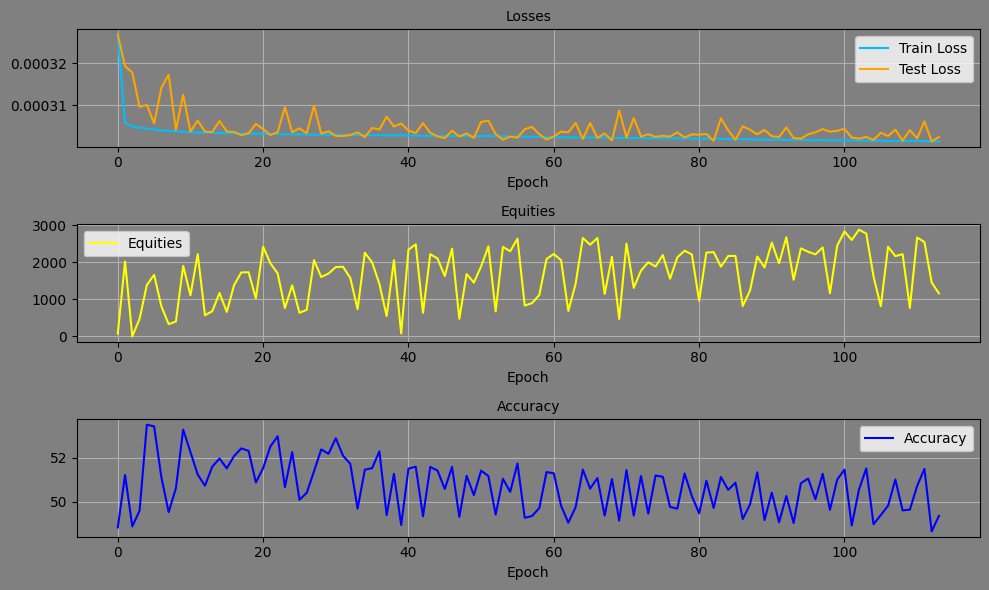

Epoch: 113, Equity: 486.00, Accuracy: 49.30 train_losses: 0.0007482899138962183, test_losses: 0.0003053134132642299, Duration: 0:00:04.713351


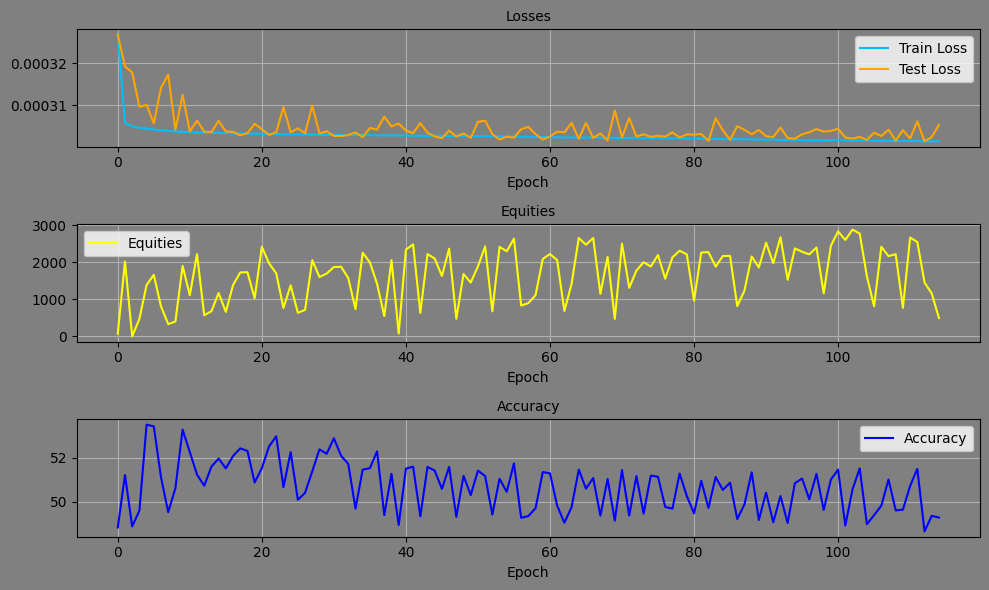

Epoch: 114, Equity: 3060.01, Accuracy: 50.84 train_losses: 0.000746525927892627, test_losses: 0.0003032479726243764, Duration: 0:00:05.123422


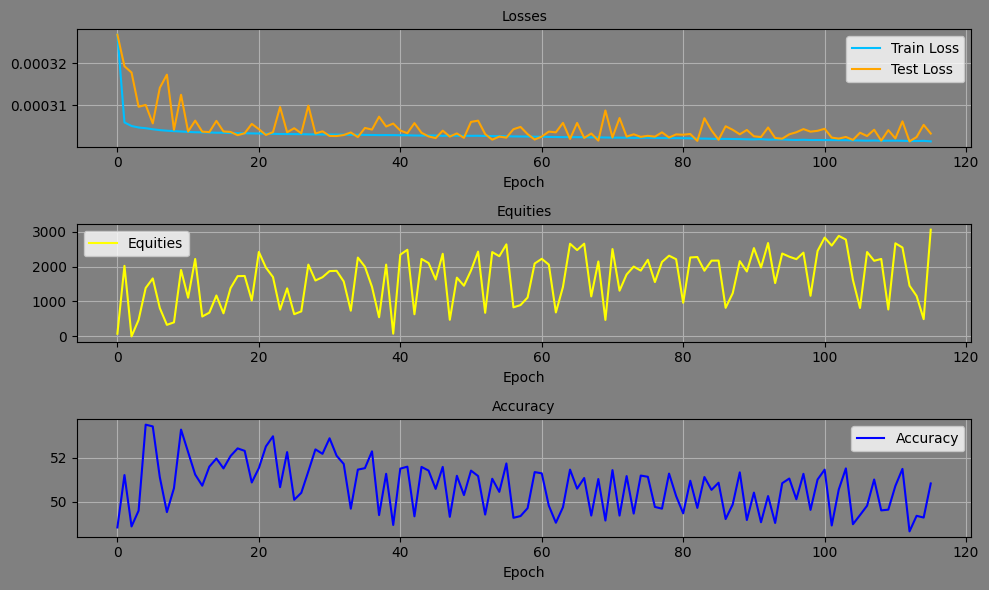

KeyboardInterrupt: 

In [15]:
for epoch in range(epoch, num_epochs):

    # Track duration
    dt0_epoch = datetime.now()

    # Create mini batches
    mini_batches, seed = create_minibatches(X_train, Y_train, batch_size, seed, shuffle=True)

    train_losses_batch = []

    for X_train_batch, Y_train_batch in mini_batches:
        # Set train mode
        model.train()

        # Reset the gradients
        optimizer.zero_grad()

        # Forward propagation
        Y_hat_train = model(X_train_batch) # Shape: (batch_size, num_features)

        # Calculate loss (train)
        train_loss = criterion(Y_hat_train, Y_train_batch)

        # Backprop
        train_loss.backward()

        # Update optimizer
        optimizer.step()

        # Keep track of training losses
        train_losses_batch.append(train_loss.item())

    # Predict on val slice (selection period)
    with torch.no_grad():

        # Set evaluation mode
        model.eval()

        # # Forward propagation
        # Y_pred_val = model(X_val)

        # Forward propagation (chunks)
        while True:
            try:
                # split the test set into chunks
                chunks = 16
                m = m_val // chunks
                
                for j in range(chunks+1):
                    Y_pred_val[m*j:m*j+m] = model(X_val[m*j:m*j+m]) # Forward prop
                
                break

            except Exception as err:
                print(f"Chunks = {chunks} is too large: {err}")
                chunks += 2

        # Calculate test loss
        test_loss = criterion(Y_pred_val, Y_val)

    # Convert 'Y_pred_val' to numpy
    Y_pred_val_cpu = Y_pred_val.detach().cpu().numpy()

    train_losses.append(np.mean(train_losses_batch))
    test_losses.append(test_loss.item())

    # ===================== Backtest =====================
    equities = []    # Store equity (account value) over time
    pos_size = 1000  # Fixed position size ($1000 per trade)
    equity = 1000    # Starting capital
    correct_pred = 0 # Initialize correct prediction

    actions = Y_pred_val_cpu[:, 0] > 0 # Get model's buy/sell predictions

    for i in range(len(X_val)-1):
        curr_open = val_opens[i]   # the price we enter at.
        curr_close = val_closes[i] # the price we exit at.
        curr_action = actions[i]        # the model’s signal (buy or sell).

        # Calculate percentage price change
        pct_change = (curr_close - curr_open) / curr_open

        # Profit or loss in dollars
        pnl = np.abs(pos_size * pct_change)

        # Update equity depending on action and price move
        if curr_action == 1:     # Long position (Buy side)
            if pct_change > 0:
                equity += pnl    # Price up → profit
                correct_pred += 1
            elif pct_change < 0:
                equity -= pnl    # Price down → loss

        elif curr_action == 0:   # Short position
            if pct_change > 0:
                equity -= pnl    # Price up → loss
            elif pct_change < 0:
                equity += pnl    # Price down → profit
                correct_pred += 1

        equities.append(equity) # Save current equity
    # ========================================================

    # Calculate percentage accuracy
    accuracy = correct_pred / len(X_val) * 100

    # Save final equity for each epoch
    equity_epochs.append(equity)
    accuracy_epochs.append(accuracy)

    print(f'Epoch: {epoch}, Equity: {equity:.2f}, Accuracy: {accuracy:.2f} train_losses: {train_losses[-1]}, test_losses: {test_losses[-1]}, Duration: {datetime.now() - dt0_epoch}')

    # Save training process
    torch.save({
        'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'train_losses': train_losses,
        'test_losses': test_losses,
        'equity_epochs': equity_epochs,
        'accuracy_epochs': accuracy_epochs,
        'seed': seed,
    }, 'training_process')

    if equity > 1200:
        torch.save(model.state_dict(), f"models/eq_{equity:.0f}_ep_{epoch}.pt")

    # Plot training process
    fig, axs = plt.subplots(nrows=3, ncols=1, figsize=(10, 6))
    scaler_testloss = MinMaxScaler(feature_range=(np.min(test_losses)-0.0000000001, np.max(test_losses)))

    # Plot Train Loss and Test Loss
    axs[0].set_title(f"Losses", fontsize=10)
    axs[0].plot(scaler_testloss.fit_transform(np.array(train_losses).reshape(-1,1)), label='Train Loss', color='deepskyblue')
    axs[0].plot(test_losses, label='Test Loss', color='orange')
    axs[0].set_xlabel("Epoch")
    axs[0].legend()
    axs[0].grid()
    # Plot Equities
    axs[1].set_title(f"Equities", fontsize=10)
    axs[1].plot(equity_epochs, label='Equities', color='yellow')
    axs[1].set_xlabel("Epoch")
    axs[1].legend()
    axs[1].grid()
    # Plot Accuracy
    axs[2].set_title(f"Accuracy", fontsize=10)
    axs[2].plot(accuracy_epochs, label='Accuracy', color='blue')
    axs[2].set_xlabel("Epoch")
    axs[2].legend()
    axs[2].grid()
    # Set background color and paper color
    fig.patch.set_facecolor(mcolors.to_hex('grey'))  # Set paper color
    for ax in axs.flat:
        ax.set_facecolor(mcolors.to_hex('grey'))  # Set bg color
    # Display
    plt.tight_layout()
    plt.savefig(f'training_process.png')
    plt.show()
    plt.close()


In [ ]:
import json
import re

split_info = {"train_end": TRAIN_END, "val_end": VAL_END, "total_rows": int(len(df))}
with open(ARTIFACTS / "split_info.json", "w", encoding="utf-8") as f:
    json.dump(split_info, f, indent=2)

with open(ARTIFACTS / "scalers.pkl", "wb") as f:
    pickle.dump(train_scalers, f)

models_dir = Path("models").resolve()
pt_files = []
for fname in os.listdir(models_dir):
    if not fname.endswith(".pt"):
        continue
    m = re.match(r"^eq_(\d+)_ep_", fname)
    if not m:
        continue
    eq = float(m.group(1))
    rel_path = os.path.relpath(str(models_dir / fname), str(CNN_ROOT)).replace(os.sep, "/")
    pt_files.append((eq, rel_path))

pt_files.sort(key=lambda x: -x[0])
top3 = [p for _, p in pt_files[:3]]

manifest_path = ARTIFACTS / "manifest.json"
manifest = {}
if manifest_path.is_file():
    with open(manifest_path, "r", encoding="utf-8") as f:
        manifest = json.load(f)
manifest[ARCH_MANIFEST_KEY] = top3
with open(manifest_path, "w", encoding="utf-8") as f:
    json.dump(manifest, f, indent=2)

print("Written:", ARTIFACTS / "split_info.json", ARTIFACTS / "scalers.pkl", manifest_path)
print("manifest key:", ARCH_MANIFEST_KEY, "top3:", top3)
